# Brazil's COVID Response 

**Isheka Agarwal**: South Korea data<br/>
**Harkirat Bhullar** India data<br/>
**Felicia Roman**: Italy data<br/>
**Alex Zhou**: Brazil Data<br/>

<hr style='height:2px'>

In [1]:
#RUN THIS CELL
import requests
from IPython.core.display import HTML
styles = requests.get("http://raw.githubusercontent.com/Harvard-IACS/2018-CS109A/master/content/styles/cs109.css").text
HTML(styles)

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_validate
from collections import defaultdict

<a id="Contents"></a>

## Contents

- [ITALY](#Italy)
    - [Data Cleaning](#Italyclean)
    - [Visualizations](#Italyvisuals)
    - [Polynomial Regression Model](#Italypoly)
    - [Time Series Model](#Italytime)
        - [Modeling for daily cases](#Italycases)
            - [SARIMA](#Italysarima)
            - [Simple Exponential Smoothing (SES)](#Italyses)
            - [Holt’s Linear Trend Method](#Italyholt)
            - [Holt-Winters’ Seasonal Method](#Italywinters)
            - [ARIMA](#Italyarima)
        - [Choosing a time series model](#Italychoose)
        - [Modeling for daily deaths](#Italydeaths)
            - [SARIMA](#Italysarima2)
            - [Simple Exponential Smoothing (SES)](#Italyses2)
            - [ARIMA](#Italyarima2)
- [SOUTH KOREA](#SouthKorea)
    - [Data Cleaning](#Southclean)
    - [Visualizations](#Southvisuals)
    - [Polynomial Regression Model](#Southpoly)
    - [Time Series Model](#Southtime)
        - [Modeling for daily cases](#Southcases)
            - [SARIMA](#Southsarima)
            - [Simple Exponential Smoothing (SES)](#Southses)
            - [Holt-Winters’ Seasonal Method](#Southwinters)
            - [ARIMA](#Southarima)
        - [Choosing a time series model](#Southchoose)
        - [Modeling for death count](#Southdeath)
            - [SARIMA](#Southsarima2)
- [INDIA](#India)
    - [Data Cleaning](#Indiaclean)
    - [Visualizations](#Indiavisuals)
    - [Polynomial Regression Model](#Indiapoly)
    - [Time Series Prep](#Indiaprep)
    - [Simple Exponential Smoothing (SES)](#Indiases)
    - [SARIMA for Cases](#Indiasarima1)
    - [SARIMA for Deaths](#Indiasarima2)
    - [Choosing a time series model](#Indiachoose)
- [BRAZIL](#Brazil)
    - [Data Cleaning](#Brazilclean)
    - [Visualizations](#Brazilvisuals)
    - [Time Series Model](#Braziltime)
        - [SARIMA](#Brazilsarima)
        - [Simple Exponential Smoothing (SES)](#Brazilses)
        - [ARIMA](#Brazilarima)
        - [Choosing a time series model](#Brazilchoose)
- [CONCLUSION](#Conclusion)
    - [Combined visualizations](#Combinedvisuals)

<a id="Italy"></a>

# ITALY
[▲ Return to contents](#Contents)

<a id="Italyclean"></a>

## Data Cleaning
[▲ Return to contents](#Contents)

In [3]:
df_province = pd.read_csv('Data/Italy/covid19_italy_province.csv')
df_region = pd.read_csv('Data/Italy/covid19_italy_region.csv')

In [4]:
df_region.head()

,SNo,Date,Country,RegionCode,RegionName,Latitude,Longitude,HospitalizedPatients,IntensiveCarePatients,TotalHospitalizedPatients,HomeConfinement,CurrentPositiveCases,NewPositiveCases,Recovered,Deaths,TotalPositiveCases,TestsPerformed
0,0,2020-02-24T18:00:00,ITA,13,Abruzzo,42.351222,13.398438,0,0,0,0,0,0,0,0,0,NaN
1,1,2020-02-24T18:00:00,ITA,17,Basilicata,40.639471,15.805148,0,0,0,0,0,0,0,0,0,NaN
2,2,2020-02-24T18:00:00,ITA,18,Calabria,38.905976,16.594402,0,0,0,0,0,0,0,0,0,NaN
3,3,2020-02-24T18:00:00,ITA,15,Campania,40.839566,14.250850,0,0,0,0,0,0,0,0,0,NaN
4,4,2020-02-24T18:00:00,ITA,8,Emilia-Romagna,44.494367,11.341721,10,2,12,6,18,18,0,0,18,NaN


In [5]:
df_region.groupby(by='Date').sum().head()

,SNo,RegionCode,Latitude,Longitude,HospitalizedPatients,IntensiveCarePatients,TotalHospitalizedPatients,HomeConfinement,CurrentPositiveCases,NewPositiveCases,Recovered,Deaths,TotalPositiveCases,TestsPerformed
Date,,,,,,,,,,,,,,
2020-02-24T18:00:00,210,249,903.972147,256.745065,101,26,127,94,221,221,1,7,229,0.0
2020-02-25T18:00:00,651,249,903.972147,256.745065,114,35,149,162,311,93,1,10,322,0.0
2020-02-26T18:00:00,1092,249,903.972147,256.745065,128,36,164,221,385,78,3,12,400,0.0
2020-02-27T18:00:00,1533,249,903.972147,256.745065,248,56,304,284,588,250,45,17,650,0.0
2020-02-28T18:00:00,1974,249,903.972147,256.745065,345,64,409,412,821,238,46,21,888,0.0


In [6]:
new_df = df_region.groupby(by='Date').sum().reset_index()

In [7]:
national_dailynewcases = df_region.groupby(by='Date').sum()['NewPositiveCases'].values
national_currentpositive = df_region.groupby(by='Date').sum()['CurrentPositiveCases'].values
national_totalpositive = df_region.groupby(by='Date').sum()['TotalPositiveCases'].values
national_recovered = df_region.groupby(by='Date').sum()['Recovered'].values
national_deaths = df_region.groupby(by='Date').sum()['Deaths'].values
national_home = df_region.groupby(by='Date').sum()['HomeConfinement'].values
national_hospital = df_region.groupby(by='Date').sum()['HospitalizedPatients'].values
national_intensive = df_region.groupby(by='Date').sum()['IntensiveCarePatients'].values
national_tests = df_region.groupby(by='Date').sum()['TestsPerformed'].values

In [8]:
df_region.groupby(by='RegionName').sum().sort_values(by='NewPositiveCases', ascending=False)

,SNo,RegionCode,Latitude,Longitude,HospitalizedPatients,IntensiveCarePatients,TotalHospitalizedPatients,HomeConfinement,CurrentPositiveCases,NewPositiveCases,Recovered,Deaths,TotalPositiveCases,TestsPerformed
RegionName,,,,,,,,,,,,,,
Lombardia,427937,606,9184.292406,1856.450176,720927,69040,789967,2414326,3204293,103068,9134484,2619880,14958657,89979348.0
Piemonte,428947,202,9104.801449,1551.498872,213983,21270,235253,738727,973980,33671,3279383,602648,4856011,36756393.0
Emilia-Romagna,427129,1616,8987.862096,2291.027602,197008,20047,217055,682277,899332,33397,3142737,668548,4710617,45318252.0
Veneto,430361,1010,9177.850780,2492.367330,80750,13544,94294,557338,651632,24666,2304541,300511,3256684,60208433.0
Toscana,429755,1818,8841.384616,2273.689548,52672,13211,65883,325341,391224,13023,1137971,165099,1694294,34179251.0
Lazio,427533,2424,8462.339629,2521.700778,115074,11245,126319,313521,439840,12979,790391,117521,1347752,41215954.0
Liguria,427735,1414,8971.121616,1804.405238,58998,7473,66471,168799,235270,11774,1095747,232008,1563025,11773610.0
Campania,426927,3030,8249.592241,2878.671668,41015,4666,45681,193698,239379,8961,527260,66580,833219,20258931.0
Marche,428139,2222,8810.585465,2730.812811,48767,6922,55689,201367,257056,7513,716997,159110,1133163,12095138.0


In [9]:
region_cases = df_region.groupby(by='RegionName').sum().sort_values(by='NewPositiveCases', ascending=False)['NewPositiveCases'].values
regions = df_region.groupby(by='RegionName').sum().sort_values(by='NewPositiveCases', ascending=False).reset_index()['RegionName'].values

<a id="Italyvisuals"></a>

## Visualizations
[▲ Return to contents](#Contents)

In [10]:
df_region_date = df_region.groupby(by='Date').sum().reset_index()

high_dailycases = df_region_date.iloc[df_region_date['NewPositiveCases'].idxmax()]

high_currentcases = df_region_date.iloc[df_region_date['CurrentPositiveCases'].idxmax()]

low_dailycases = df_region_date.iloc[df_region_date['NewPositiveCases'].idxmin()]

low_currentcases = df_region_date.iloc[df_region_date['CurrentPositiveCases'].idxmin()]

print("Highest daily new cases on March 21 (6557 new cases)\nLowest daily new cases on February 26 (78 new cases)")

print("\nHighest current positive cases on April 19 (108257 positive cases)\nLowest current positive cases on February 24 (221 positive cases)")

Highest daily new cases on March 21 (6557 new cases)
Lowest daily new cases on February 26 (78 new cases)

Highest current positive cases on April 19 (108257 positive cases)
Lowest current positive cases on February 24 (221 positive cases)


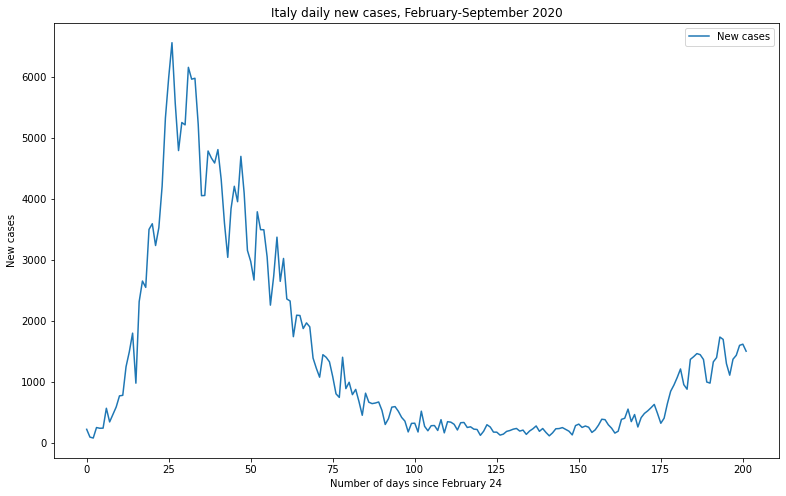

In [11]:
plt.figure(figsize=(13,8))
plt.plot(range(202), national_dailynewcases, label="New cases")
#plt.plot(range(55), accs_test, '-+', label="Test accuracy")
plt.legend()
plt.title("Italy daily new cases, February-September 2020")
plt.ylabel("New cases")
plt.xlabel("Number of days since February 24")
plt.show();

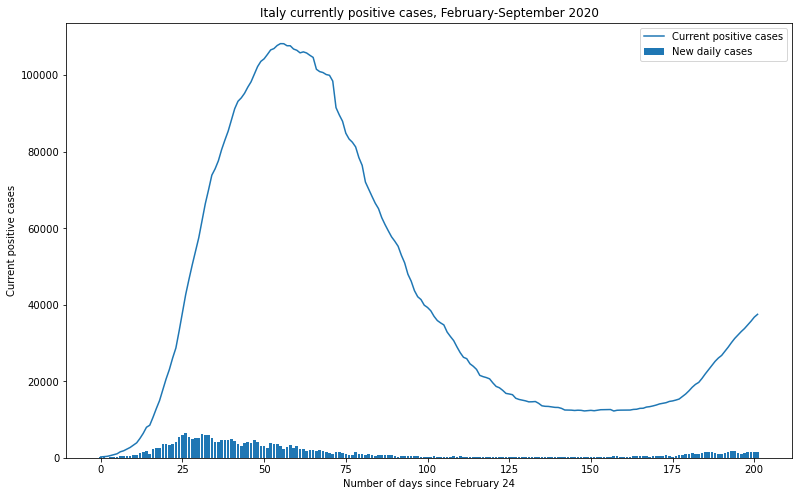

In [12]:
plt.figure(figsize=(13,8))
plt.plot(range(202), national_currentpositive, label="Current positive cases")
plt.bar(range(202), national_dailynewcases, label="New daily cases")
plt.legend()
plt.title("Italy currently positive cases, February-September 2020")
plt.ylabel("Current positive cases")
plt.xlabel("Number of days since February 24")
plt.show();

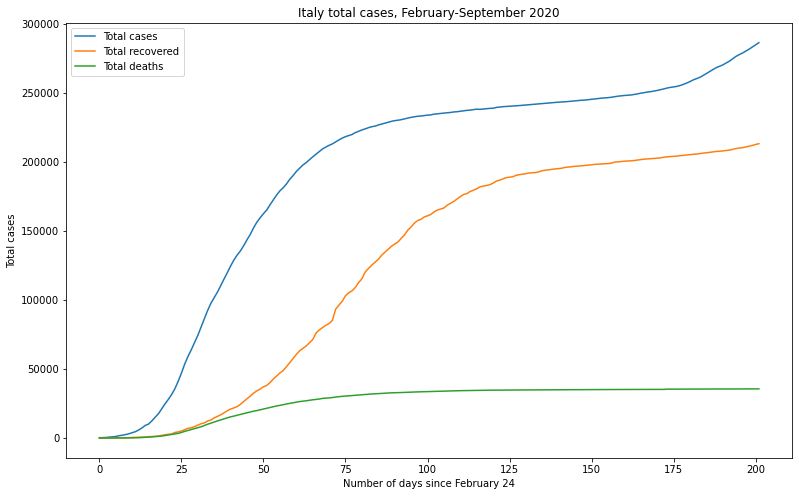

In [13]:
plt.figure(figsize=(13,8))
plt.plot(range(202), national_totalpositive, label="Total cases")
plt.plot(range(202), national_recovered, label="Total recovered")
plt.plot(range(202), national_deaths, label="Total deaths")

plt.legend()
plt.title("Italy total cases, February-September 2020")
plt.ylabel("Total cases")
plt.xlabel("Number of days since February 24")
plt.show();

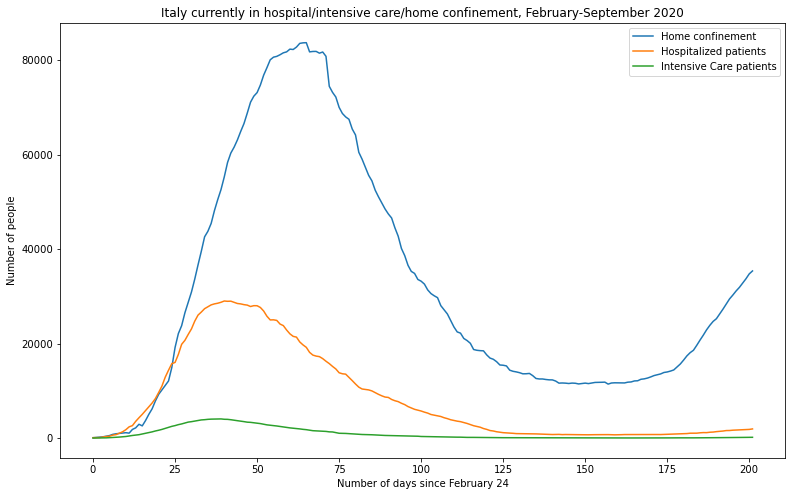

In [14]:
plt.figure(figsize=(13,8))
plt.plot(range(202), national_home, label="Home confinement")
plt.plot(range(202), national_hospital, label="Hospitalized patients")
plt.plot(range(202), national_intensive, label="Intensive Care patients")

plt.legend()
plt.title("Italy currently in hospital/intensive care/home confinement, February-September 2020")
plt.ylabel("Number of people")
plt.xlabel("Number of days since February 24")
plt.show();

In [15]:
daily_deaths_italy = [national_deaths[0]]

for i in range(1, len(national_deaths)):
    change = national_deaths[i] - national_deaths[i-1]
    daily_deaths_italy.append(change)

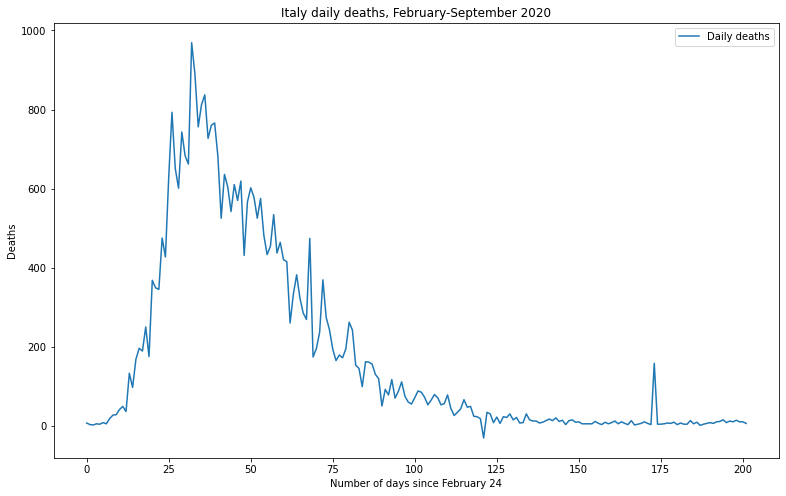

In [16]:
plt.figure(figsize=(13,8))
plt.plot(range(202), daily_deaths_italy, label="Daily deaths")
#plt.plot(range(55), accs_test, '-+', label="Test accuracy")
plt.legend()
plt.title("Italy daily deaths, February-September 2020")
plt.ylabel("Deaths")
plt.xlabel("Number of days since February 24")
plt.show();

In [17]:
daily_recovered_italy = [national_recovered[0]]

for i in range(1, len(national_recovered)):
    change = national_recovered[i] - national_recovered[i-1]
    daily_recovered_italy.append(change)

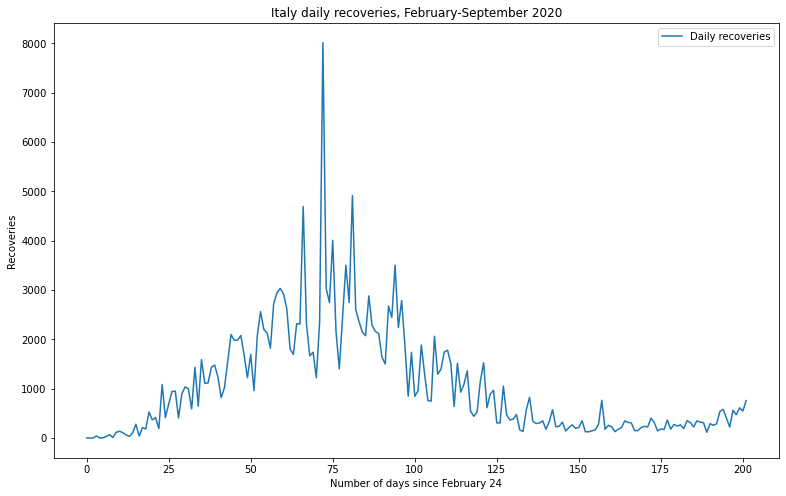

In [18]:
plt.figure(figsize=(13,8))
plt.plot(range(202), daily_recovered_italy, label="Daily recoveries")
#plt.plot(range(55), accs_test, '-+', label="Test accuracy")
plt.legend()
plt.title("Italy daily recoveries, February-September 2020")
plt.ylabel("Recoveries")
plt.xlabel("Number of days since February 24")
plt.show();

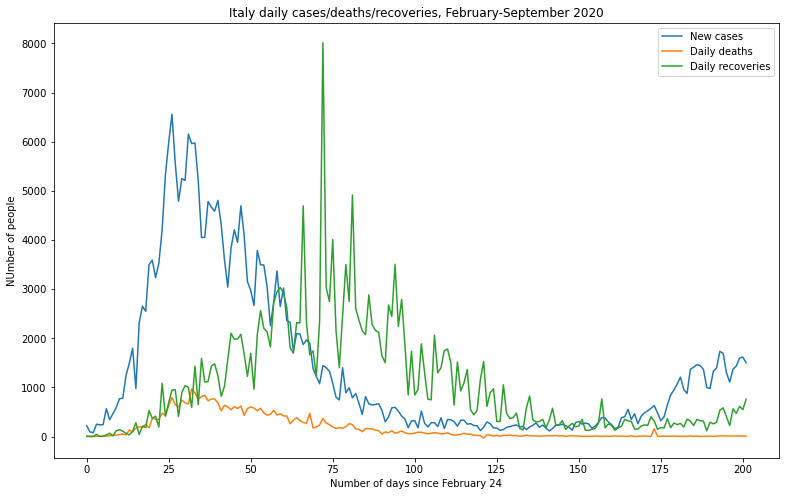

In [19]:
plt.figure(figsize=(13,8))
plt.plot(range(202), national_dailynewcases, label="New cases")
plt.plot(range(202), daily_deaths_italy, label="Daily deaths")
plt.plot(range(202), daily_recovered_italy, label="Daily recoveries")
#plt.plot(range(55), accs_test, '-+', label="Test accuracy")
plt.legend()
plt.title("Italy daily cases/deaths/recoveries, February-September 2020")
plt.ylabel("NUmber of people")
plt.xlabel("Number of days since February 24")
plt.show();

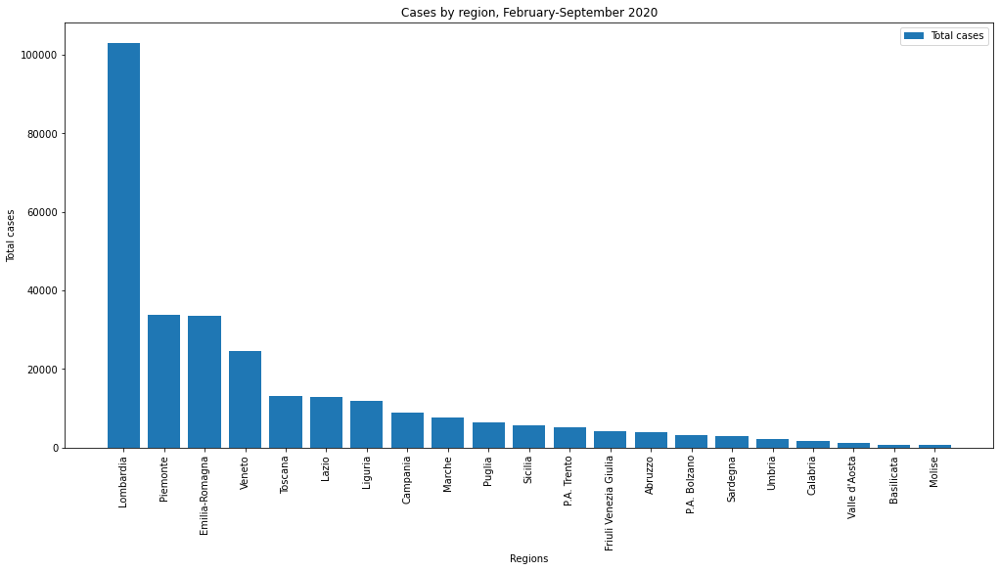

In [20]:
plt.figure(figsize=(17,8))
plt.bar(regions, region_cases, label="Total cases")
#plt.plot(range(55), accs_test, '-+', label="Test accuracy")
plt.legend()
plt.title("Cases by region, February-September 2020")
plt.ylabel("Total cases")
plt.xlabel("Regions")
plt.xticks(rotation=90)
plt.show();

In [21]:
daily_tests = []

for i in range(56, len(national_tests)):
    change = national_tests[i] - national_tests[i-1]
    daily_tests.append(change)

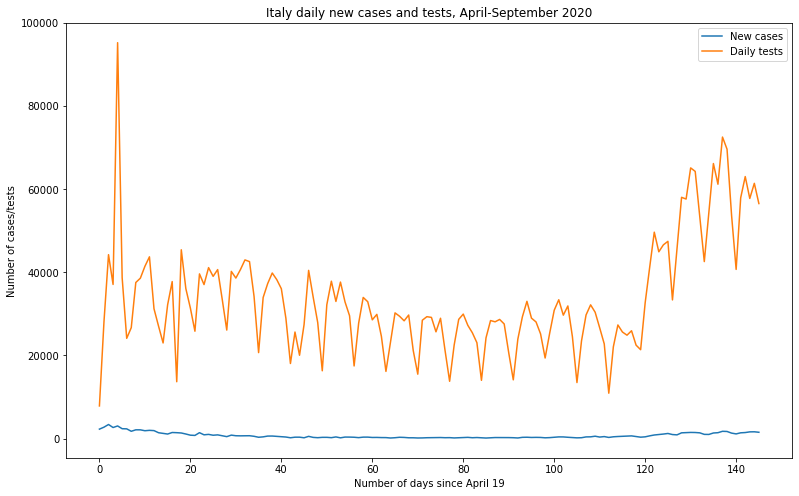

In [22]:
plt.figure(figsize=(13,8))
plt.plot(range(146), national_dailynewcases[56:], label="New cases")
plt.plot(range(146), daily_tests, label="Daily tests")
#plt.plot(range(55), accs_test, '-+', label="Test accuracy")
plt.legend()
plt.title("Italy daily new cases and tests, April-September 2020")
plt.ylabel("Number of cases/tests")
plt.xlabel("Number of days since April 19")
plt.show();

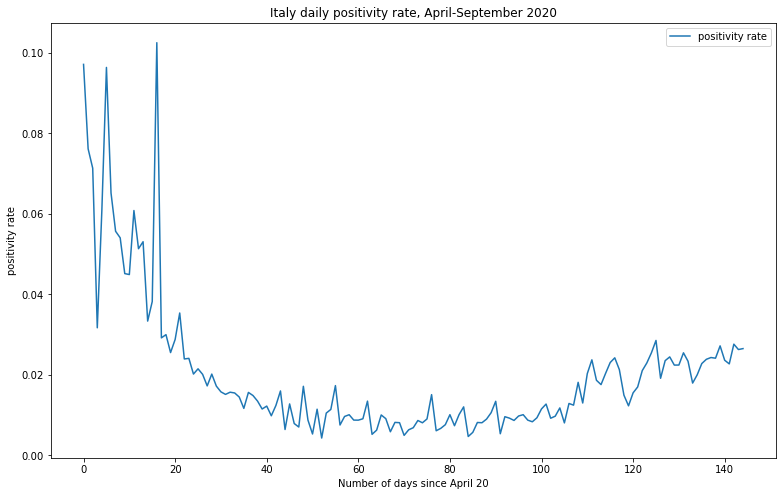

In [23]:
plt.figure(figsize=(13,8))
plt.plot(range(145), (national_dailynewcases[56:]/daily_tests)[1:], label="positivity rate")
#plt.plot(range(55), accs_test, '-+', label="Test accuracy")
plt.legend()
plt.title("Italy daily positivity rate, April-September 2020")
plt.ylabel("positivity rate")
plt.xlabel("Number of days since April 20")
plt.show();

In [24]:
df_new = df_region.tail(21).sort_values(by='TestsPerformed', ascending=False).reset_index()

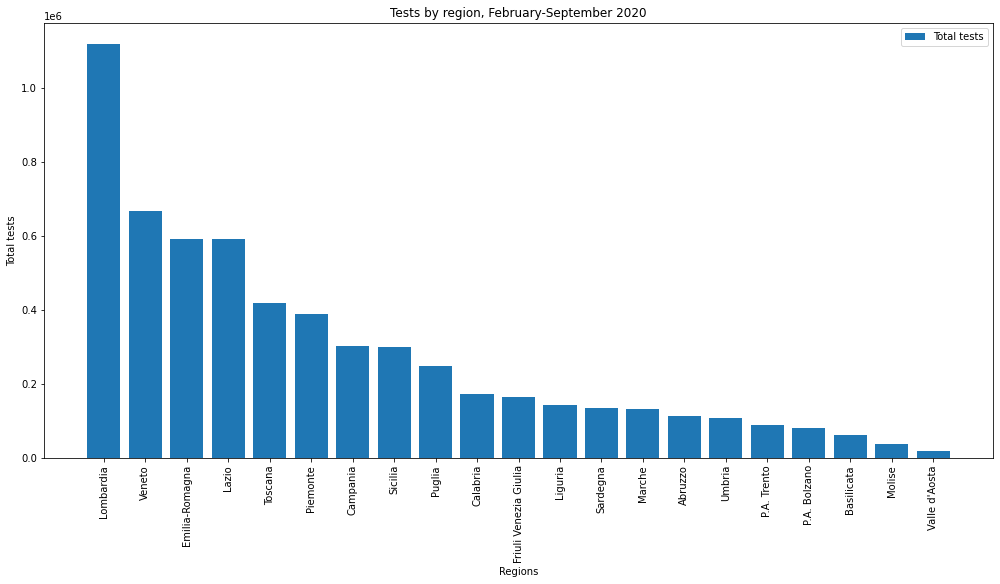

In [25]:
plt.figure(figsize=(17,8))
plt.bar(df_new['RegionName'].values, df_new['TestsPerformed'].values, label="Total tests")
#plt.plot(range(55), accs_test, '-+', label="Test accuracy")
plt.legend()
plt.title("Tests by region, February-September 2020")
plt.ylabel("Total tests")
plt.xlabel("Regions")
plt.xticks(rotation=90)
plt.show();

In [26]:
df_new1 = df_region.tail(21).sort_values(by='Deaths', ascending=False).reset_index()

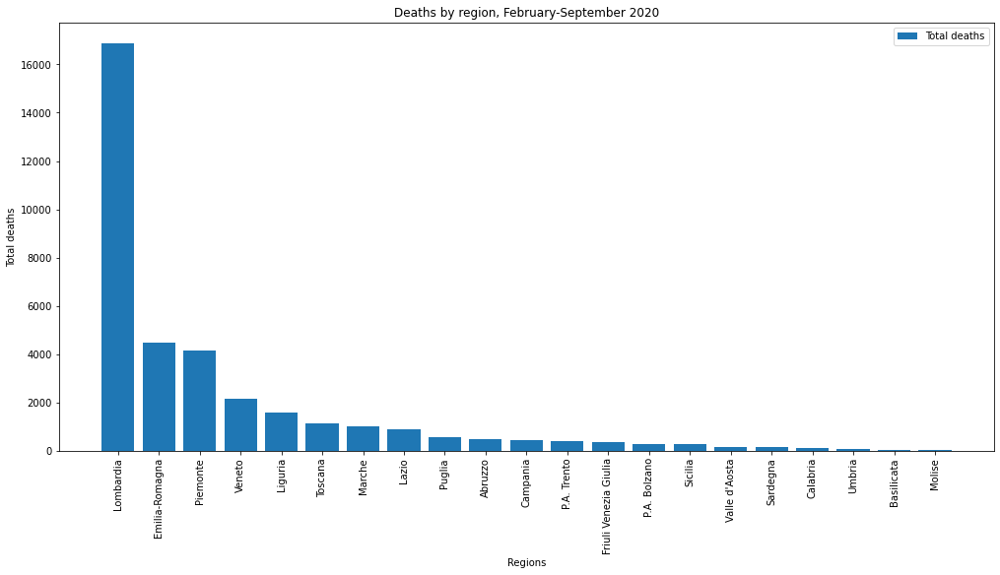

In [27]:
plt.figure(figsize=(17,8))
plt.bar(df_new1['RegionName'].values, df_new1['Deaths'].values, label="Total deaths")
#plt.plot(range(55), accs_test, '-+', label="Test accuracy")
plt.legend()
plt.title("Deaths by region, February-September 2020")
plt.ylabel("Total deaths")
plt.xlabel("Regions")
plt.xticks(rotation=90)
plt.show();

In [28]:
f_new = df_region.tail(21).sort_values(by='Recovered', ascending=False).reset_index()

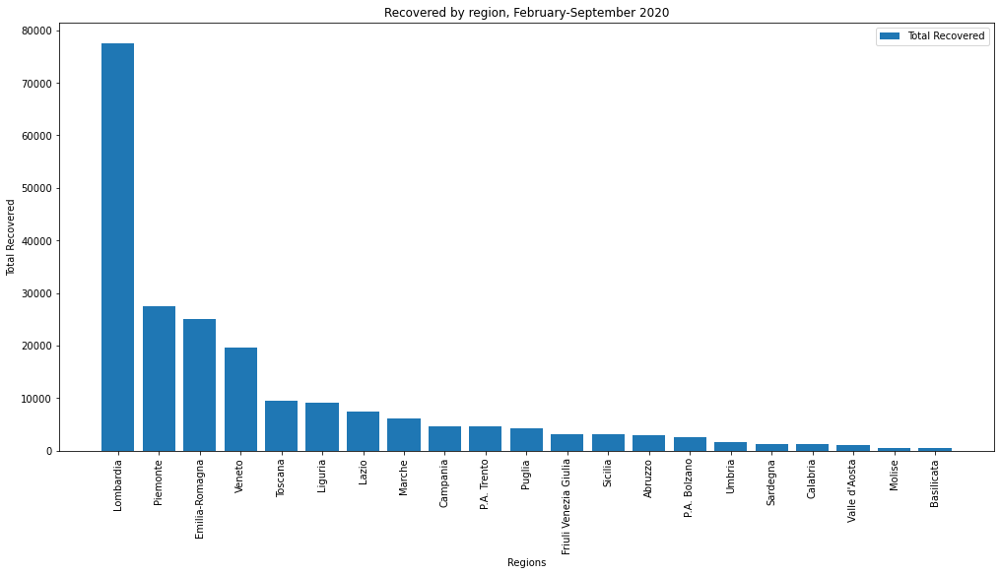

In [29]:
plt.figure(figsize=(17,8))
plt.bar(f_new['RegionName'].values, f_new['Recovered'].values, label="Total Recovered")
#plt.plot(range(55), accs_test, '-+', label="Test accuracy")
plt.legend()
plt.title("Recovered by region, February-September 2020")
plt.ylabel("Total Recovered")
plt.xlabel("Regions")
plt.xticks(rotation=90)
plt.show();

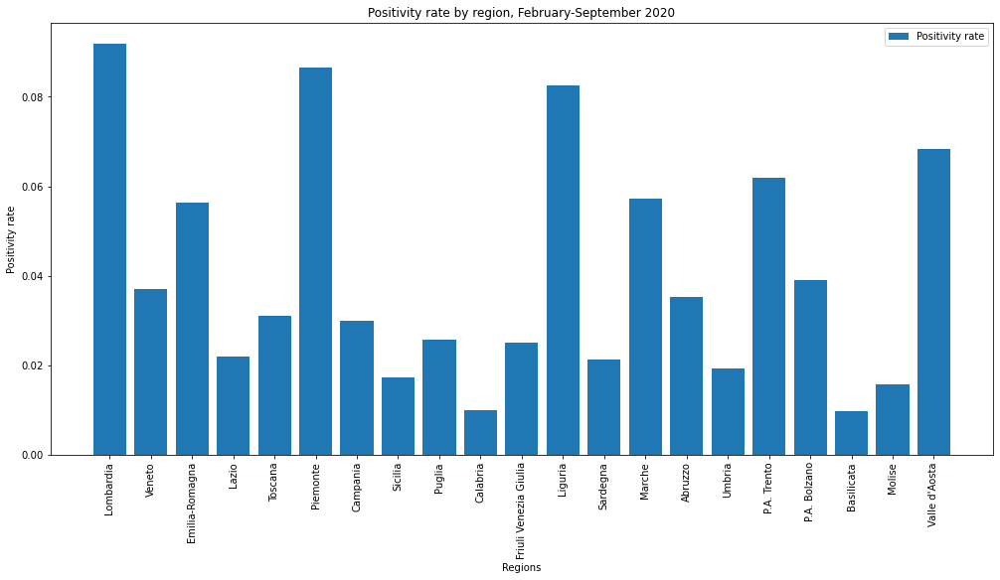

In [30]:
plt.figure(figsize=(17,8))
plt.bar(df_new['RegionName'].values, (df_new['TotalPositiveCases'].values)/(df_new['TestsPerformed'].values), label="Positivity rate")
#plt.plot(range(55), accs_test, '-+', label="Test accuracy")
plt.legend()
plt.title("Positivity rate by region, February-September 2020")
plt.ylabel("Positivity rate")
plt.xlabel("Regions")
plt.xticks(rotation=90)
plt.show();

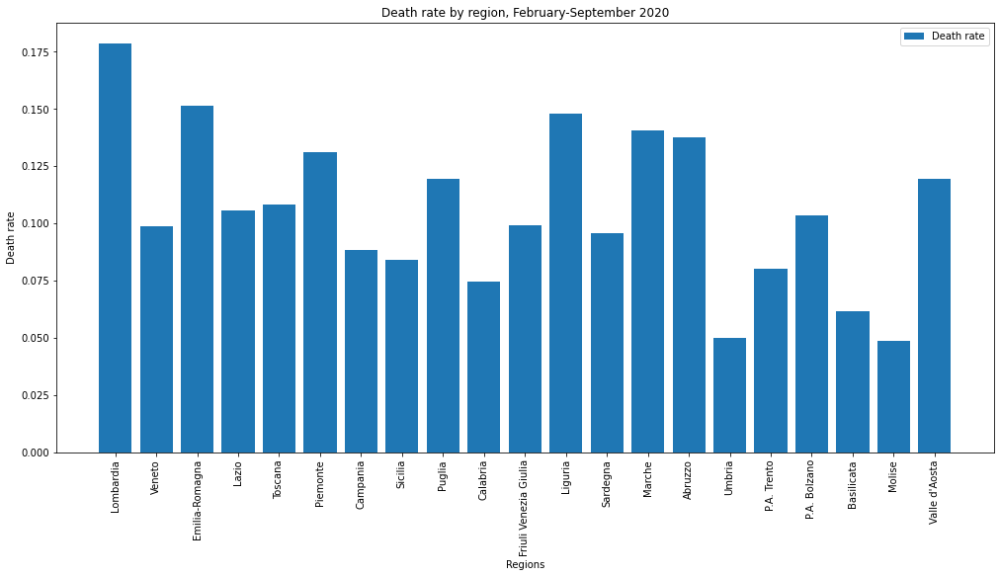

In [31]:
plt.figure(figsize=(17,8))
plt.bar(df_new['RegionName'].values, (df_new['Deaths'].values)/((df_new['TotalPositiveCases'].values) - (df_new['CurrentPositiveCases'].values)), label="Death rate")
#plt.plot(range(55), accs_test, '-+', label="Test accuracy")
plt.legend()
plt.title("Death rate by region, February-September 2020")
plt.ylabel("Death rate")
plt.xlabel("Regions")
plt.xticks(rotation=90)
plt.show();

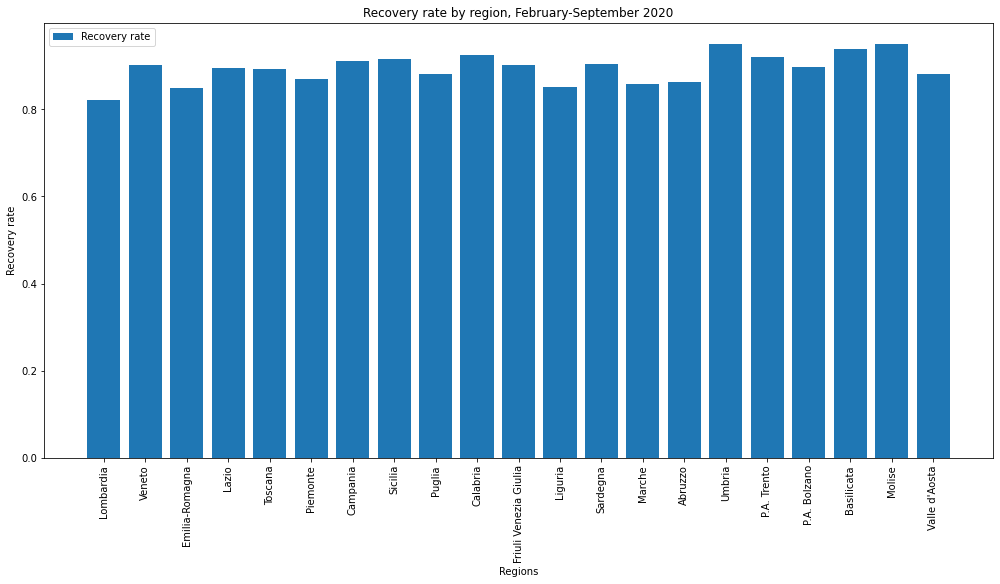

In [32]:
plt.figure(figsize=(17,8))
plt.bar(df_new['RegionName'].values, (df_new['Recovered'].values)/((df_new['TotalPositiveCases'].values) - (df_new['CurrentPositiveCases'].values)), label="Recovery rate")
#plt.plot(range(55), accs_test, '-+', label="Test accuracy")
plt.legend()
plt.title("Recovery rate by region, February-September 2020")
plt.ylabel("Recovery rate")
plt.xlabel("Regions")
plt.xticks(rotation=90)
plt.show();

In [33]:
dff = df_province.iloc[-149:].reset_index().sort_values(by='TotalPositiveCases', ascending=False).head(20)

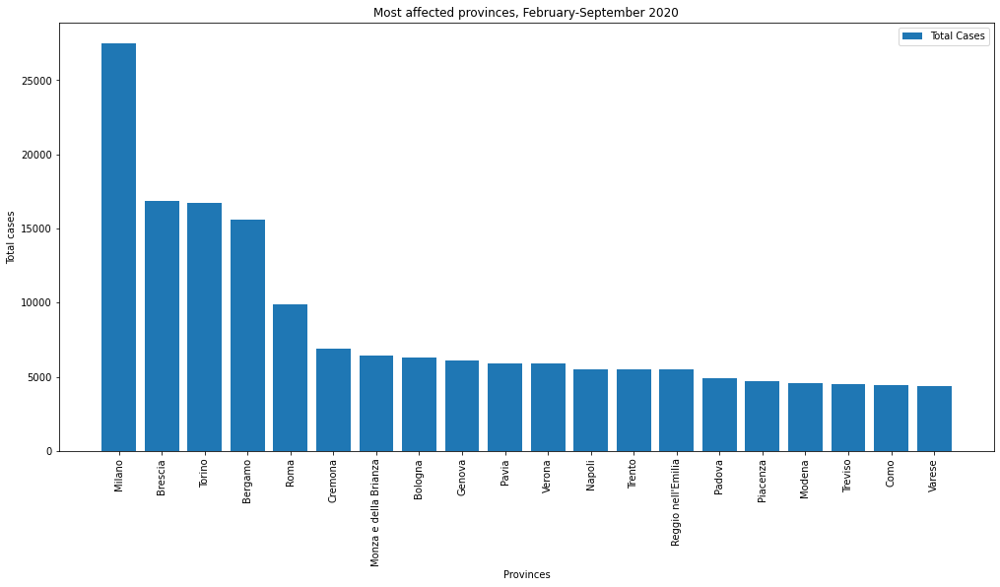

In [34]:
plt.figure(figsize=(17,8))
plt.bar(dff['ProvinceName'].values, dff['TotalPositiveCases'].values, label="Total Cases")
#plt.plot(range(55), accs_test, '-+', label="Test accuracy")
plt.legend()
plt.title("Most affected provinces, February-September 2020")
plt.ylabel("Total cases")
plt.xlabel("Provinces")
plt.xticks(rotation=90)
plt.show();

<a id="Italypoly"></a>

## Polynomial Regression Model
[▲ Return to contents](#Contents)

In [35]:
#create a new df that has the national daily new cases for each day
df_new = df_region.groupby(by='Date').sum().reset_index()

In [36]:
#add a column that counts the number of days since the start of lockdown measures
df_new['Days'] = df_new.index

In [37]:
df_new.head()

,Date,SNo,RegionCode,Latitude,Longitude,HospitalizedPatients,IntensiveCarePatients,TotalHospitalizedPatients,HomeConfinement,CurrentPositiveCases,NewPositiveCases,Recovered,Deaths,TotalPositiveCases,TestsPerformed,Days
0,2020-02-24T18:00:00,210,249,903.972147,256.745065,101,26,127,94,221,221,1,7,229,0.0,0
1,2020-02-25T18:00:00,651,249,903.972147,256.745065,114,35,149,162,311,93,1,10,322,0.0,1
2,2020-02-26T18:00:00,1092,249,903.972147,256.745065,128,36,164,221,385,78,3,12,400,0.0,2
3,2020-02-27T18:00:00,1533,249,903.972147,256.745065,248,56,304,284,588,250,45,17,650,0.0,3
4,2020-02-28T18:00:00,1974,249,903.972147,256.745065,345,64,409,412,821,238,46,21,888,0.0,4


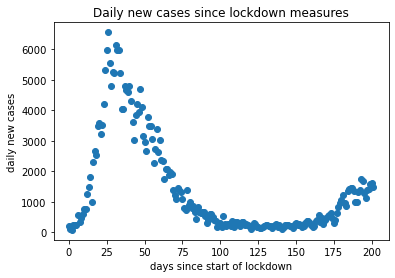

In [38]:
#scatter plot of new cases since start of lockdown measures
x = df_new['Days']
y = df_new['NewPositiveCases']

plt.scatter(x, y)

plt.xlabel("days since start of lockdown")
plt.ylabel("daily new cases")
plt.title("Daily new cases since lockdown measures")
plt.show()

In [39]:
#define predictor and response variable
X = df_new[['Days']].values
Y = df_new['NewPositiveCases'].values

In [40]:
#split the train data into train and validation sets 
x_train, x_val, y_train, y_val = train_test_split(X,Y, train_size=0.8, random_state=44)

In [41]:
#find the best degree for the polynomial regression
maxdeg = 30
training_error, validation_error = [],[]

for d in range(maxdeg):
    
    x_poly_train = PolynomialFeatures(d).fit_transform(x_train)
    x_poly_val = PolynomialFeatures(d).fit_transform(x_val)
    
    polymodel = LinearRegression()
    polymodel.fit(x_poly_train, y_train)
    
    y_train_pred = polymodel.predict(x_poly_train)
    y_val_pred = polymodel.predict(x_poly_val)
    
    training_error.append(mean_squared_error(y_train, y_train_pred))
    validation_error.append(mean_squared_error(y_val, y_val_pred))

In [42]:
#find best degree based on lowest mse
min_mse_train = min(training_error)

best_degree_train = training_error.index(min_mse_train)

min_mse_val = min(validation_error)

best_degree_val = validation_error.index(min_mse_val)

print("The lowest train MSE is",min_mse_train)

print("The lowest validation MSE is",min_mse_val)

print("The degree of the model that gives the lowest train MSE is",best_degree_train)

print("The degree of the model that gives the lowest validation MSE is",best_degree_val)

The lowest train MSE is 213269.20526667943
The lowest validation MSE is 169787.9590808517
The degree of the model that gives the lowest train MSE is 7
The degree of the model that gives the lowest validation MSE is 7


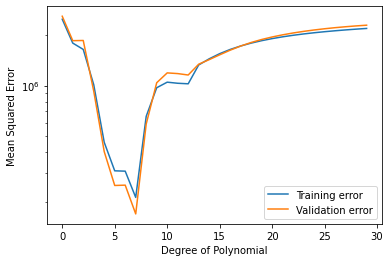

In [43]:
#plot training and validation mse
fig, ax = plt.subplots()

ax.plot(range(maxdeg), training_error, label = 'Training error')

ax.plot(range(maxdeg), validation_error, label = 'Validation error')

ax.set_xlabel('Degree of Polynomial')
ax.set_ylabel('Mean Squared Error')
ax.legend(loc = 'best')
ax.set_yscale('log')
plt.show()

In [44]:
#fit polynomial regression with degree 7
x_train_poly3 = PolynomialFeatures(degree=best_degree_val).fit_transform(X)

polymodel = LinearRegression()
polymodel.fit(x_train_poly3,Y)

y_train_pred3 = polymodel.predict(x_train_poly3)

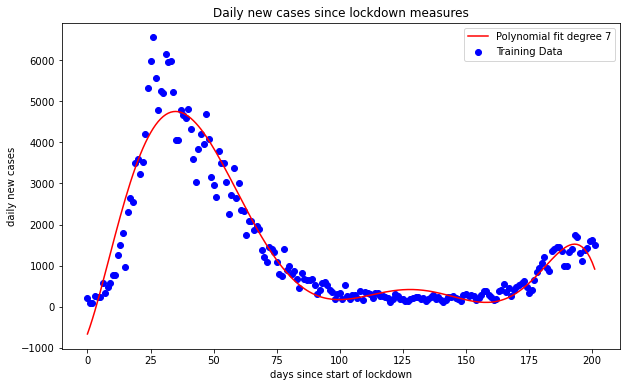

In [45]:
#plot polynomial regression on scatterplot
plt.figure(figsize=(10,6))

idx = np.argsort(X[:,0])
X = X[idx]
y_train_pred3 = y_train_pred3[idx]

plt.scatter(X, Y, c='b', label="Training Data")

# Also plot the polynomial regression fit curve
plt.plot(X, y_train_pred3, c='r', label="Polynomial fit degree 7")

#Assigning labels to the axes
plt.xlabel("days since start of lockdown")
plt.ylabel("daily new cases")
plt.title("Daily new cases since lockdown measures")
plt.legend()
plt.savefig('italy_model.jpg', dpi=400)

In [46]:
#find the best degree of the polynomial regression by running the model on a range of degree values and using k-fold cross validation. 
maxdeg = 30

cross_training_error, cross_validation_error = [],[]

for d in range(maxdeg):
    
    x_poly_train = PolynomialFeatures(d).fit_transform(X)
    
    polymodel = LinearRegression()
    
    mse_score = cross_validate(polymodel, x_poly_train, Y, cv=10, scoring="neg_mean_squared_error",return_train_score=True)
    
    polymodel.fit(x_poly_train, Y)
    
    y_train_pred = polymodel.predict(x_poly_train)
    
    cross_training_error.append(mean_squared_error(Y, y_train_pred))
    
    cross_validation_error.append(np.mean(-mse_score['test_score']))

In [47]:
min_mse_crosstrain = min(cross_training_error)

best_degree_crosstrain = cross_training_error.index(min_mse_crosstrain)

min_mse_crossval = min(cross_validation_error)

best_degree_crossval = cross_validation_error.index(min_mse_crossval)

print("The lowest train MSE is",min_mse_crosstrain)

print("The lowest cross validation MSE is",min_mse_crossval)

print("The degree of the model that gives the lowest train MSE is",best_degree_crosstrain)

print("The degree of the model that gives the lowest cross validation MSE is",best_degree_crossval)

The lowest train MSE is 205107.73945033067
The lowest cross validation MSE is 1078631.431012916
The degree of the model that gives the lowest train MSE is 7
The degree of the model that gives the lowest cross validation MSE is 5


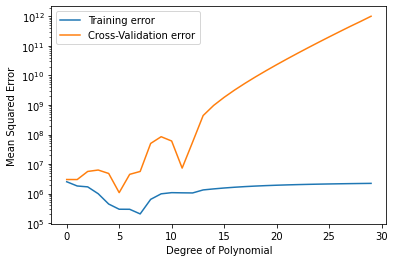

In [48]:
fig, ax = plt.subplots()

ax.plot(range(maxdeg), cross_training_error, label = 'Training error')

ax.plot(range(maxdeg), cross_validation_error, label = 'Cross-Validation error')

ax.set_xlabel('Degree of Polynomial')
ax.set_ylabel('Mean Squared Error')
ax.legend(loc = 'best')
ax.set_yscale('log')
plt.show()

In [49]:
x_train_poly4 = PolynomialFeatures(degree=best_degree_crossval).fit_transform(X)

polymodel4 = LinearRegression()
polymodel4.fit(x_train_poly4,Y)

y_train_pred4 = polymodel4.predict(x_train_poly4)

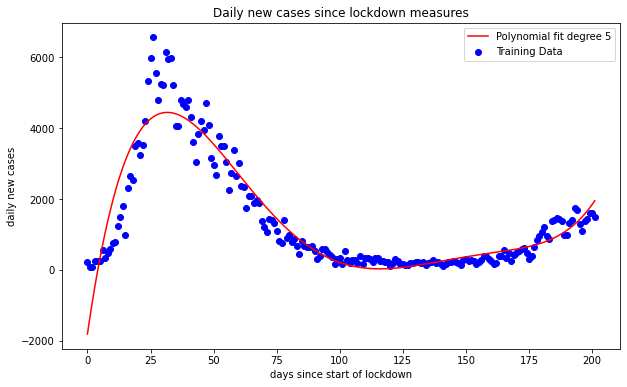

In [50]:
plt.figure(figsize=(10,6))

idx = np.argsort(X[:,0])
X = X[idx]
y_train_pred4 = y_train_pred4[idx]

plt.scatter(X, Y, c='b', label="Training Data")

# Also plot the polynomial regression fit curve
plt.plot(X, y_train_pred4, c='r', label="Polynomial fit degree 5")

#Assigning labels to the axes
plt.xlabel("days since start of lockdown")
plt.ylabel("daily new cases")
plt.title("Daily new cases since lockdown measures")
plt.legend()
plt.show()

In [51]:
#find best degree using k-fold cross validation along with bootstraps
maxdeg5 = 50
numboot = 100

bestdeg = []

for i in range(numboot):
    df_sampled = df_new.sample(frac=1, replace=True)
    
    x_samp = df_sampled[['Days']].values
    y_samp = df_sampled['NewPositiveCases'].values
    
    cross_training_error, cross_validation_error = [],[]
    
    for d in range(maxdeg):
        
        x_poly_train = PolynomialFeatures(d).fit_transform(x_samp)
        
        polymodel = LinearRegression()
        
        mse_score = cross_validate(polymodel, x_poly_train, y_samp, cv=10, scoring="neg_mean_squared_error",return_train_score=True)
        
        polymodel.fit(x_poly_train, y_samp)
        
        y_train_pred = polymodel.predict(x_poly_train)
        
        cross_training_error.append(mean_squared_error(y_samp, y_train_pred))
        
        cross_validation_error.append(np.mean(-mse_score['test_score']))
        
    min_mse_crossval = min(cross_validation_error)

    best_degree_crossval = cross_validation_error.index(min_mse_crossval)
    
    bestdeg.append(best_degree_crossval)

In [52]:
best_dict = {i:bestdeg.count(i) for i in bestdeg}
max_deg = max(best_dict.values())
best_deg = [i for i in best_dict.keys() if best_dict[i] == max_deg][0]

print("The degree voted the most times is: " + str(best_deg))

The degree voted the most times is: 7


<a id="Italytime"></a>

## Time Series Model 
[▲ Return to contents](#Contents)

In [53]:
import warnings
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
import itertools
from statsmodels.tsa.api import SimpleExpSmoothing 
from statsmodels.tsa.api import Holt
from statsmodels.tsa.api import ExponentialSmoothing

In [54]:
df = pd.DataFrame(national_dailynewcases, columns =['Cases']) 

In [55]:
df['Date'] = new_df['Date']

In [56]:
df['Datetime'] = pd.to_datetime(df['Date'])

In [57]:
df = df.drop(['Date'], axis=1)

In [58]:
df = df.set_index('Datetime')

In [59]:
df2 = pd.DataFrame(daily_deaths_italy, columns =['Deaths']) 

In [60]:
df2['Date'] = new_df['Date']

In [61]:
df2['Datetime'] = pd.to_datetime(df2['Date'])

In [62]:
df2 = df2.drop(['Date'], axis=1)

In [63]:
df2 = df2.set_index('Datetime')

In [64]:
RMSE = {}

<a id="Italycases"></a>

## Modeling for daily cases
[▲ Return to contents](#Contents)

### Visualize the Data

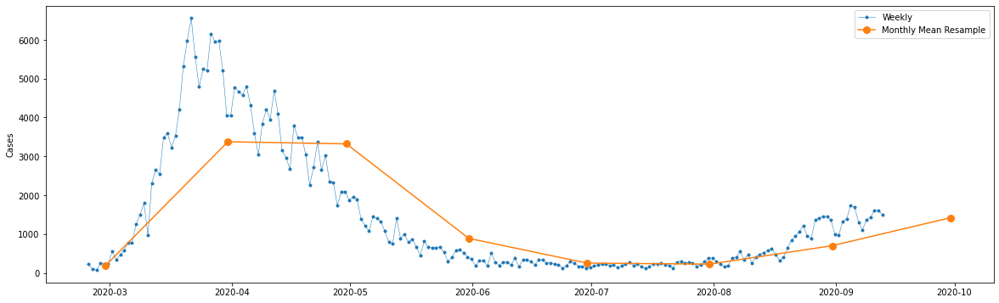

In [65]:

y = df['Cases']
fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(y,marker='.', linestyle='-', linewidth=0.5, label='Weekly')
ax.plot(y.resample('M').mean(),marker='o', markersize=8, linestyle='-', label='Monthly Mean Resample')
ax.set_ylabel('Cases')
ax.legend();

### Decompose the Data

In [66]:
def seasonal_decompose (y):
    decomposition = sm.tsa.seasonal_decompose(y, period = 60, model='additive',extrapolate_trend='freq')
    fig = decomposition.plot()
    fig.set_size_inches(14,7)
    plt.show()

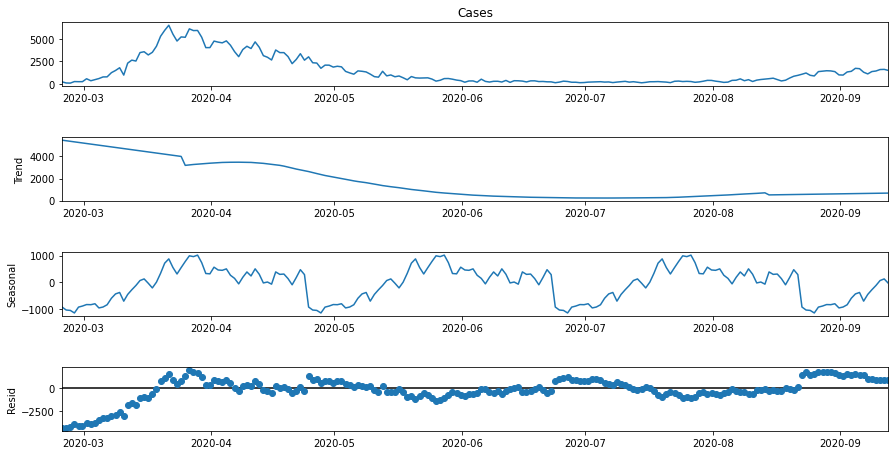

In [67]:
seasonal_decompose(y)

### Check for Stationarity: Augmented Dickey-Fuller Test

In [68]:
def test_stationarity(timeseries, title):
    
    #Determing rolling statistics
    rolmean = pd.Series(timeseries).rolling(window=12).mean() 
    rolstd = pd.Series(timeseries).rolling(window=12).std()
    
    fig, ax = plt.subplots(figsize=(16, 4))
    ax.plot(timeseries, label= title)
    ax.plot(rolmean, label='rolling mean');
    ax.plot(rolstd, label='rolling std (x10)');
    ax.legend()

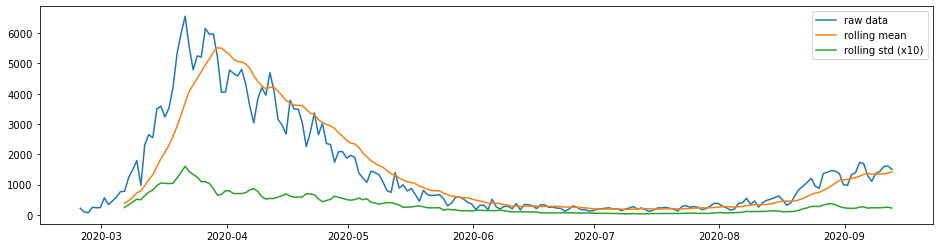

In [69]:
pd.options.display.float_format = '{:.8f}'.format
test_stationarity(df['Cases'],'raw data')

In [70]:
def ADF_test(timeseries, dataDesc):
    print(' > Is the {} stationary ?'.format(dataDesc))
    dftest = adfuller(timeseries.dropna(), autolag='AIC')
    print('Test statistic = {:.3f}'.format(dftest[0]))
    print('P-value = {:.3f}'.format(dftest[1]))
    print('Critical values :')
    for k, v in dftest[4].items():
        print('\t{}: {} - The data is {} stationary with {}% confidence'.format(k, v, 'not' if v<dftest[0] else '', 100-int(k[:-1])))

In [71]:
ADF_test(y,'raw data')

 > Is the raw data stationary ?
Test statistic = -2.134
P-value = 0.231
Critical values :
	1%: -3.4654311561944873 - The data is not stationary with 99% confidence
	5%: -2.8769570530458792 - The data is not stationary with 95% confidence
	10%: -2.574988319755886 - The data is not stationary with 90% confidence


### Make the Data Stationary: detrending and differencing

 > Is the de-trended data stationary ?
Test statistic = -2.511
P-value = 0.113
Critical values :
	1%: -3.4668001583460613 - The data is not stationary with 99% confidence
	5%: -2.8775552336674317 - The data is not stationary with 95% confidence
	10%: -2.5753075498128246 - The data is not stationary with 90% confidence


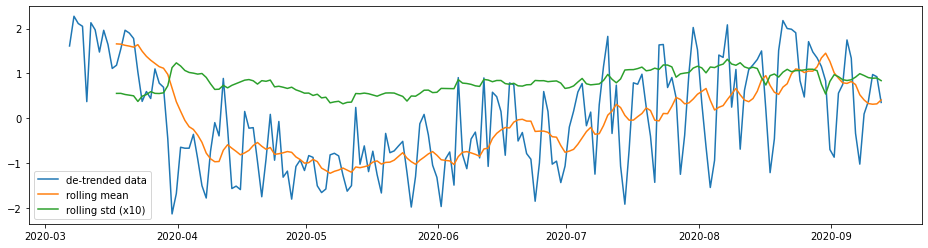

In [72]:
y_detrend =  (y - y.rolling(window=12).mean())/y.rolling(window=12).std()

test_stationarity(y_detrend,'de-trended data')
ADF_test(y_detrend,'de-trended data')

 > Is the 12 lag differenced data stationary ?
Test statistic = -4.658
P-value = 0.000
Critical values :
	1%: -3.4680615871598537 - The data is  stationary with 99% confidence
	5%: -2.8781061899535128 - The data is  stationary with 95% confidence
	10%: -2.5756015922004134 - The data is  stationary with 90% confidence


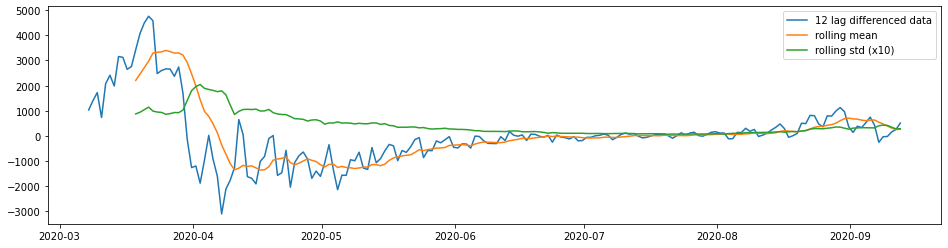

In [73]:
y_12lag =  y - y.shift(12)

test_stationarity(y_12lag,'12 lag differenced data')
ADF_test(y_12lag,'12 lag differenced data')

 > Is the 3 lag differenced de-trended data stationary ?
Test statistic = -3.980
P-value = 0.002
Critical values :
	1%: -3.4682803641749267 - The data is  stationary with 99% confidence
	5%: -2.8782017240816327 - The data is  stationary with 95% confidence
	10%: -2.5756525795918366 - The data is  stationary with 90% confidence


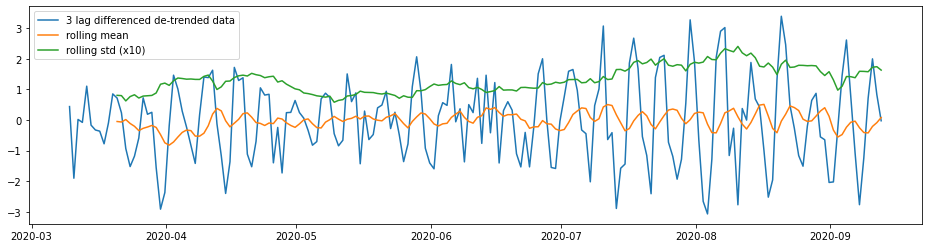

In [74]:
y_3lag_detrend =  y_detrend - y_detrend.shift(3)

test_stationarity(y_3lag_detrend,'3 lag differenced de-trended data')
ADF_test(y_3lag_detrend,'3 lag differenced de-trended data')

### Create Training & Testing Datasets

In [75]:
df.index = pd.DatetimeIndex(df.index).to_period('D')

In [76]:
y=df['Cases']

In [77]:
y_to_train = y[:150] # dataset to train
y_to_val = y[150:] # last X months for test  
predict_date = len(y) - len(y[:150])

<a id="Italysarima"></a>

### SARIMA
[▲ Return to contents](#Contents)

In [78]:
def sarima_grid_search(y,seasonal_period):
    p = d = q = range(0, 2)
    pdq = list(itertools.product(p, d, q))
    seasonal_pdq = [(x[0], x[1], x[2],seasonal_period) for x in list(itertools.product(p, d, q))]
    
    mini = float('+inf')
    
    
    for param in pdq:
        for param_seasonal in seasonal_pdq:
            try:
                mod = sm.tsa.statespace.SARIMAX(y,
                                                order=param,
                                                seasonal_order=param_seasonal,
                                                enforce_stationarity=False,
                                                enforce_invertibility=False)

                results = mod.fit()
                
                if results.aic < mini:
                    mini = results.aic
                    param_mini = param
                    param_seasonal_mini = param_seasonal

#                 print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results.aic))
            except:
                continue
    print('The set of parameters with the minimum AIC is: SARIMA{}x{} - AIC:{}'.format(param_mini, param_seasonal_mini, mini))

In [79]:
sarima_grid_search(y,30)

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


The set of parameters with the minimum AIC is: SARIMA(1, 1, 1)x(0, 1, 1, 30) - AIC:1952.6209796019175


In [80]:
# Call this function after pick the right(p,d,q) for SARIMA based on AIC               
def sarima_eva2(y,order,seasonal_order,seasonal_period,pred_date,y_to_test, RMSE):
    # fit the model 
    mod = sm.tsa.statespace.SARIMAX(y,
                                order=order,
                                seasonal_order=seasonal_order,
                                enforce_stationarity=False,
                                enforce_invertibility=False)

    results = mod.fit()
    print(results.summary().tables[1])
    
    results.plot_diagnostics(figsize=(16, 8))
    plt.show()
    
    # The dynamic=False argument ensures that we produce one-step ahead forecasts, 
    # meaning that forecasts at each point are generated using the full history up to that point.
    pred = results.get_prediction(start=pd.to_datetime(pred_date), dynamic=False)
    pred_ci = pred.conf_int()
    y_forecasted = pred.predicted_mean
    mse = ((y_forecasted - y_to_test) ** 2).mean()
    rmse = round(np.sqrt(mse), 2)
    RMSE['sarima'] = rmse
    print('The Root Mean Squared Error of SARIMA with season_length={} and dynamic = False {}'.format(seasonal_period,round(np.sqrt(mse), 2)))

    ax = y.plot(label='observed')
    y_forecasted.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))
    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Sessions')
    plt.legend()
    plt.show()

    # A better representation of our true predictive power can be obtained using dynamic forecasts. 
    # In this case, we only use information from the time series up to a certain point, 
    # and after that, forecasts are generated using values from previous forecasted time points.
    pred_dynamic = results.get_prediction(start=pd.to_datetime(pred_date), dynamic=True, full_results=True)
    pred_dynamic_ci = pred_dynamic.conf_int()
    y_forecasted_dynamic = pred_dynamic.predicted_mean
    mse_dynamic = ((y_forecasted_dynamic - y_to_test) ** 2).mean()
    rmse_dynamic = round(np.sqrt(mse_dynamic), 2)
    RMSE['sarima_dynamic'] = rmse_dynamic
    print('The Root Mean Squared Error of SARIMA with season_length={} and dynamic = True {}'.format(seasonal_period,round(np.sqrt(mse_dynamic), 2)))

    ax = y.plot(label='observed')
    y_forecasted_dynamic.plot(label='Dynamic Forecast', ax=ax,figsize=(14, 7))
    ax.fill_between(pred_dynamic_ci.index,
                    pred_dynamic_ci.iloc[:, 0],
                    pred_dynamic_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Sessions')

    plt.legend()
    plt.show()
    
    return (results)

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5201      0.248      2.100      0.036       0.035       1.005
ma.L1         -0.6819      0.226     -3.014      0.003      -1.125      -0.238
ma.S.L30      -0.5461      0.079     -6.931      0.000      -0.701      -0.392
sigma2      6.876e+04   6571.033     10.464      0.000    5.59e+04    8.16e+04


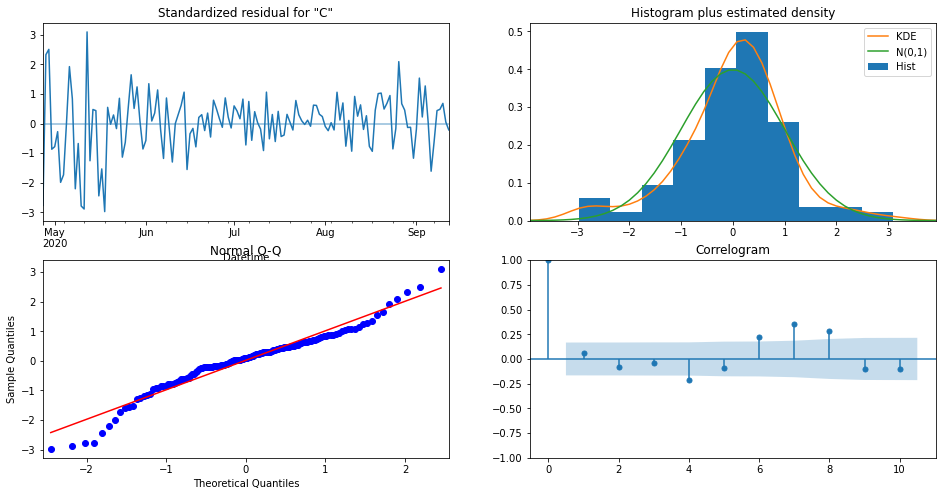

The Root Mean Squared Error of SARIMA with season_length=30 and dynamic = False 186.42


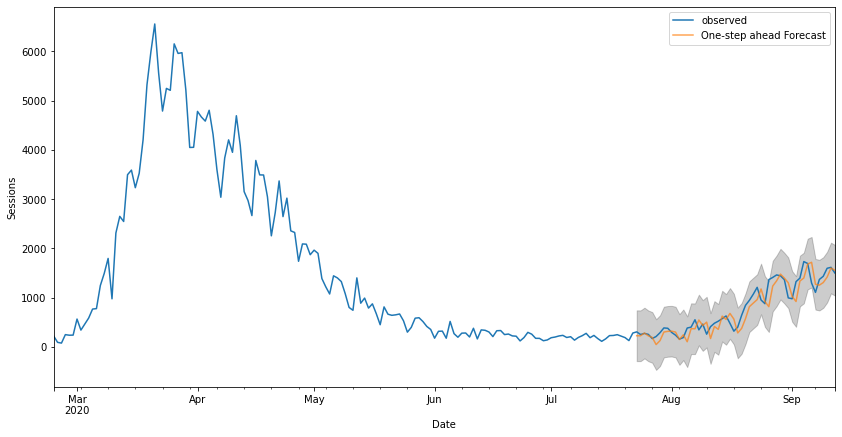

The Root Mean Squared Error of SARIMA with season_length=30 and dynamic = True 1172.54


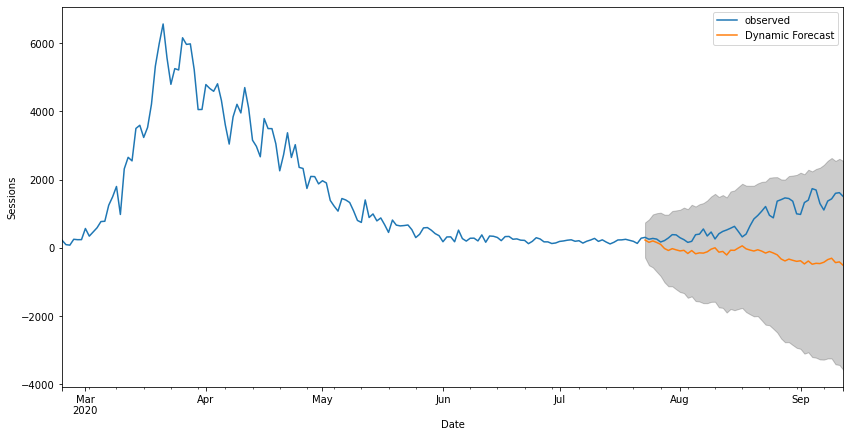

In [81]:
model = sarima_eva2(y,(1, 1, 1),(0, 1, 1, 30),30,'2020-07-23 17:00:00',y_to_val, RMSE)

In [82]:
def forecast(model,predict_steps,y):
    
    pred_uc = model.get_forecast(steps=predict_steps)

    #SARIMAXResults.conf_int, can change alpha,the default alpha = .05 returns a 95% confidence interval.
    pred_ci = pred_uc.conf_int()

    ax = y.plot(label='observed', figsize=(14, 7))
#     print(pred_uc.predicted_mean)
    pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.25)
    ax.set_xlabel('Date')
    ax.set_title('Naive Analysis: Forecast of Daily New COVID-19 cases in Italy until March 2021')
    ax.set_ylabel(y.name)
    plt.ylim(bottom=-1)
    plt.legend()
    plt.show()
    
    # Produce the forcasted tables 
    pm = pred_uc.predicted_mean.reset_index()
    pm.columns = ['Date','Predicted_Mean']
    pci = pred_ci.reset_index()
    pci.columns = ['Date','Lower Bound','Upper Bound']
    final_table = pm.join(pci.set_index('Date'), on='Date')
    
    return (final_table)

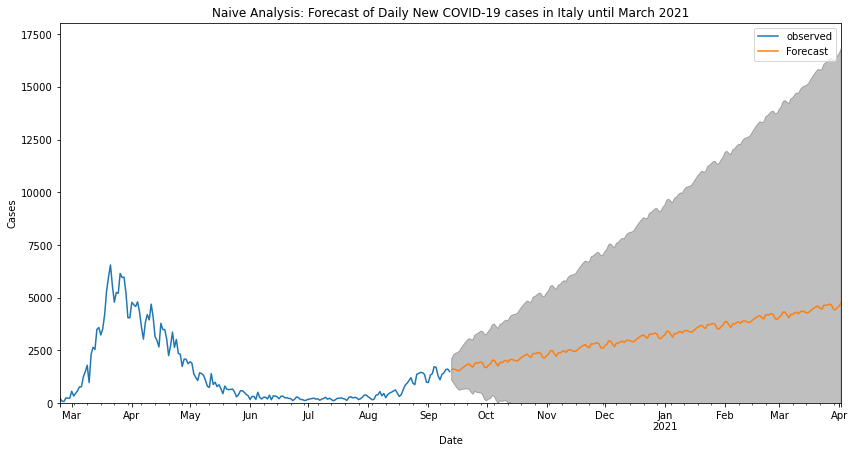

,Date,Predicted_Mean,Lower Bound,Upper Bound
0,2020-09-13,1598.27179556,1084.21810545,2112.32548568
1,2020-09-14,1620.00951229,949.27256827,2290.74645632
2,2020-09-15,1588.62943924,813.96091113,2363.29796734
3,2020-09-16,1550.35705467,693.97102551,2406.74308382
4,2020-09-17,1539.99850026,613.56754500,2466.42945552


In [83]:
final_table = forecast(model,202,y)
final_table.head()

In [84]:
y_to_val2=y['2020-03-10':'2020-03-15']

In [85]:
y_to_val2

Datetime
2020-03-10     977
2020-03-11    2313
2020-03-12    2651
2020-03-13    2547
2020-03-14    3497
2020-03-15    3590
Freq: D, Name: Cases, dtype: int64

In [86]:
sarima_grid_search(y[:'2020-03-15'],2)

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


The set of parameters with the minimum AIC is: SARIMA(0, 1, 1)x(0, 1, 1, 2) - AIC:218.19501366367325


In [87]:
# Call this function after pick the right(p,d,q) for SARIMA based on AIC               
def sarima_eva(y,order,seasonal_order,seasonal_period,pred_date,y_to_test):
    # fit the model 
    mod = sm.tsa.statespace.SARIMAX(y,
                                order=order,
                                seasonal_order=seasonal_order,
                                enforce_stationarity=False,
                                enforce_invertibility=False)

    results = mod.fit()
    print(results.summary().tables[1])
    
    results.plot_diagnostics(figsize=(16, 8))
    plt.show()
    
    # The dynamic=False argument ensures that we produce one-step ahead forecasts, 
    # meaning that forecasts at each point are generated using the full history up to that point.
    pred = results.get_prediction(start=pd.to_datetime(pred_date), dynamic=False)
    pred_ci = pred.conf_int()
    y_forecasted = pred.predicted_mean
    mse = ((y_forecasted - y_to_test) ** 2).mean()
    print('The Root Mean Squared Error of SARIMA with season_length={} and dynamic = False {}'.format(seasonal_period,round(np.sqrt(mse), 2)))

    ax = y.plot(label='observed')
    y_forecasted.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))
    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Sessions')
    plt.legend()
    plt.show()

    # A better representation of our true predictive power can be obtained using dynamic forecasts. 
    # In this case, we only use information from the time series up to a certain point, 
    # and after that, forecasts are generated using values from previous forecasted time points.
    pred_dynamic = results.get_prediction(start=pd.to_datetime(pred_date), dynamic=True, full_results=True)
    pred_dynamic_ci = pred_dynamic.conf_int()
    y_forecasted_dynamic = pred_dynamic.predicted_mean
    mse_dynamic = ((y_forecasted_dynamic - y_to_test) ** 2).mean()
    print('The Root Mean Squared Error of SARIMA with season_length={} and dynamic = True {}'.format(seasonal_period,round(np.sqrt(mse_dynamic), 2)))

    ax = y.plot(label='observed')
    y_forecasted_dynamic.plot(label='Dynamic Forecast', ax=ax,figsize=(14, 7))
    ax.fill_between(pred_dynamic_ci.index,
                    pred_dynamic_ci.iloc[:, 0],
                    pred_dynamic_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Sessions')

    plt.legend()
    plt.show()
    
    return (results)

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5276      0.278     -1.897      0.058      -1.073       0.018
ma.S.L2       -0.6133      0.261     -2.350      0.019      -1.125      -0.102
sigma2      2.188e+05   9.43e+04      2.321      0.020     3.4e+04    4.04e+05


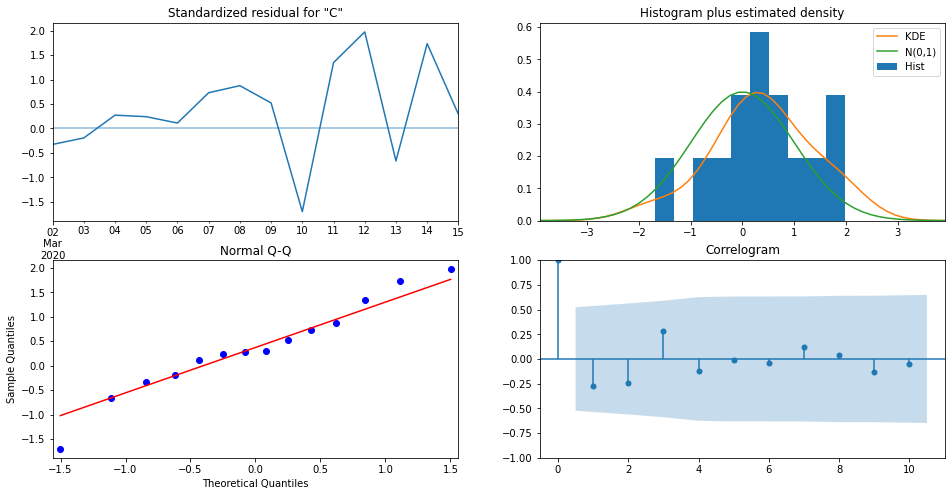

The Root Mean Squared Error of SARIMA with season_length=2 and dynamic = False 665.34


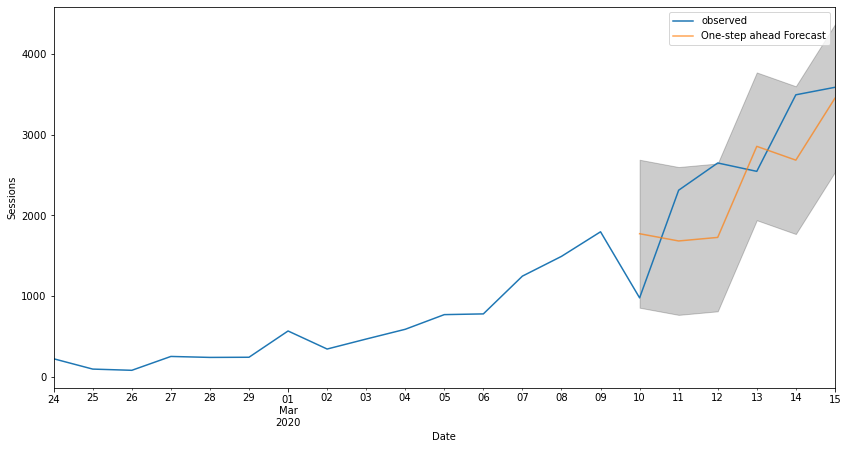

The Root Mean Squared Error of SARIMA with season_length=2 and dynamic = True 683.47


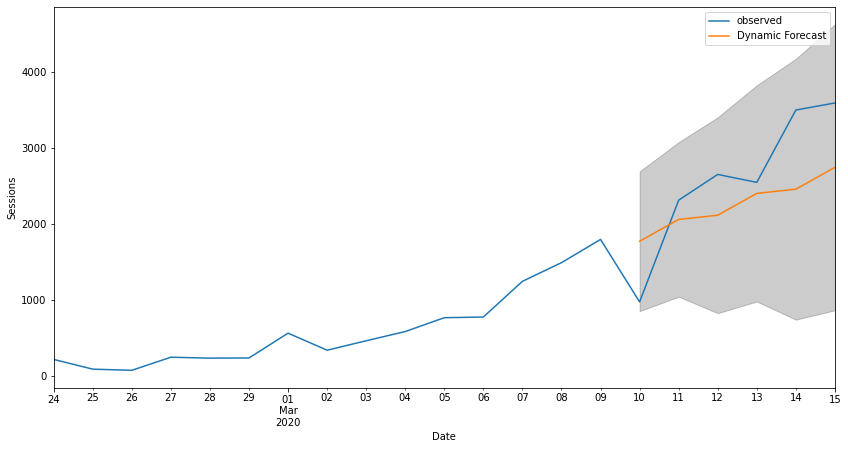

In [88]:
model = sarima_eva(y[:'2020-03-15'],(0, 1, 1),(0, 1, 1, 2),2,'2020-03-10',y_to_val2)

In [89]:
def forecast2(model,predict_steps,y, y_tot):
    
    pred_uc = model.get_forecast(steps=predict_steps)

    #SARIMAXResults.conf_int, can change alpha,the default alpha = .05 returns a 95% confidence interval.
    pred_ci = pred_uc.conf_int()

    ax = y_tot.plot(label='observed', figsize=(14, 7))
#     print(pred_uc.predicted_mean)
    pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.25)
    ax.set_xlabel('Date')
    ax.set_title("Advanced Analysis: Forecasted vs Actual daily new COVID-19 cases in Italy since national lockdown")
    ax.set_ylabel(y.name)
    plt.ylim(bottom=-1, top=60000)
    plt.legend()
    plt.show()
    
    # Produce the forcasted tables 
    pm = pred_uc.predicted_mean.reset_index()
    pm.columns = ['Date','Predicted_Mean']
    pci = pred_ci.reset_index()
    pci.columns = ['Date','Lower Bound','Upper Bound']
    final_table = pm.join(pci.set_index('Date'), on='Date')
    
    return (final_table)

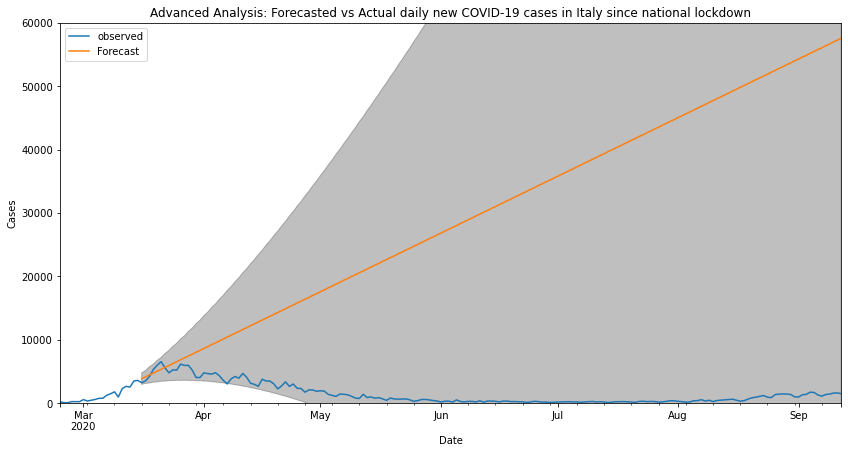

,Date,Predicted_Mean,Lower Bound,Upper Bound
0,2020-03-16,3870.71338890,2953.81189648,4787.61488133
1,2020-03-17,4142.67389595,3128.60172808,5156.74606382
2,2020-03-18,4467.34422298,3183.19778775,5751.49065822
3,2020-03-19,4739.30473003,3321.61558177,6156.99387829
4,2020-03-20,5063.97505706,3354.41869679,6773.53141733


In [90]:
final_table2 = forecast2(model,181,y[:'2020-03-15'],y)
final_table2.head()

<a id="Italyses"></a>

### Simple Exponential Smoothing (SES)
[▲ Return to contents](#Contents)

In [91]:
def ses2(y, y_to_train,y_to_test,smoothing_level,predict_date, RMSE):
    y.plot(marker='o', color='black', legend=True, figsize=(14, 7))
    
    fit1 = SimpleExpSmoothing(y_to_train).fit(smoothing_level=smoothing_level,optimized=False)
    fcast1 = fit1.forecast(predict_date).rename(r'$\alpha={}$'.format(smoothing_level))
    # specific smoothing level
    fcast1.plot(marker='o', color='blue', legend=True)
    fit1.fittedvalues.plot(marker='o',  color='blue')
    mse1 = ((fcast1 - y_to_test) ** 2).mean()
    print('The Root Mean Squared Error of our forecasts with smoothing level of {} is {}'.format(smoothing_level,round(np.sqrt(mse1), 2)))
    
    ## auto optimization
    fit2 = SimpleExpSmoothing(y_to_train).fit()
    fcast2 = fit2.forecast(predict_date).rename(r'$\alpha=%s$'%fit2.model.params['smoothing_level'])
    # plot
    fcast2.plot(marker='o', color='green', legend=True)
    fit2.fittedvalues.plot(marker='o', color='green')
    
    mse2 = ((fcast2 - y_to_test) ** 2).mean()
    print('The Root Mean Squared Error of our forecasts with auto optimization is {}'.format(round(np.sqrt(mse2), 2)))
    rmse = round(np.sqrt(mse2), 2)
    RMSE['ses'] = rmse
    
    plt.show()

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\holtwinters\model.py:429: FutureWarning: After 0.13 initialization must be handled at model creation
  FutureWarning,
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\holtwinters\model.py:429: FutureWarning: After 0.13 initialization must be handled at model creation
  FutureWarning,


The Root Mean Squared Error of our forecasts with smoothing level of 0.8 is 737.6
The Root Mean Squared Error of our forecasts with auto optimization is 718.01


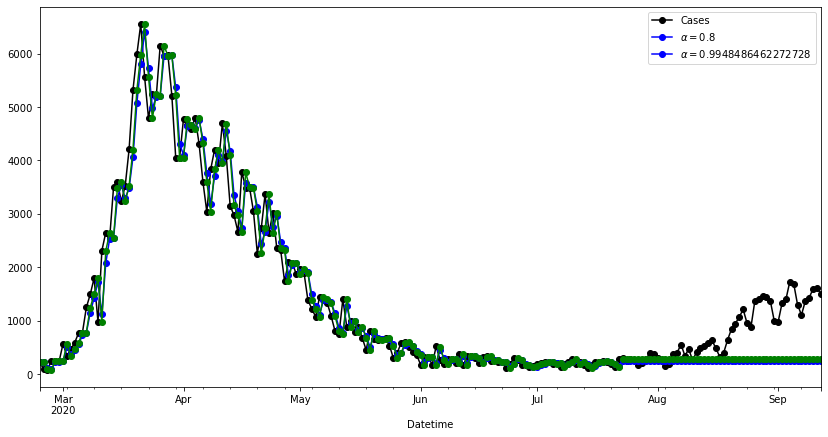

In [92]:
ses2(y, y_to_train,y_to_val,0.8,predict_date, RMSE)

<a id="Italyholt"></a>

### Holt’s Linear Trend Method
[▲ Return to contents](#Contents)

In [93]:
def holt2(y,y_to_train,y_to_test,smoothing_level,smoothing_slope, predict_date, RMSE):
    y.plot(marker='o', color='black', legend=True, figsize=(14, 7))
    
    fit1 = Holt(y_to_train).fit(smoothing_level, smoothing_slope, optimized=False)
    fcast1 = fit1.forecast(predict_date).rename("Holt's linear trend")
    mse1 = ((fcast1 - y_to_test) ** 2).mean()
    print('The Root Mean Squared Error of Holt''s Linear trend {}'.format(round(np.sqrt(mse1), 2)))
    rmse_linear = round(np.sqrt(mse1), 2)
    RMSE['holt_linear'] = rmse_linear

    fit2 = Holt(y_to_train, exponential=True).fit(smoothing_level, smoothing_slope, optimized=False)
    fcast2 = fit2.forecast(predict_date).rename("Exponential trend")
    mse2 = ((fcast2 - y_to_test) ** 2).mean()
    print('The Root Mean Squared Error of Holt''s Exponential trend {}'.format(round(np.sqrt(mse2), 2)))
    rmse_expo = round(np.sqrt(mse2), 2)
    RMSE['holt_expo'] = rmse_expo
    
    fit1.fittedvalues.plot(marker="o", color='blue')
    fcast1.plot(color='blue', marker="o", legend=True)
    fit2.fittedvalues.plot(marker="o", color='red')
    fcast2.plot(color='red', marker="o", legend=True)

    plt.show()

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\holtwinters\model.py:429: FutureWarning: After 0.13 initialization must be handled at model creation
  FutureWarning,


The Root Mean Squared Error of Holts Linear trend 581.75
The Root Mean Squared Error of Holts Exponential trend 823.99


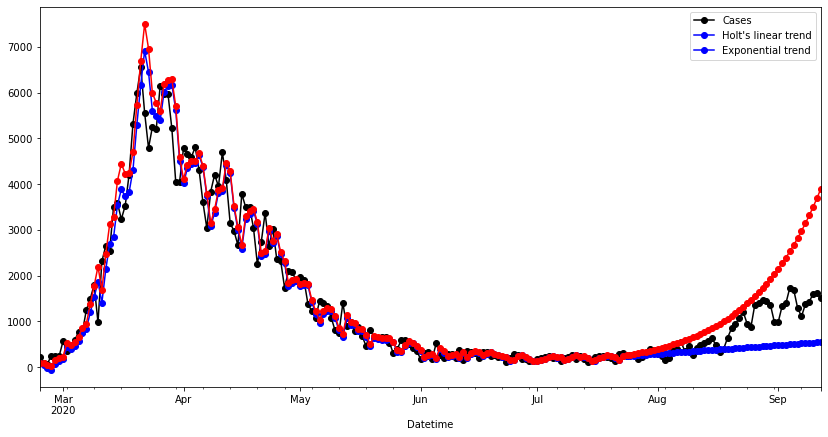

In [94]:
holt2(y, y_to_train,y_to_val,0.6,0.2,predict_date, RMSE)

<a id="Italywinters"></a>

### Holt-Winters’ Seasonal Method
[▲ Return to contents](#Contents)

In [95]:
def holt_win_sea2(y,y_to_train,y_to_test,seasonal_type,seasonal_period,predict_date, RMSE):
    
    y.plot(marker='o', color='black', legend=True, figsize=(14, 7))
    
    if seasonal_type == 'additive':
        fit1 = ExponentialSmoothing(y_to_train, seasonal_periods = seasonal_period, trend='add', seasonal='add').fit()
        fcast1 = fit1.forecast(predict_date).rename('Additive')
        mse1 = ((fcast1 - y_to_test) ** 2).mean()
        print('The Root Mean Squared Error of additive trend, additive seasonal of '+ 
              'period season_length={} and a Box-Cox transformation {}'.format(seasonal_period,round(np.sqrt(mse1), 2)))
        rmse= round(np.sqrt(mse1), 2)
        RMSE['holt-winters'] = rmse
        
        fit2 = ExponentialSmoothing(y_to_train, seasonal_periods = seasonal_period, trend='add', seasonal='add', damped_trend=True).fit()
        fcast2 = fit2.forecast(predict_date).rename('Additive+damped')
        mse2 = ((fcast2 - y_to_test) ** 2).mean()
        print('The Root Mean Squared Error of additive damped trend, additive seasonal of '+ 
              'period season_length={} and a Box-Cox transformation {}'.format(seasonal_period,round(np.sqrt(mse2), 2)))
        
        rmse_damped= round(np.sqrt(mse2), 2)
        RMSE['holt-winters_damped'] = rmse_damped
        fit1.fittedvalues.plot(style='--', color='red')
        fcast1.plot(style='--', marker='o', color='red', legend=True)
        fit2.fittedvalues.plot(style='--', color='green')
        fcast2.plot(style='--', marker='o', color='green', legend=True)
    
    elif seasonal_type == 'multiplicative':  
        fit3 = ExponentialSmoothing(y_to_train, seasonal_periods = seasonal_period, trend='add', seasonal='mul').fit()
        fcast3 = fit3.forecast(predict_date).rename('Multiplicative')
        mse3 = ((fcast3 - y_to_test) ** 2).mean()
        print('The Root Mean Squared Error of additive trend, multiplicative seasonal of '+ 
              'period season_length={} and a Box-Cox transformation {}'.format(seasonal_period,round(np.sqrt(mse3), 2)))
        
        fit4 = ExponentialSmoothing(y_to_train, seasonal_periods = seasonal_period, trend='add', seasonal='mul', damped_trend=True).fit()
        fcast4 = fit4.forecast(predict_date).rename('Multiplicative+damped')
        mse4 = ((fcast3 - y_to_test) ** 2).mean()
        print('The Root Mean Squared Error of additive damped trend, multiplicative seasonal of '+ 
              'period season_length={} and a Box-Cox transformation {}'.format(seasonal_period,round(np.sqrt(mse4), 2)))
        
        fit3.fittedvalues.plot(style='--', color='red')
        fcast3.plot(style='--', marker='o', color='red', legend=True)
        fit4.fittedvalues.plot(style='--', color='green')
        fcast4.plot(style='--', marker='o', color='green', legend=True)
        
    else:
        print('Wrong Seasonal Type. Please choose between additive and multiplicative')

    plt.show()

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\holtwinters\model.py:429: FutureWarning: After 0.13 initialization must be handled at model creation
  FutureWarning,


The Root Mean Squared Error of additive trend, additive seasonal of period season_length=14 and a Box-Cox transformation 916.07
The Root Mean Squared Error of additive damped trend, additive seasonal of period season_length=14 and a Box-Cox transformation 360.28


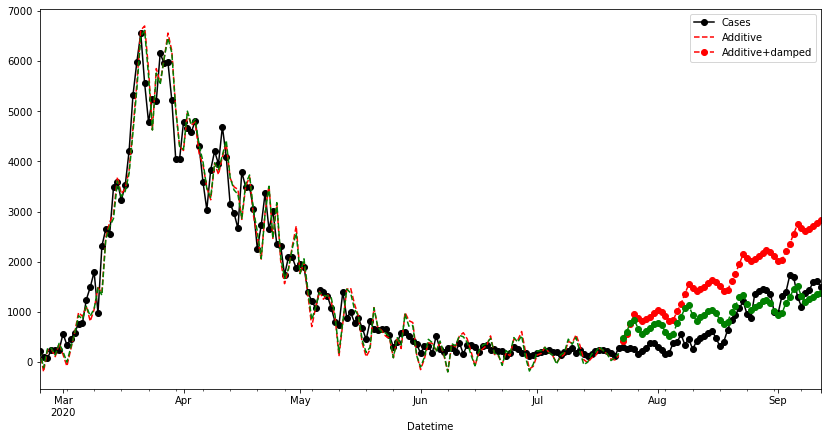

In [96]:
holt_win_sea2(y, y_to_train,y_to_val,'additive',14, predict_date, RMSE)

<a id="Italyarima"></a>

### ARIMA
[▲ Return to contents](#Contents)

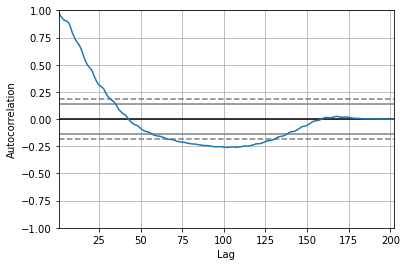

In [97]:
from pandas.plotting import autocorrelation_plot

autocorrelation_plot(y)
plt.show()

                               SARIMAX Results                                
Dep. Variable:                  Cases   No. Observations:                  202
Model:                ARIMA(10, 2, 0)   Log Likelihood               -1408.524
Date:                Mon, 14 Dec 2020   AIC                           2839.047
Time:                        03:21:33   BIC                           2875.329
Sample:                    02-24-2020   HQIC                          2853.730
                         - 09-12-2020                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.1666      0.054    -21.694      0.000      -1.272      -1.061
ar.L2         -1.2291      0.077    -16.004      0.000      -1.380      -1.079
ar.L3         -1.1603      0.090    -12.835      0.0

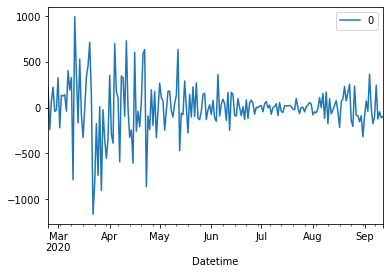

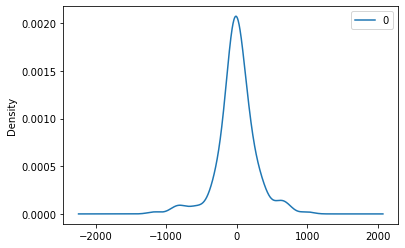

                   0
count   202.00000000
mean     -0.01835165
std     274.78602971
min   -1164.70116229
25%     -95.50480576
50%       0.17658636
75%     109.72111495
max     994.58333563


In [98]:
from statsmodels.tsa.arima.model import ARIMA

# fit model
model = ARIMA(y, order=(10,2,0))
model_fit = model.fit()
print(model_fit.summary())
# plot residual errors
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
plt.show()
residuals.plot(kind='kde')
plt.show()
print(residuals.describe())

Test MSE: 134.416


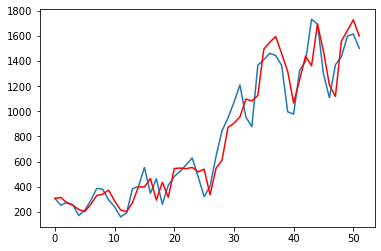

In [99]:
from sklearn.metrics import mean_squared_error

train, test = y_to_train.values, y_to_val.values
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(10,2,0))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)
    #print('predicted=%f, expected=%f' % (yhat, obs))
error = mean_squared_error(test, predictions, squared=False)
rmse = round(error, 2)
RMSE['arima'] = rmse
print('Test MSE: %.3f' % error)
# plot
plt.plot(test)
plt.plot(predictions, color='red')
plt.show()

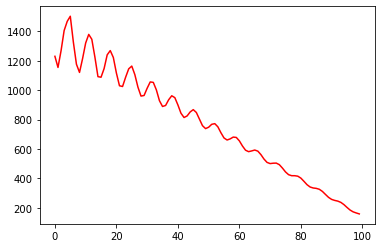

In [100]:

model = ARIMA(y.values, order=(10,2,0))
model_fit = model.fit()
output = model_fit.forecast(steps=100)
    

plt.plot(output, color='red')
plt.show()

<a id="Italychoose"></a>
## Choosing a time series model
[▲ Return to contents](#Contents)

In [101]:
RMSE

{'sarima': 186.42,
 'sarima_dynamic': 1172.54,
 'ses': 718.01,
 'holt_linear': 581.75,
 'holt_expo': 823.99,
 'holt-winters': 916.07,
 'holt-winters_damped': 360.28,
 'arima': 134.42}

In [102]:
import operator
rmse_sort = dict(sorted(RMSE.items(), key=operator.itemgetter(1)))

In [103]:
rmse_sort

{'arima': 134.42,
 'sarima': 186.42,
 'holt-winters_damped': 360.28,
 'holt_linear': 581.75,
 'ses': 718.01,
 'holt_expo': 823.99,
 'holt-winters': 916.07,
 'sarima_dynamic': 1172.54}

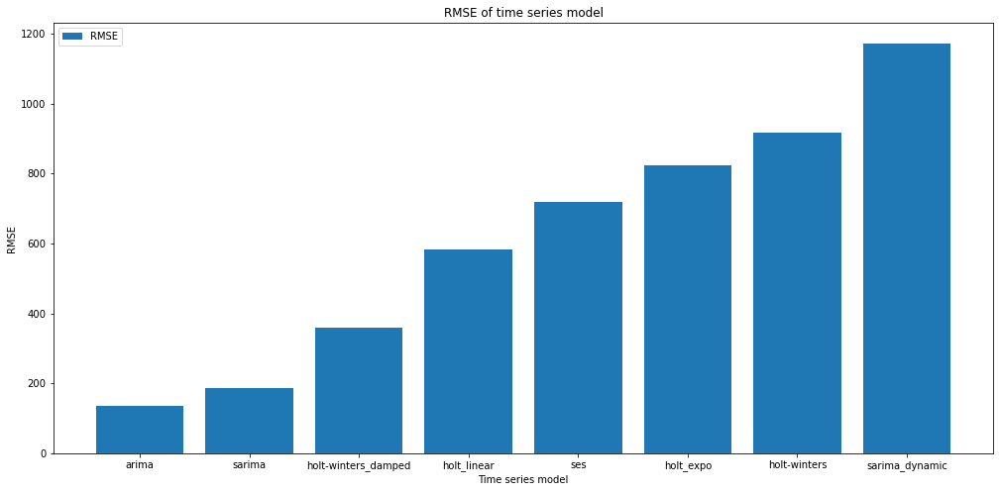

In [104]:
plt.figure(figsize=(17,8))
plt.bar(rmse_sort.keys(), rmse_sort.values(), label="RMSE")
plt.legend()
plt.title("RMSE of time series model")
plt.ylabel("RMSE")
plt.xlabel("Time series model")
plt.xticks()
plt.show();

<a id="Italydeaths"></a>

## Modeling for daily deaths
[▲ Return to contents](#Contents)

### Visualize the Data

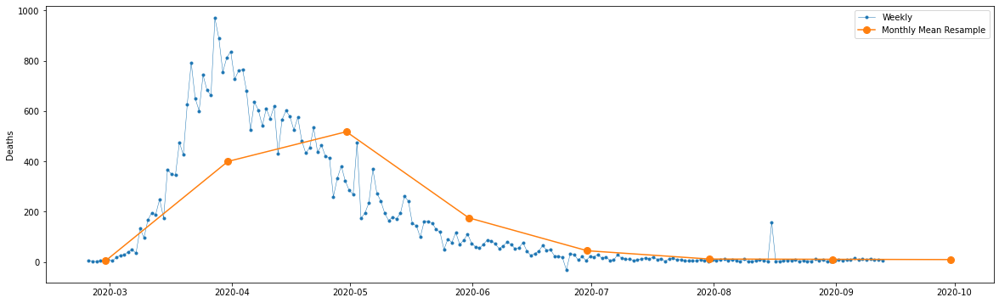

In [105]:
y2 = df2['Deaths']
fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(y2,marker='.', linestyle='-', linewidth=0.5, label='Weekly')
ax.plot(y2.resample('M').mean(),marker='o', markersize=8, linestyle='-', label='Monthly Mean Resample')
ax.set_ylabel('Deaths')
ax.legend();

### Decompose the Data

In [106]:
def seasonal_decompose (y):
    decomposition = sm.tsa.seasonal_decompose(y, period = 60, model='additive',extrapolate_trend='freq')
    fig = decomposition.plot()
    fig.set_size_inches(14,7)
    plt.show()

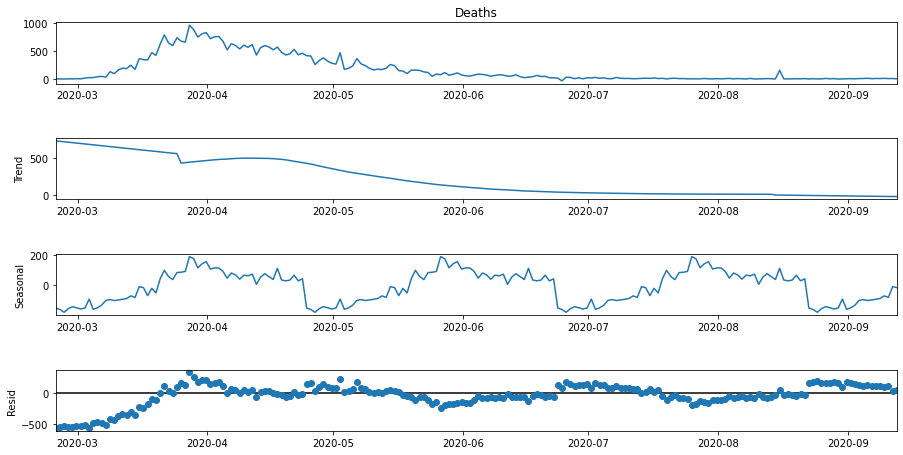

In [107]:
seasonal_decompose(y2)

### Check for Stationarity: Augmented Dickey-Fuller Test

In [108]:
def test_stationarity(timeseries, title):
    
    #Determing rolling statistics
    rolmean = pd.Series(timeseries).rolling(window=12).mean() 
    rolstd = pd.Series(timeseries).rolling(window=12).std()
    
    fig, ax = plt.subplots(figsize=(16, 4))
    ax.plot(timeseries, label= title)
    ax.plot(rolmean, label='rolling mean');
    ax.plot(rolstd, label='rolling std (x10)');
    ax.legend()

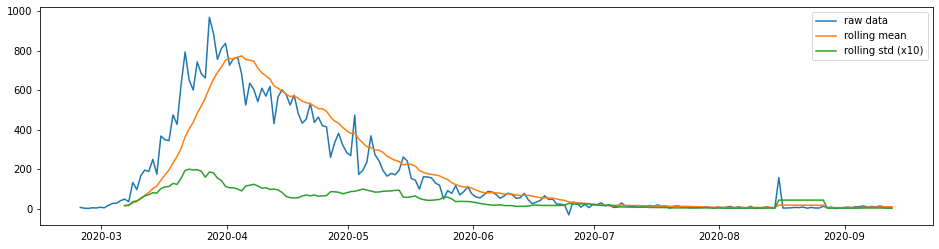

In [109]:
pd.options.display.float_format = '{:.8f}'.format
test_stationarity(df2['Deaths'],'raw data')

In [110]:
ADF_test(y2,'raw data')

 > Is the raw data stationary ?
Test statistic = -2.404
P-value = 0.141
Critical values :
	1%: -3.4648754262570978 - The data is not stationary with 99% confidence
	5%: -2.876714157488788 - The data is not stationary with 95% confidence
	10%: -2.574858699001736 - The data is not stationary with 90% confidence


### Make the Data Stationary: detrending and differencing

 > Is the de-trended data stationary ?
Test statistic = -2.975
P-value = 0.037
Critical values :
	1%: -3.467631519151906 - The data is not stationary with 99% confidence
	5%: -2.8779183721695567 - The data is  stationary with 95% confidence
	10%: -2.575501353364474 - The data is  stationary with 90% confidence


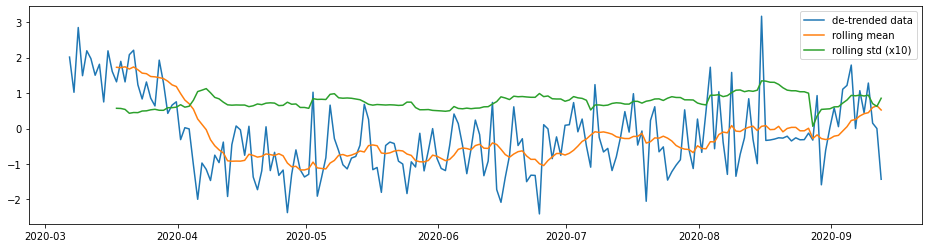

In [111]:
y_detrend =  (y2 - y2.rolling(window=12).mean())/y2.rolling(window=12).std()

test_stationarity(y_detrend,'de-trended data')
ADF_test(y_detrend,'de-trended data')

 > Is the 12 lag differenced data stationary ?
Test statistic = -4.252
P-value = 0.001
Critical values :
	1%: -3.4682803641749267 - The data is  stationary with 99% confidence
	5%: -2.8782017240816327 - The data is  stationary with 95% confidence
	10%: -2.5756525795918366 - The data is  stationary with 90% confidence


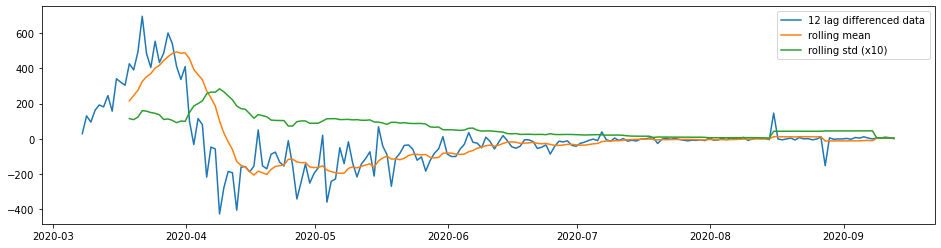

In [112]:
y_12lag =  y2 - y2.shift(12)

test_stationarity(y_12lag,'12 lag differenced data')
ADF_test(y_12lag,'12 lag differenced data')

 > Is the 3 lag differenced de-trended data stationary ?
Test statistic = -4.211
P-value = 0.001
Critical values :
	1%: -3.4687256239864017 - The data is  stationary with 99% confidence
	5%: -2.8783961376954363 - The data is  stationary with 95% confidence
	10%: -2.57575634100705 - The data is  stationary with 90% confidence


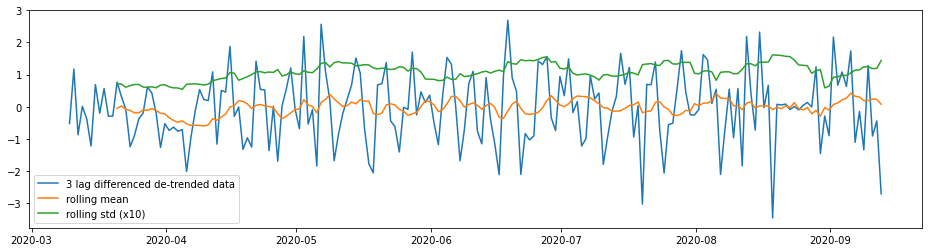

In [113]:
y_3lag_detrend =  y_detrend - y_detrend.shift(3)

test_stationarity(y_3lag_detrend,'3 lag differenced de-trended data')
ADF_test(y_3lag_detrend,'3 lag differenced de-trended data')

### Create Training & Testing Datasets

In [114]:
df2.index = pd.DatetimeIndex(df2.index).to_period('D')

In [115]:
y2 = df2['Deaths']

In [116]:
y_to_train = y2[:150] # dataset to train
y_to_val = y2[150:] # last X months for test  
predict_date = len(y2) - len(y2[:150])

<a id="Italysarima2"></a>

### SARIMA
[▲ Return to contents](#Contents)

In [117]:
sarima_grid_search(y2,30)

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


The set of parameters with the minimum AIC is: SARIMA(1, 1, 1)x(1, 1, 1, 30) - AIC:1466.8851613537036


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1411      0.068      2.085      0.037       0.008       0.274
ma.L1         -0.6977      0.056    -12.386      0.000      -0.808      -0.587
ar.S.L30       0.0251      0.006      4.101      0.000       0.013       0.037
ma.S.L30      -0.6709      0.127     -5.276      0.000      -0.920      -0.422
sigma2      1971.3053    218.186      9.035      0.000    1543.669    2398.941


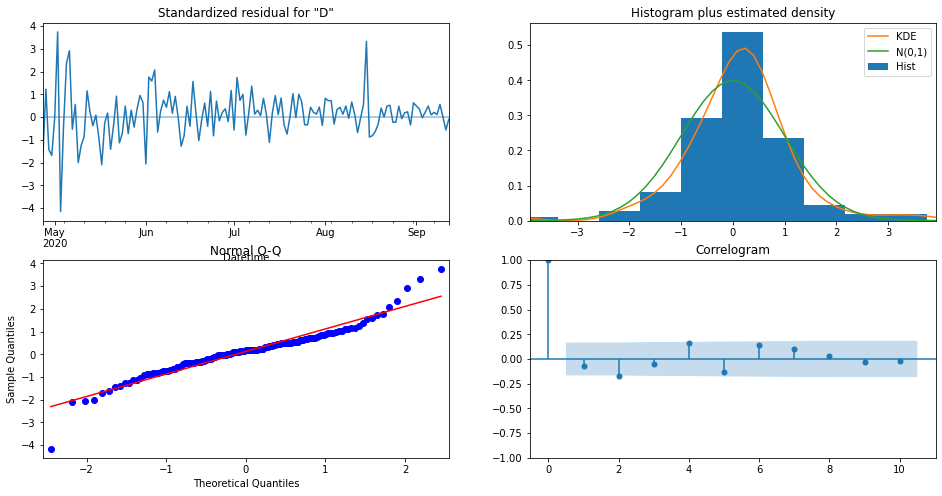

The Root Mean Squared Error of SARIMA with season_length=30 and dynamic = False 28.99


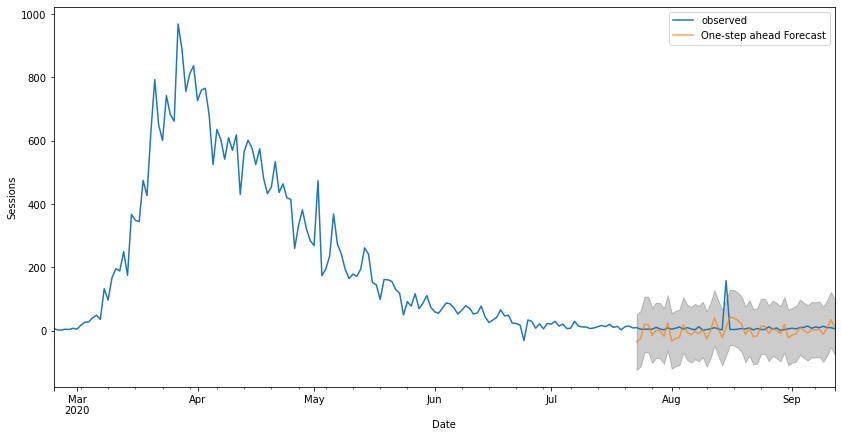

The Root Mean Squared Error of SARIMA with season_length=30 and dynamic = True 131.78


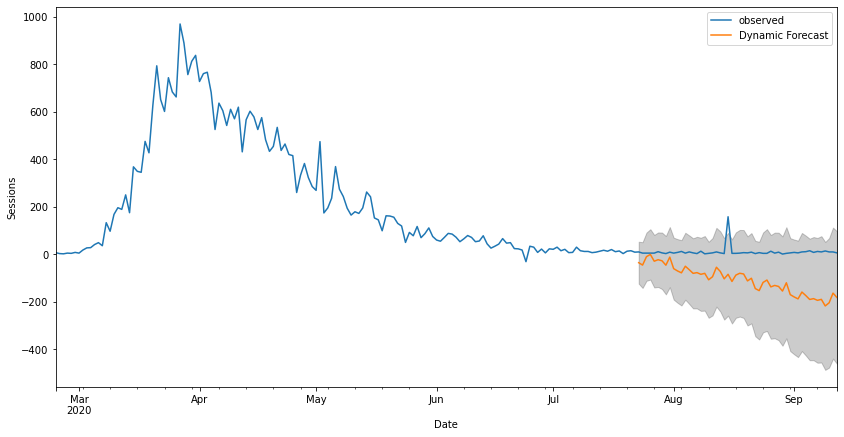

In [118]:
model = sarima_eva(y2,(1, 1, 1),(1, 1, 1, 30),30,'2020-07-23 17:00:00',y_to_val)

In [119]:
def forecast(model,predict_steps,y):
    
    pred_uc = model.get_forecast(steps=predict_steps)

    #SARIMAXResults.conf_int, can change alpha,the default alpha = .05 returns a 95% confidence interval.
    pred_ci = pred_uc.conf_int()

    ax = y.plot(label='observed', figsize=(14, 7))
#     print(pred_uc.predicted_mean)
    pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.25)
    ax.set_xlabel('Date')
    ax.set_ylabel(y.name)
    plt.ylim(bottom=-1)
    plt.legend()
    plt.show()
    
    # Produce the forcasted tables 
    pm = pred_uc.predicted_mean.reset_index()
    pm.columns = ['Date','Predicted_Mean']
    pci = pred_ci.reset_index()
    pci.columns = ['Date','Lower Bound','Upper Bound']
    final_table = pm.join(pci.set_index('Date'), on='Date')
    
    return (final_table)

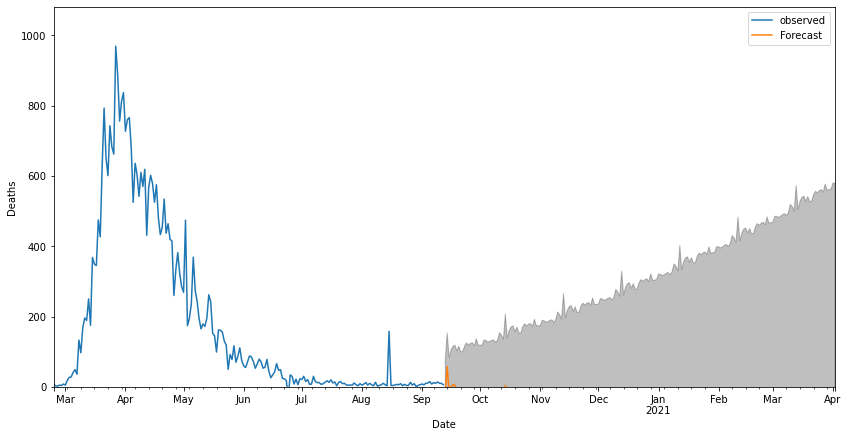

,Date,Predicted_Mean,Lower Bound,Upper Bound
0,2020-09-13,-11.19105280,-98.45293513,76.07082952
1,2020-09-14,58.07358860,-37.39884329,153.54602049
2,2020-09-15,-17.32788170,-117.98279619,83.32703278
3,2020-09-16,0.32900559,-104.96543910,105.62345028
4,2020-09-17,6.07954069,-103.61943416,115.77851554


In [120]:
final_table = forecast(model,202,y2)
final_table.head()

In [121]:
y_to_val2=y2['2020-03-10':'2020-03-15']

In [122]:
sarima_grid_search(y2[:'2020-03-15'],2)

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


The set of parameters with the minimum AIC is: SARIMA(1, 1, 1)x(0, 1, 1, 2) - AIC:148.5583453990705


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9503      0.342     -2.776      0.006      -1.621      -0.279
ma.L1         -0.1955      0.474     -0.412      0.680      -1.125       0.734
ma.S.L2       -0.2586      0.358     -0.722      0.470      -0.960       0.443
sigma2      1341.5297    679.661      1.974      0.048       9.419    2673.640


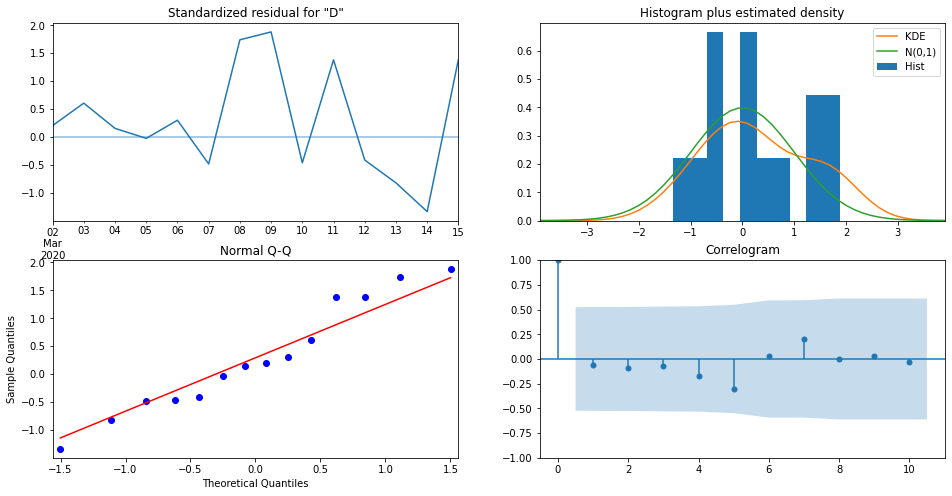

The Root Mean Squared Error of SARIMA with season_length=2 and dynamic = False 38.66


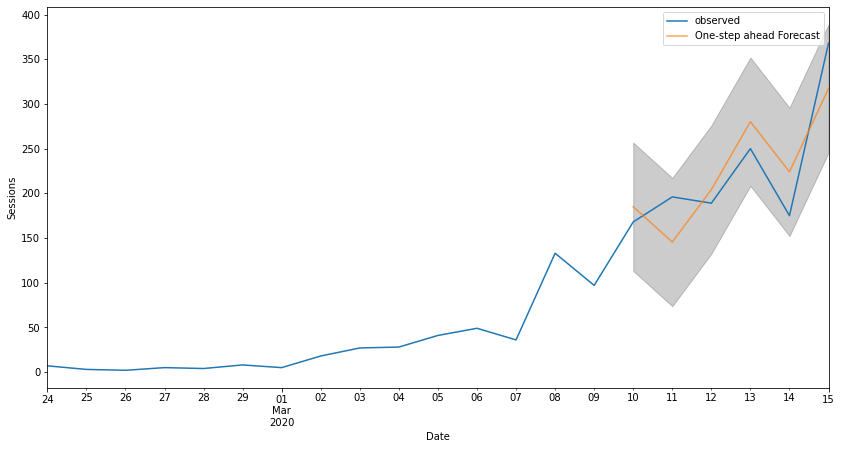

The Root Mean Squared Error of SARIMA with season_length=2 and dynamic = True 82.83


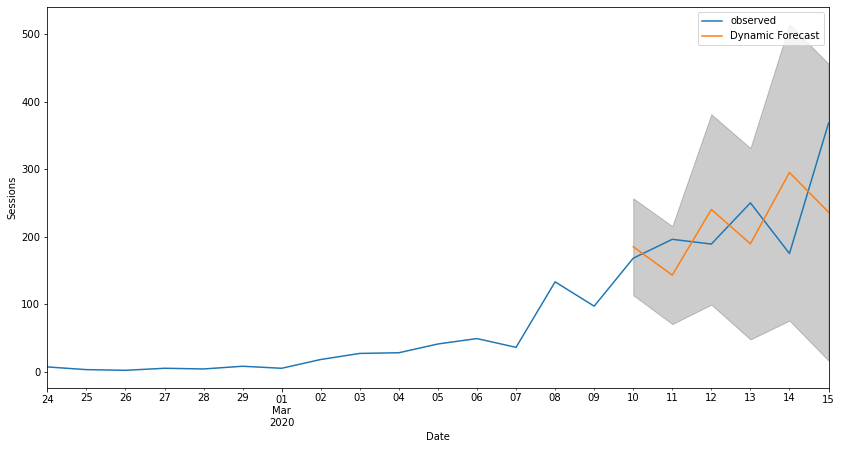

In [123]:
model = sarima_eva(y2[:'2020-03-15'],(1, 1, 1),(0, 1, 1, 2),2,'2020-03-10',y_to_val2)

In [124]:
def forecast2(model,predict_steps,y, y_tot):
    
    pred_uc = model.get_forecast(steps=predict_steps)

    #SARIMAXResults.conf_int, can change alpha,the default alpha = .05 returns a 95% confidence interval.
    pred_ci = pred_uc.conf_int()

    ax = y_tot.plot(label='observed', figsize=(14, 7))
#     print(pred_uc.predicted_mean)
    pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.25)
    ax.set_xlabel('Date')
    ax.set_ylabel(y.name)
    plt.ylim(bottom=-1, top=60000)
    plt.legend()
    plt.show()
    
    # Produce the forcasted tables 
    pm = pred_uc.predicted_mean.reset_index()
    pm.columns = ['Date','Predicted_Mean']
    pci = pred_ci.reset_index()
    pci.columns = ['Date','Lower Bound','Upper Bound']
    final_table = pm.join(pci.set_index('Date'), on='Date')
    
    return (final_table)

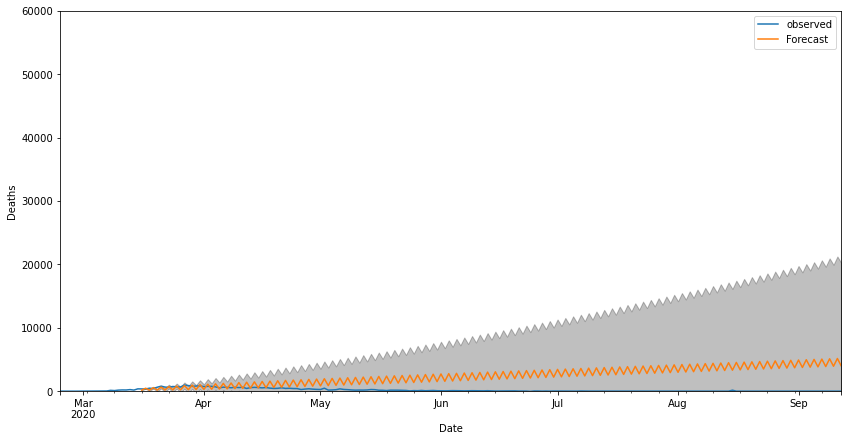

,Date,Predicted_Mean,Lower Bound,Upper Bound
0,2020-03-16,168.78620937,96.99880703,240.57361170
1,2020-03-17,464.22048933,391.67401948,536.76695918
2,2020-03-18,170.23089026,29.21489095,311.24688956
3,2020-03-19,555.72970058,413.98625197,697.47314919
4,2020-03-20,176.15265295,-43.21513012,395.52043601


In [125]:
final_table2 = forecast2(model,181,y2[:'2020-03-15'],y2)
final_table2.head()

<a id="Italyses2"></a>

### Simple Exponential Smoothing (SES)
[▲ Return to contents](#Contents)

In [126]:
def ses(y, y_to_train,y_to_test,smoothing_level,predict_date):
    y.plot(marker='o', color='black', legend=True, figsize=(14, 7))
    
    fit1 = SimpleExpSmoothing(y_to_train).fit(smoothing_level=smoothing_level,optimized=False)
    fcast1 = fit1.forecast(predict_date).rename(r'$\alpha={}$'.format(smoothing_level))
    # specific smoothing level
    fcast1.plot(marker='o', color='blue', legend=True)
    fit1.fittedvalues.plot(marker='o',  color='blue')
    mse1 = ((fcast1 - y_to_test) ** 2).mean()
    print('The Root Mean Squared Error of our forecasts with smoothing level of {} is {}'.format(smoothing_level,round(np.sqrt(mse1), 2)))
    
    ## auto optimization
    fit2 = SimpleExpSmoothing(y_to_train).fit()
    fcast2 = fit2.forecast(predict_date).rename(r'$\alpha=%s$'%fit2.model.params['smoothing_level'])
    # plot
    fcast2.plot(marker='o', color='green', legend=True)
    fit2.fittedvalues.plot(marker='o', color='green')
    
    mse2 = ((fcast2 - y_to_test) ** 2).mean()
    print('The Root Mean Squared Error of our forecasts with auto optimization is {}'.format(round(np.sqrt(mse2), 2)))
    
    plt.show()

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\holtwinters\model.py:429: FutureWarning: After 0.13 initialization must be handled at model creation
  FutureWarning,
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\holtwinters\model.py:429: FutureWarning: After 0.13 initialization must be handled at model creation
  FutureWarning,


The Root Mean Squared Error of our forecasts with smoothing level of 0.8 is 20.98
The Root Mean Squared Error of our forecasts with auto optimization is 20.99


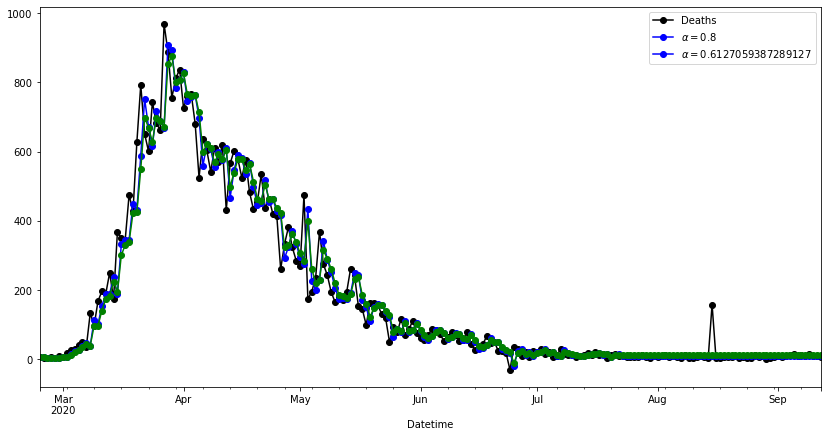

In [127]:
ses(y2, y_to_train,y_to_val,0.8,predict_date)

<a id="Italyarima2"></a>

### ARIMA
[▲ Return to contents](#Contents)

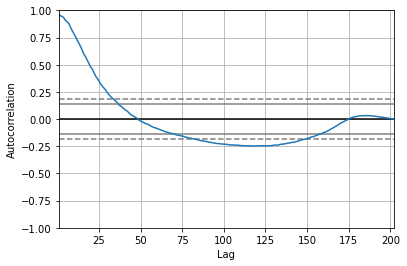

In [128]:
autocorrelation_plot(y2)
plt.show()

                               SARIMAX Results                                
Dep. Variable:                 Deaths   No. Observations:                  202
Model:                ARIMA(10, 2, 0)   Log Likelihood               -1076.886
Date:                Mon, 14 Dec 2020   AIC                           2175.771
Time:                        03:22:56   BIC                           2212.053
Sample:                    02-24-2020   HQIC                          2190.454
                         - 09-12-2020                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.4640      0.046    -31.579      0.000      -1.555      -1.373
ar.L2         -1.7191      0.085    -20.271      0.000      -1.885      -1.553
ar.L3         -1.6591      0.106    -15.693      0.0

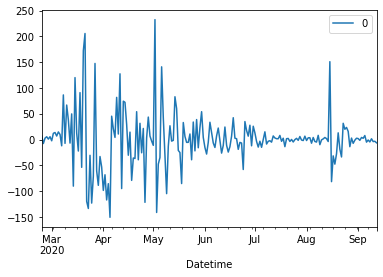

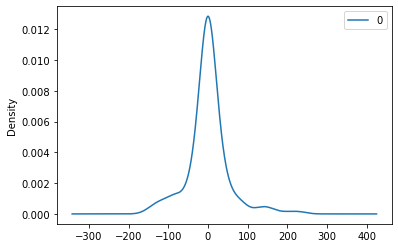

                  0
count  202.00000000
mean     0.00893311
std     52.12157207
min   -150.53149861
25%    -14.20558267
50%     -0.58441958
75%     13.03759605
max    232.61771847


In [129]:
# fit model
model = ARIMA(y2, order=(10,2,0))
model_fit = model.fit()
print(model_fit.summary())
# plot residual errors
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
plt.show()
residuals.plot(kind='kde')
plt.show()
print(residuals.describe())

Test MSE: 27.520


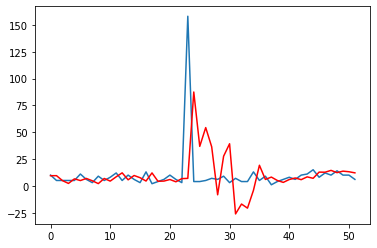

In [130]:
train, test = y_to_train.values, y_to_val.values
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(10,2,0))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)
    #print('predicted=%f, expected=%f' % (yhat, obs))
error = mean_squared_error(test, predictions, squared=False)
print('Test MSE: %.3f' % error)
# plot
plt.plot(test)
plt.plot(predictions, color='red')
plt.show()

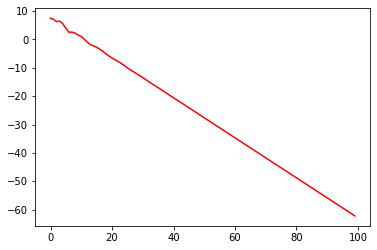

In [131]:
model = ARIMA(y2.values, order=(10,2,0))
model_fit = model.fit()
output = model_fit.forecast(steps=100)
    

plt.plot(output, color='red')
plt.show()

<a id="SouthKorea"></a>

# SOUTH KOREA
[▲ Return to contents](#Contents)

<a id="Southclean"></a>

## Data Cleaning
[▲ Return to contents](#Contents)

In [132]:
# Loading and cleaning data of covid cases 
data_ts_cases = pd.read_csv("Data/South Korea/time_series_covid_19_confirmed.csv")

In [133]:
data_ts_cases.head(5)

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20,9/22/20,9/23/20
0,NaN,Afghanistan,33.93911000,67.70995300,0,0,0,0,0,0,...,38772,38815,38855,38872,38883,38919,39044,39074,39096,39145
1,NaN,Albania,41.15330000,20.16830000,0,0,0,0,0,0,...,11520,11672,11816,11948,12073,12226,12385,12535,12666,12787
2,NaN,Algeria,28.03390000,1.65960000,0,0,0,0,0,0,...,48496,48734,48966,49194,49413,49623,49826,50023,50214,50400
3,NaN,Andorra,42.50630000,1.52180000,0,0,0,0,0,0,...,1438,1438,1483,1483,1564,1564,1564,1681,1681,1753
4,NaN,Angola,-11.20270000,17.87390000,0,0,0,0,0,0,...,3439,3569,3675,3789,3848,3901,3991,4117,4236,4363


In [134]:
country_col = data_ts_cases["Country/Region"]
country_col.describe()

count       266
unique      188
top       China
freq         33
Name: Country/Region, dtype: object

In [135]:
sk_ts_cases = data_ts_cases.loc[data_ts_cases["Country/Region"] == "Korea, South"].drop(columns=['Province/State', 'Lat', 'Long'])

In [136]:
sk_ts_cases.head()

,Country/Region,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,...,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20,9/22/20,9/23/20
155,"Korea, South",1,1,2,2,3,4,4,4,4,...,22391,22504,22657,22783,22893,22975,23045,23106,23216,23341


In [137]:
# Loading and cleaning data of covid deaths 
data_ts_deaths = pd.read_csv("Data/South Korea/time_series_covid_19_deaths.csv")

In [138]:
data_ts_deaths.head(5)

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20,9/22/20,9/23/20
0,NaN,Afghanistan,33.93911000,67.70995300,0,0,0,0,0,0,...,1425,1426,1436,1436,1437,1437,1441,1444,1445,1446
1,NaN,Albania,41.15330000,20.16830000,0,0,0,0,0,0,...,338,340,343,347,353,358,362,364,367,370
2,NaN,Algeria,28.03390000,1.65960000,0,0,0,0,0,0,...,1620,1632,1645,1654,1659,1665,1672,1679,1689,1698
3,NaN,Andorra,42.50630000,1.52180000,0,0,0,0,0,0,...,53,53,53,53,53,53,53,53,53,53
4,NaN,Angola,-11.20270000,17.87390000,0,0,0,0,0,0,...,136,139,143,144,147,147,152,154,155,159


In [139]:
sk_ts_deaths = data_ts_deaths.loc[data_ts_deaths["Country/Region"] == "Korea, South"].drop(columns=['Province/State', 'Lat', 'Long'])

In [140]:
sk_ts_deaths.head(5)

,Country/Region,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,...,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20,9/22/20,9/23/20
155,"Korea, South",0,0,0,0,0,0,0,0,0,...,367,367,372,377,378,383,385,388,388,393


In [141]:
# loading data of covid cases recovered 
data_ts_recovered = pd.read_csv("Data/South Korea/time_series_covid_19_recovered.csv")

In [142]:
data_ts_recovered.head(5)

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20,9/22/20,9/23/20
0,NaN,Afghanistan,33.93911000,67.70995300,0,0,0,0,0,0,...,32073,32098,32503,32505,32576,32576,32576,32576,32576,32610
1,NaN,Albania,41.15330000,20.16830000,0,0,0,0,0,0,...,6615,6668,6733,6788,6831,6888,6940,6995,7042,7139
2,NaN,Algeria,28.03390000,1.65960000,0,0,0,0,0,0,...,34204,34385,34517,34675,34818,34923,35047,35180,35307,35428
3,NaN,Andorra,42.50630000,1.52180000,0,0,0,0,0,0,...,945,945,1054,1054,1164,1164,1164,1199,1199,1203
4,NaN,Angola,-11.20270000,17.87390000,0,0,0,0,0,0,...,1324,1332,1401,1405,1443,1445,1445,1449,1462,1473


In [143]:
sk_ts_recovered = data_ts_recovered.loc[data_ts_recovered["Country/Region"] == "Korea, South"].drop(columns=['Province/State', 'Lat', 'Long'])

In [144]:
sk_ts_recovered.head(5)

,Country/Region,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,...,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20,9/22/20,9/23/20
142,"Korea, South",0,0,0,0,0,0,0,0,0,...,18878,19310,19543,19771,19970,20158,20248,20441,20650,20832


In [145]:
# Contact tracing data 
data_contact_tracing = pd.read_csv("Data/South Korea/COVID19_line_list_data.csv")

In [146]:
sk_ct = data_contact_tracing.loc[data_contact_tracing["country"] == "South Korea"]

In [147]:
#Loading covid_19 data
data_covid = pd.read_csv("Data/South Korea/covid_19_data.csv")

In [148]:
data_covid.head(5)

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.00000000,0.00000000,0.00000000
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.00000000,0.00000000,0.00000000
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.00000000,0.00000000,0.00000000
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1.00000000,0.00000000,0.00000000
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0.00000000,0.00000000,0.00000000


In [149]:
sk_covid = data_covid.loc[data_covid["Country/Region"] == "South Korea"]

In [150]:
sk_covid.head(5)

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
37,38,01/22/2020,NaN,South Korea,1/22/2020 17:00,1.00000000,0.00000000,0.00000000
75,76,01/23/2020,NaN,South Korea,1/23/20 17:00,1.00000000,0.00000000,0.00000000
121,122,01/24/2020,NaN,South Korea,1/24/20 17:00,2.00000000,0.00000000,0.00000000
162,163,01/25/2020,NaN,South Korea,1/25/20 17:00,2.00000000,0.00000000,0.00000000
208,209,01/26/2020,NaN,South Korea,1/26/20 16:00,3.00000000,0.00000000,0.00000000


In [151]:
sk_covid.groupby(by='ObservationDate').sum().head()

,SNo,Confirmed,Deaths,Recovered
ObservationDate,,,,
01/22/2020,38,1.00000000,0.00000000,0.00000000
01/23/2020,76,1.00000000,0.00000000,0.00000000
01/24/2020,122,2.00000000,0.00000000,0.00000000
01/25/2020,163,2.00000000,0.00000000,0.00000000
01/26/2020,209,3.00000000,0.00000000,0.00000000


In [152]:
df_sk = sk_covid.groupby(by='ObservationDate').sum().reset_index()

In [153]:
df_sk.tail()

,ObservationDate,SNo,Confirmed,Deaths,Recovered
241,09/19/2020,113234,22975.00000000,383.00000000,20158.00000000
242,09/20/2020,113976,23045.00000000,385.00000000,20248.00000000
243,09/21/2020,114718,23106.00000000,388.00000000,20441.00000000
244,09/22/2020,115461,23216.00000000,388.00000000,20650.00000000
245,09/23/2020,116204,23341.00000000,393.00000000,20832.00000000


In [154]:
national_cases_sk = df_sk['Confirmed'].values
daily_cases = [national_cases_sk[0]]

for i in range(1, len(national_cases_sk)):
    change = national_cases_sk[i] - national_cases_sk[i-1]
    daily_cases.append(change)
    
df_sk['new_cases'] = daily_cases

In [155]:
national_deaths_sk = df_sk['Deaths'].values
daily_deaths = [national_deaths_sk[0]]

for i in range(1, len(national_deaths_sk)):
    change = national_deaths_sk[i] - national_deaths_sk[i-1]
    daily_deaths.append(change)
    
df_sk['new_deaths'] = daily_deaths

In [156]:
national_recover_sk = df_sk['Recovered'].values
daily_recover = [national_recover_sk[0]]

for i in range(1, len(national_recover_sk)):
    change = national_recover_sk[i] - national_recover_sk[i-1]
    daily_recover.append(change)

In [157]:
len(daily_cases)

246

In [158]:
len(daily_deaths)

246

In [159]:
len(daily_recover)

246

In [160]:
sk_confirmed = sk_covid.groupby(by='ObservationDate').sum()['Confirmed'].values
sk_deaths = sk_covid.groupby(by='ObservationDate').sum()['Deaths'].values
sk_recovered = sk_covid.groupby(by='ObservationDate').sum()['Recovered'].values

<a id="Southvisuals"></a>

## Visualizations
[▲ Return to contents](#Contents)

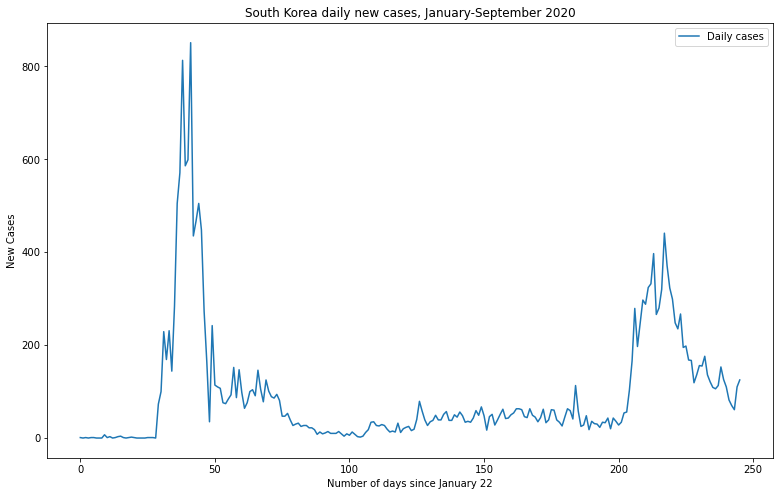

In [161]:
plt.figure(figsize=(13,8))
plt.plot(range(246), daily_cases, label="Daily cases")
#plt.plot(range(55), accs_test, '-+', label="Test accuracy")
plt.legend()
plt.title("South Korea daily new cases, January-September 2020")
plt.ylabel("New Cases")
plt.xlabel("Number of days since January 22")
plt.show();

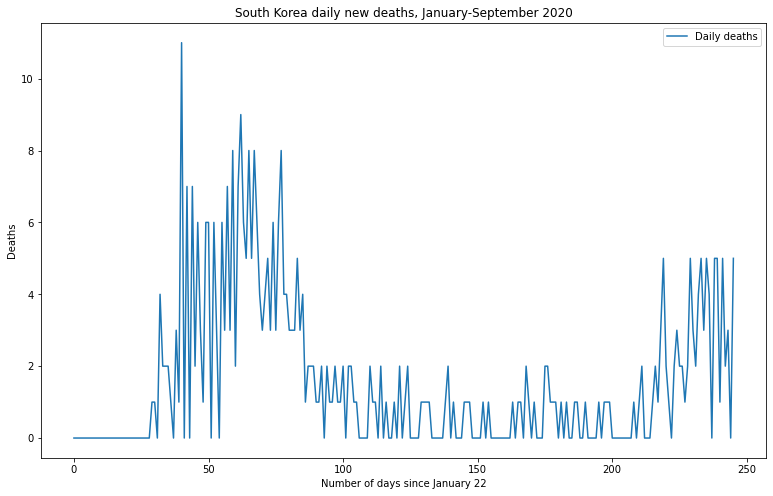

In [162]:
plt.figure(figsize=(13,8))
plt.plot(range(246), daily_deaths, label="Daily deaths")
#plt.plot(range(55), accs_test, '-+', label="Test accuracy")
plt.legend()
plt.title("South Korea daily new deaths, January-September 2020")
plt.ylabel("Deaths")
plt.xlabel("Number of days since January 22")
plt.show();

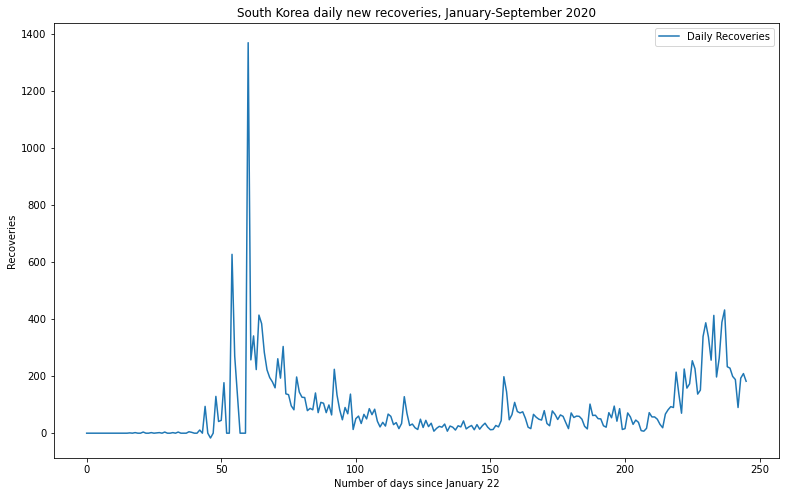

In [163]:
plt.figure(figsize=(13,8))
plt.plot(range(246), daily_recover, label="Daily Recoveries")
#plt.plot(range(55), accs_test, '-+', label="Test accuracy")
plt.legend()
plt.title("South Korea daily new recoveries, January-September 2020")
plt.ylabel("Recoveries")
plt.xlabel("Number of days since January 22")
plt.show();

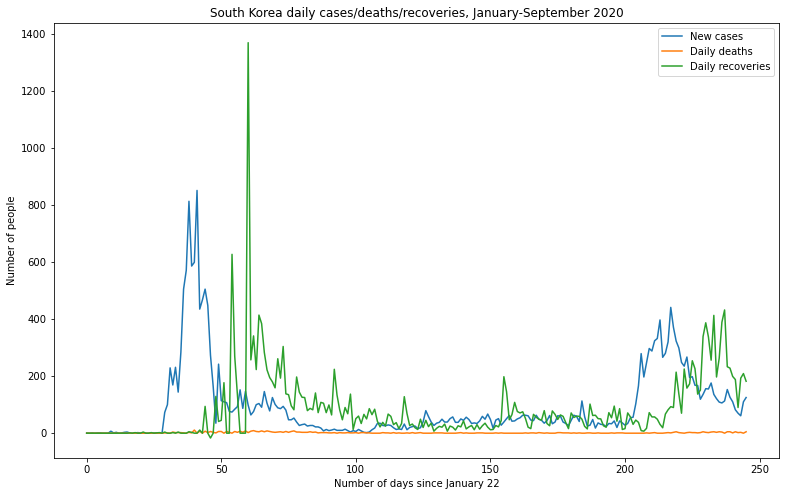

In [164]:
plt.figure(figsize=(13,8))
plt.plot(range(246), daily_cases, label="New cases")
plt.plot(range(246), daily_deaths, label="Daily deaths")
plt.plot(range(246), daily_recover, label="Daily recoveries")
#plt.plot(range(55), accs_test, '-+', label="Test accuracy")
plt.legend()
plt.title("South Korea daily cases/deaths/recoveries, January-September 2020")
plt.ylabel("Number of people")
plt.xlabel("Number of days since January 22")
plt.show();

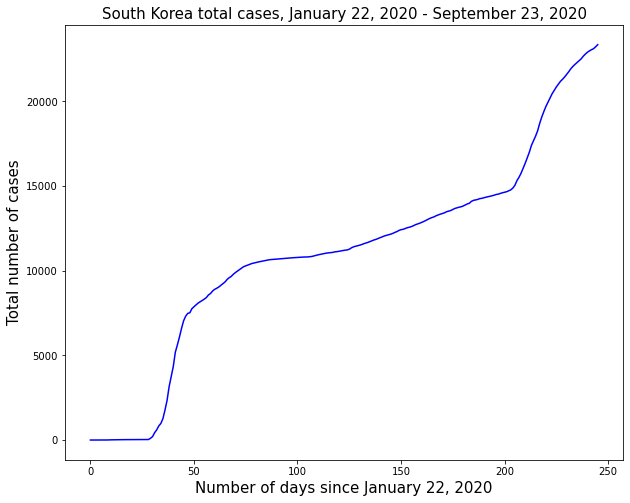

In [165]:
plt.figure(figsize=(10,8))
plt.plot(range(246), sk_confirmed, color='blue')
plt.title("South Korea total cases, January 22, 2020 - September 23, 2020", fontsize = 15)
plt.ylabel("Total number of cases", fontsize = 15)
plt.xlabel("Number of days since January 22, 2020", fontsize = 15)
plt.show()

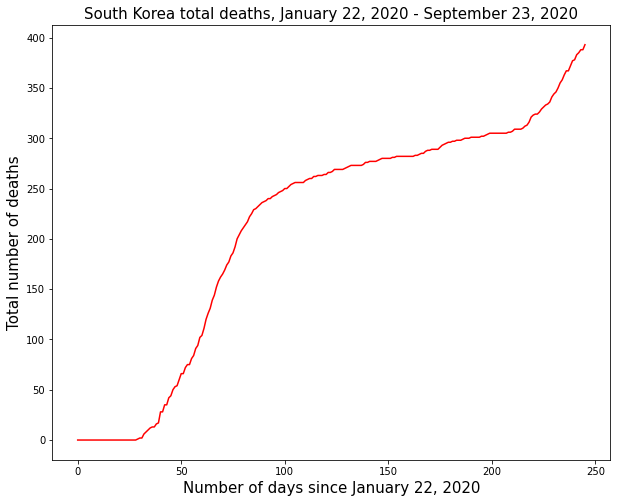

In [166]:
plt.figure(figsize=(10,8))
plt.plot(range(246), sk_deaths, color='red')
plt.title("South Korea total deaths, January 22, 2020 - September 23, 2020", fontsize = 15)
plt.ylabel("Total number of deaths", fontsize = 15)
plt.xlabel("Number of days since January 22, 2020", fontsize = 15)
plt.show()

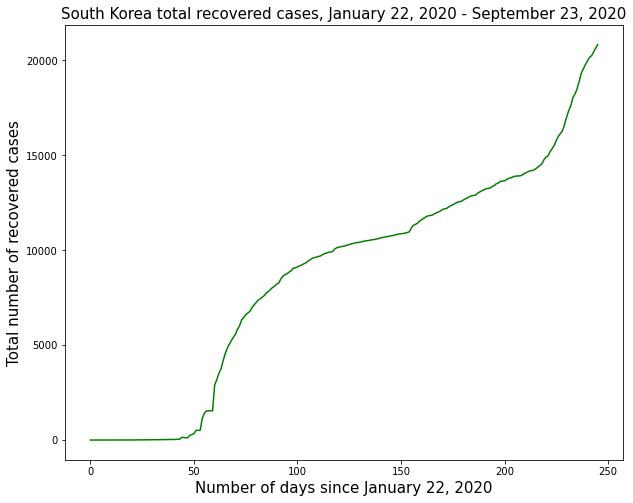

In [167]:
plt.figure(figsize=(10,8))
plt.plot(range(246), sk_recovered, color='green')
plt.title("South Korea total recovered cases, January 22, 2020 - September 23, 2020", fontsize = 15)
plt.ylabel("Total number of recovered cases", fontsize = 15)
plt.xlabel("Number of days since January 22, 2020", fontsize = 15)
plt.show()

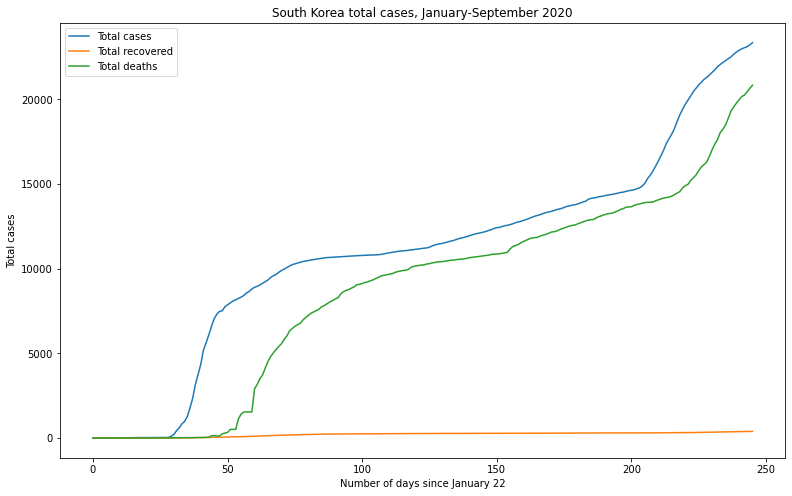

In [168]:
plt.figure(figsize=(13,8))
plt.plot(range(246), sk_confirmed, label="Total cases")
plt.plot(range(246), sk_deaths, label="Total recovered")
plt.plot(range(246), sk_recovered, label="Total deaths")

plt.legend()
plt.title("South Korea total cases, January-September 2020")
plt.ylabel("Total cases")
plt.xlabel("Number of days since January 22")
plt.show();

<a id="Southpoly"></a>

## Polynomial Regression Model
[▲ Return to contents](#Contents)

In [169]:
df_sk['Days'] = df_sk.index

In [170]:
df_sk.head()

,ObservationDate,SNo,Confirmed,Deaths,Recovered,new_cases,new_deaths,Days
0,01/22/2020,38,1.00000000,0.00000000,0.00000000,1.00000000,0.00000000,0
1,01/23/2020,76,1.00000000,0.00000000,0.00000000,0.00000000,0.00000000,1
2,01/24/2020,122,2.00000000,0.00000000,0.00000000,1.00000000,0.00000000,2
3,01/25/2020,163,2.00000000,0.00000000,0.00000000,0.00000000,0.00000000,3
4,01/26/2020,209,3.00000000,0.00000000,0.00000000,1.00000000,0.00000000,4


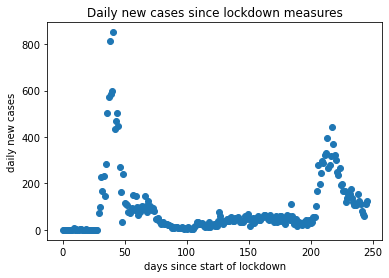

In [171]:
#scatter plot of new cases since start of lockdown measures
x = df_sk['Days']
y = df_sk['new_cases']

plt.scatter(x, y)

plt.xlabel("days since start of lockdown")
plt.ylabel("daily new cases")
plt.title("Daily new cases since lockdown measures")
plt.show()

In [172]:
#define predictor and response variable
X = df_sk[['Days']].values
Y = df_sk['new_cases'].values

In [173]:
#split the train data into train and validation sets 
x_train, x_val, y_train, y_val = train_test_split(X,Y, train_size=0.8, random_state=44)

In [174]:
#find the best degree for the polynomial regression
maxdeg = 30
training_error, validation_error = [],[]

for d in range(maxdeg):
    
    x_poly_train = PolynomialFeatures(d).fit_transform(x_train)
    x_poly_val = PolynomialFeatures(d).fit_transform(x_val)
    
    polymodel = LinearRegression()
    polymodel.fit(x_poly_train, y_train)
    
    y_train_pred = polymodel.predict(x_poly_train)
    y_val_pred = polymodel.predict(x_poly_val)
    
    training_error.append(mean_squared_error(y_train, y_train_pred))
    validation_error.append(mean_squared_error(y_val, y_val_pred))

In [175]:
#find best degree based on lowest mse
min_mse_train = min(training_error)

best_degree_train = training_error.index(min_mse_train)

min_mse_val = min(validation_error)

best_degree_val = validation_error.index(min_mse_val)

print("The lowest train MSE is",min_mse_train)

print("The lowest validation MSE is",min_mse_val)

print("The degree of the model that gives the lowest train MSE is",best_degree_train)

print("The degree of the model that gives the lowest validation MSE is",best_degree_val)

The lowest train MSE is 9043.06470703573
The lowest validation MSE is 12727.041285375266
The degree of the model that gives the lowest train MSE is 7
The degree of the model that gives the lowest validation MSE is 7


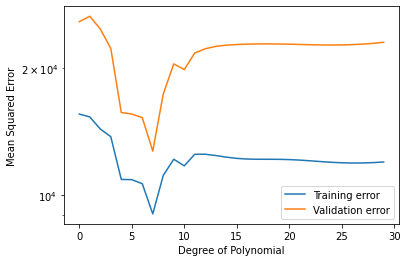

In [176]:
#plot training and validation mse
fig, ax = plt.subplots()

ax.plot(range(maxdeg), training_error, label = 'Training error')

ax.plot(range(maxdeg), validation_error, label = 'Validation error')

ax.set_xlabel('Degree of Polynomial')
ax.set_ylabel('Mean Squared Error')
ax.legend(loc = 'best')
ax.set_yscale('log')
plt.show()

In [177]:
#fit polynomial regression with degree 7
x_train_poly3 = PolynomialFeatures(degree=best_degree_val).fit_transform(X)

polymodel = LinearRegression()
polymodel.fit(x_train_poly3,Y)

y_train_pred3 = polymodel.predict(x_train_poly3)

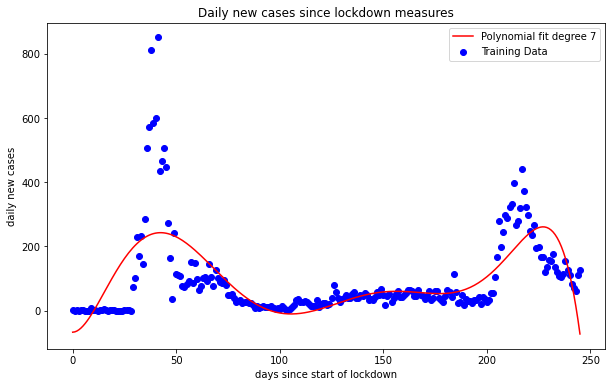

In [178]:
#plot polynomial regression on scatterplot
plt.figure(figsize=(10,6))

idx = np.argsort(X[:,0])
X = X[idx]
y_train_pred3 = y_train_pred3[idx]

plt.scatter(X, Y, c='b', label="Training Data")

# Also plot the polynomial regression fit curve
plt.plot(X, y_train_pred3, c='r', label="Polynomial fit degree 7")

#Assigning labels to the axes
plt.xlabel("days since start of lockdown")
plt.ylabel("daily new cases")
plt.title("Daily new cases since lockdown measures")
plt.legend()
plt.show()

In [179]:
#find the best degree of the polynomial regression by running the model on a range of degree values and using k-fold cross validation. 
maxdeg = 30

cross_training_error, cross_validation_error = [],[]

for d in range(maxdeg):
    
    x_poly_train = PolynomialFeatures(d).fit_transform(X)
    
    polymodel = LinearRegression()
    
    mse_score = cross_validate(polymodel, x_poly_train, Y, cv=10, scoring="neg_mean_squared_error",return_train_score=True)
    
    polymodel.fit(x_poly_train, Y)
    
    y_train_pred = polymodel.predict(x_poly_train)
    
    cross_training_error.append(mean_squared_error(Y, y_train_pred))
    
    cross_validation_error.append(np.mean(-mse_score['test_score']))

In [180]:
min_mse_crosstrain = min(cross_training_error)

best_degree_crosstrain = cross_training_error.index(min_mse_crosstrain)

min_mse_crossval = min(cross_validation_error)

best_degree_crossval = cross_validation_error.index(min_mse_crossval)

print("The lowest train MSE is",min_mse_crosstrain)

print("The lowest cross validation MSE is",min_mse_crossval)

print("The degree of the model that gives the lowest train MSE is",best_degree_crosstrain)

print("The degree of the model that gives the lowest cross validation MSE is",best_degree_crossval)

The lowest train MSE is 9749.972032668918
The lowest cross validation MSE is 19663.705845536337
The degree of the model that gives the lowest train MSE is 7
The degree of the model that gives the lowest cross validation MSE is 0


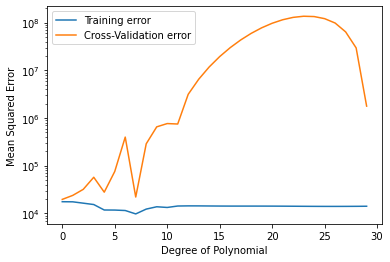

In [181]:
fig, ax = plt.subplots()

ax.plot(range(maxdeg), cross_training_error, label = 'Training error')

ax.plot(range(maxdeg), cross_validation_error, label = 'Cross-Validation error')

ax.set_xlabel('Degree of Polynomial')
ax.set_ylabel('Mean Squared Error')
ax.legend(loc = 'best')
ax.set_yscale('log')
plt.show()

In [182]:
#find best degree using k-fold cross validation along with bootstraps
maxdeg5 = 50
numboot = 100

bestdeg = []

for i in range(numboot):
    df_sampled = df_sk.sample(frac=1, replace=True)
    
    x_samp = df_sampled[['Days']].values
    y_samp = df_sampled['new_cases'].values
    
    cross_training_error, cross_validation_error = [],[]
    
    for d in range(maxdeg):
        
        x_poly_train = PolynomialFeatures(d).fit_transform(x_samp)
        
        polymodel = LinearRegression()
        
        mse_score = cross_validate(polymodel, x_poly_train, y_samp, cv=10, scoring="neg_mean_squared_error",return_train_score=True)
        
        polymodel.fit(x_poly_train, y_samp)
        
        y_train_pred = polymodel.predict(x_poly_train)
        
        cross_training_error.append(mean_squared_error(y_samp, y_train_pred))
        
        cross_validation_error.append(np.mean(-mse_score['test_score']))
        
    min_mse_crossval = min(cross_validation_error)

    best_degree_crossval = cross_validation_error.index(min_mse_crossval)
    
    bestdeg.append(best_degree_crossval)

In [183]:
best_dict = {i:bestdeg.count(i) for i in bestdeg}
max_deg = max(best_dict.values())
best_deg = [i for i in best_dict.keys() if best_dict[i] == max_deg][0]

print("The degree voted the most times is: " + str(best_deg))

The degree voted the most times is: 7


In [184]:
x_train_poly4 = PolynomialFeatures(degree=best_deg).fit_transform(X)

polymodel4 = LinearRegression()
polymodel4.fit(x_train_poly4,Y)

y_train_pred4 = polymodel4.predict(x_train_poly4)

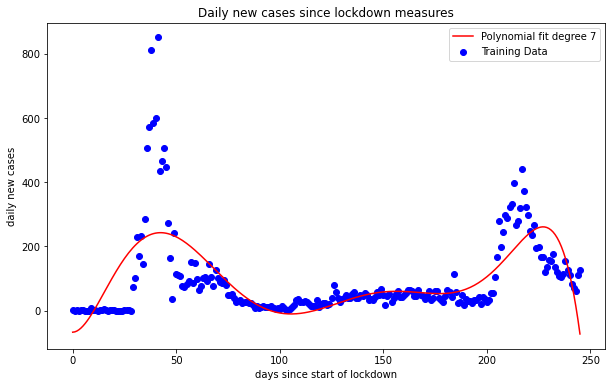

In [185]:
plt.figure(figsize=(10,6))

idx = np.argsort(X[:,0])
X = X[idx]
y_train_pred4 = y_train_pred4[idx]

plt.scatter(X, Y, c='b', label="Training Data")

# Also plot the polynomial regression fit curve
plt.plot(X, y_train_pred4, c='r', label="Polynomial fit degree 7")

#Assigning labels to the axes
plt.xlabel("days since start of lockdown")
plt.ylabel("daily new cases")
plt.title("Daily new cases since lockdown measures")
plt.legend()
plt.savefig('south_model.jpg', dpi=400)

<a id="Southtime"></a>

## Time Series Model 
[▲ Return to contents](#Contents)

<a id="Southcases"></a>
## Modeling for daily cases
[▲ Return to contents](#Contents)

### Preparing Dataset for Modeling 

In [186]:
df_sk['Days'] = df_sk.index
df_sk['ObservationDate'] = pd.to_datetime(df_sk['ObservationDate'])
# Set the date as index 
df_sk = df_sk.set_index('ObservationDate')
df_sk.head()

,SNo,Confirmed,Deaths,Recovered,new_cases,new_deaths,Days
ObservationDate,,,,,,,
2020-01-22,38,1.00000000,0.00000000,0.00000000,1.00000000,0.00000000,0
2020-01-23,76,1.00000000,0.00000000,0.00000000,0.00000000,0.00000000,1
2020-01-24,122,2.00000000,0.00000000,0.00000000,1.00000000,0.00000000,2
2020-01-25,163,2.00000000,0.00000000,0.00000000,0.00000000,0.00000000,3
2020-01-26,209,3.00000000,0.00000000,0.00000000,1.00000000,0.00000000,4


In [187]:
RMSE2 = {}

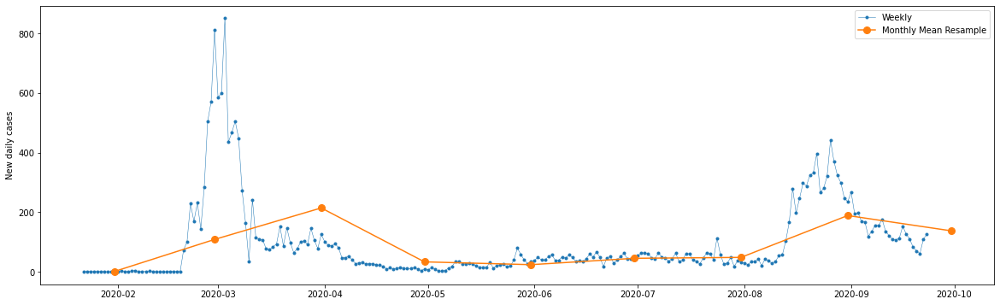

In [188]:
y = df_sk['new_cases']
fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(y,marker='.', linestyle='-', linewidth=0.5, label='Weekly')
ax.plot(y.resample('M').mean(),marker='o', markersize=8, linestyle='-', label='Monthly Mean Resample')
ax.set_ylabel('New daily cases')
ax.legend();

### Decompose the Data 

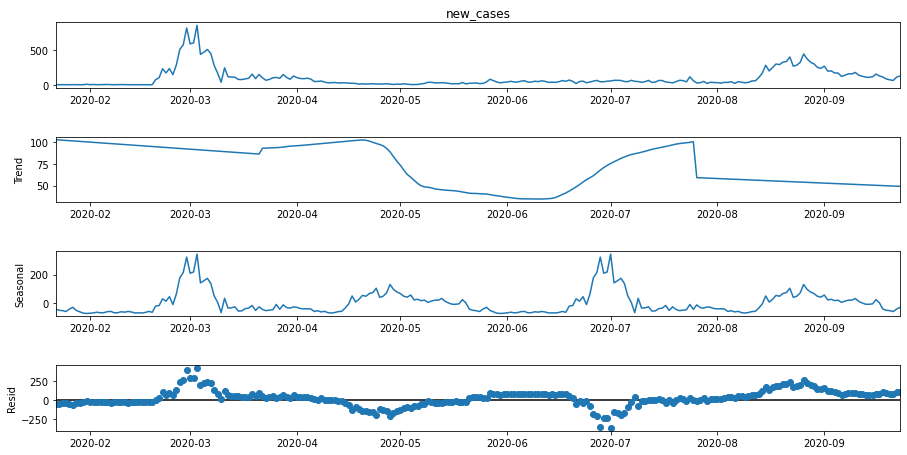

In [189]:
# graphs to show seasonal_decompose
def seasonal_decompose (y):
    decomposition = sm.tsa.seasonal_decompose(y, period = 120, model='additive',extrapolate_trend='freq')
    fig = decomposition.plot()
    fig.set_size_inches(14,7)
    plt.show()

seasonal_decompose(y)

### Check for Stationarity: Augmented Dickey-Fuller Test

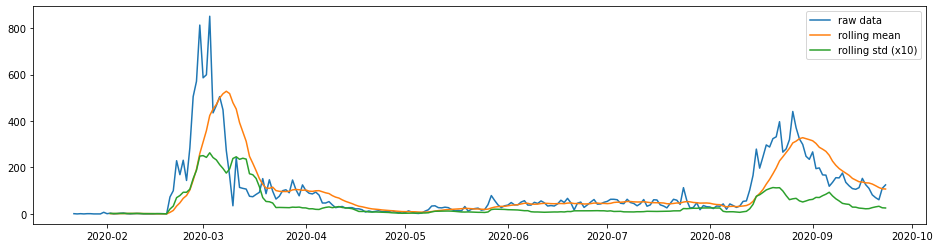

In [190]:
### plot for Rolling Statistic for testing Stationarity
def test_stationarity(timeseries, title):
    
    rolmean = pd.Series(timeseries).rolling(window=12).mean() 
    rolstd = pd.Series(timeseries).rolling(window=12).std()
    
    fig, ax = plt.subplots(figsize=(16, 4))
    ax.plot(timeseries, label= title)
    ax.plot(rolmean, label='rolling mean');
    ax.plot(rolstd, label='rolling std (x10)');
    ax.legend()

pd.options.display.float_format = '{:.8f}'.format
test_stationarity(y,'raw data')

In [191]:
ADF_test(y,'raw data')

 > Is the raw data stationary ?
Test statistic = -2.800
P-value = 0.058
Critical values :
	1%: -3.4586084859607156 - The data is not stationary with 99% confidence
	5%: -2.873972159235721 - The data is not stationary with 95% confidence
	10%: -2.57339565928848 - The data is  stationary with 90% confidence


### Making Data Stationary

 > Is the de-trended data stationary ?
Test statistic = -7.224
P-value = 0.000
Critical values :
	1%: -3.4586084859607156 - The data is  stationary with 99% confidence
	5%: -2.873972159235721 - The data is  stationary with 95% confidence
	10%: -2.57339565928848 - The data is  stationary with 90% confidence


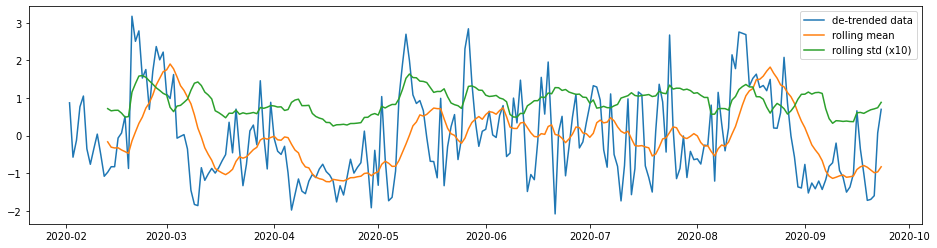

In [192]:
# Detrending
y_detrend =  (y - y.rolling(window=12).mean())/y.rolling(window=12).std()

test_stationarity(y_detrend,'de-trended data')
ADF_test(y_detrend,'de-trended data')

### Create Training & Testing Datasets

In [193]:
# Starting to train data from Feb 25
y_to_train = y['2020-02-25':'2020-08-01'] # dataset to train
y_to_val = y['2020-08-02':] # last X months for test  
predict_date = len(y['2020-08-02':]) # the number of data points for the test set
no_train = len(y['2020-02-25':'2020-08-01']) # the number of data points for the train set 
print(no_train)
print(predict_date)
# 75-25 train-test split

159
53


<a id="Southsarima"></a>
### Time Series Model #1: SARIMA
[▲ Return to contents](#Contents)

### Naive Analysis 

In [194]:
sarima_grid_search(y,30)

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

The set of parameters with the minimum AIC is: SARIMA(0, 1, 1)x(0, 1, 1, 30) - AIC:1930.5604468775355


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.2544      0.045     -5.641      0.000      -0.343      -0.166
ma.S.L30      -1.3644      0.130    -10.477      0.000      -1.620      -1.109
sigma2      1101.0276    160.787      6.848      0.000     785.892    1416.164


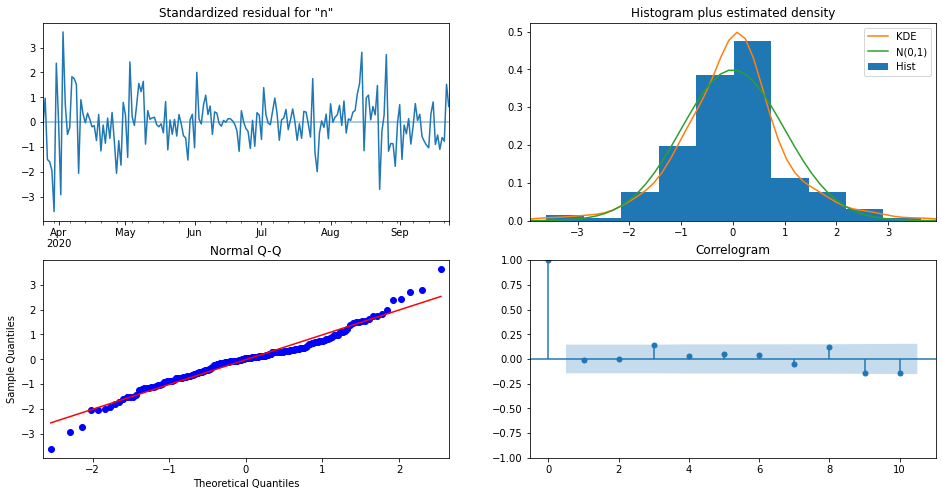

The Root Mean Squared Error of SARIMA with season_length=30 and dynamic = False 46.23


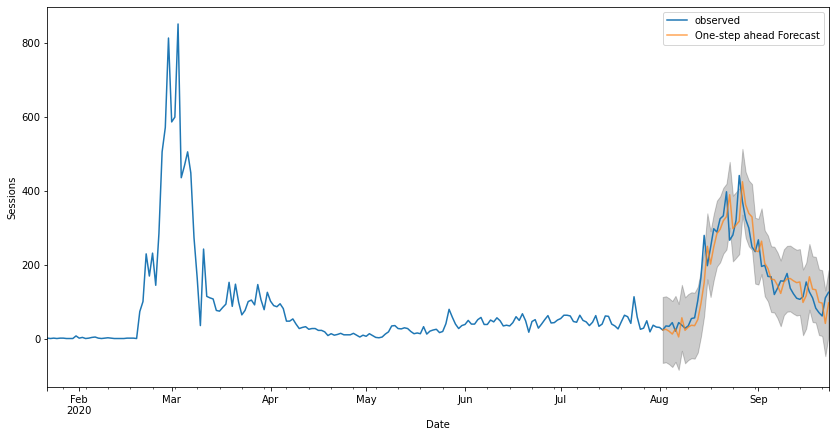

The Root Mean Squared Error of SARIMA with season_length=30 and dynamic = True 208.84


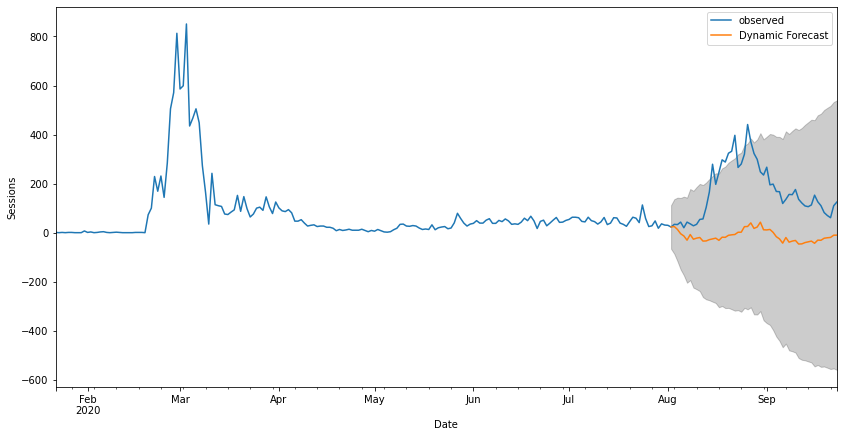

In [195]:
pred_date = '2020-08-02' # pred_date indicates from which date we start computing the dynamic forecasts: 2020-08-02
seasonal_period = 30
model = sarima_eva2(y,(0,1,1),(0,1,1,30),seasonal_period,pred_date,y_to_val, RMSE2)

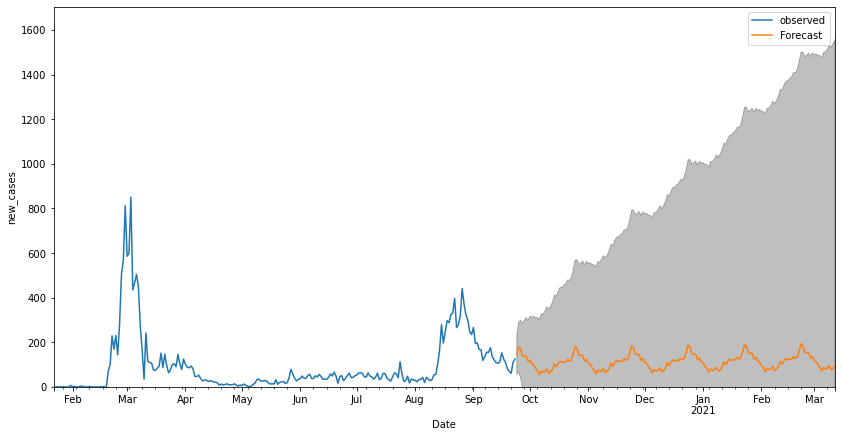

,Date,Predicted_Mean,Lower Bound,Upper Bound
0,2020-09-24,145.06689147,56.19037900,233.94340393
1,2020-09-25,178.37776781,67.51446411,289.24107152
2,2020-09-26,170.03299913,40.87298761,299.19301066
3,2020-09-27,140.63989411,-4.52878380,285.80857202
4,2020-09-28,138.20271505,-21.37667433,297.78210443


In [196]:
final_table = forecast(model,170,y)
final_table.head()

### Advnaced Analysis 

In [197]:
# Starting to train data from the beginning until the day when close contact tracing policy was enacted
# After SK reported its first covid-19 case on Januray 20, they quickly implemented large scale testing and contact tracing
# We couldn't find the exact date of when contact tracing was implemented by the government 
# https://www.loc.gov/law/foreign-news/article/south-korea-parliament-responded-quickly-to-covid-19-by-amending-three-acts/
# From the above article, SK started implemented Infectious Disease Control and Prevention Act 
# The provisions took effect on April 5, 2020
# We train our model from Jan 20 to Apr 5 and make a forecast until October to see what the case count could look like if the policy was not implemented
# Then we are going to compare it with the actual case count with the policy implemented 

y_to_train2 = y[:'2020-03-30'] # dataset to train
y_to_val2 = y['2020-03-30':'2020-04-05'] # last X months for test  
predict_date2 = len(y['2020-03-30':'2020-04-05']) # the number of data points for the test set
no_train2 = len(y[:'2020-03-30']) # the number of data points for the train set 
print(no_train2)
print(predict_date2)
# 75-25 train-test split

69
7


In [198]:
sarima_grid_search(y[:'2020-04-05'],10)

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

The set of parameters with the minimum AIC is: SARIMA(0, 1, 1)x(0, 1, 1, 10) - AIC:645.5536931094988


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.2076      0.090     -2.314      0.021      -0.383      -0.032
ma.S.L10      -1.0000      0.149     -6.710      0.000      -1.292      -0.708
sigma2      1.011e+04   1.47e-05   6.86e+08      0.000    1.01e+04    1.01e+04


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


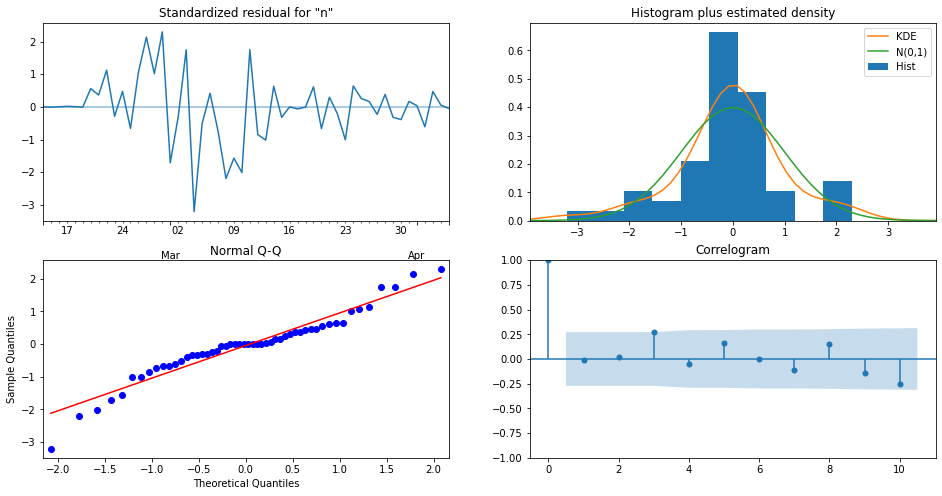

The Root Mean Squared Error of SARIMA with season_length=10 and dynamic = False 36.1


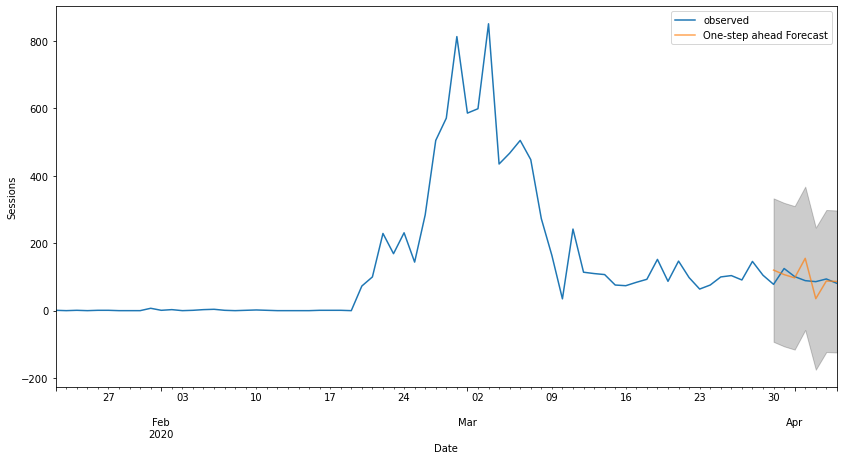

The Root Mean Squared Error of SARIMA with season_length=10 and dynamic = True 39.27


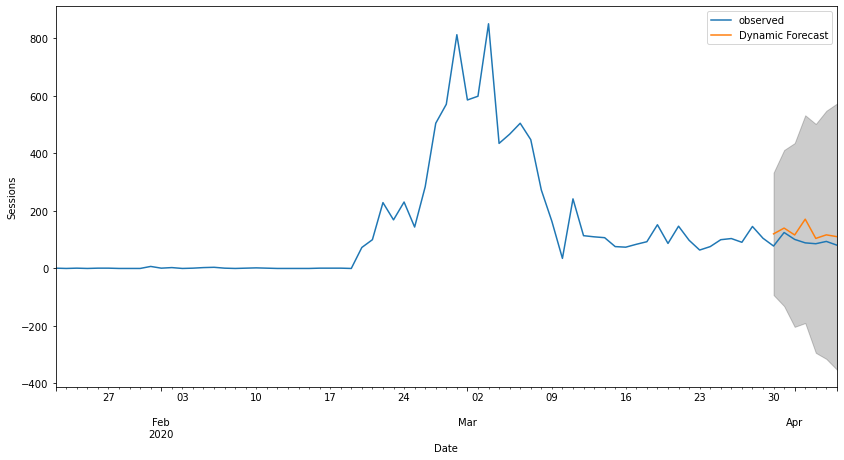

In [199]:
model = sarima_eva(y[:'2020-04-05'],(0, 1, 1),(0, 1, 1, 10),10,'2020-03-30',y_to_val2)

In [200]:
def forecast2(model,predict_steps,y, y_tot):
    
    pred_uc = model.get_forecast(steps=predict_steps)

    #SARIMAXResults.conf_int, can change alpha,the default alpha = .05 returns a 95% confidence interval.
    pred_ci = pred_uc.conf_int()

    ax = y_tot.plot(label='observed', figsize=(14, 7))
#     print(pred_uc.predicted_mean)
    pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.25)
    ax.set_xlabel('Date')
    ax.set_ylabel(y.name)
    plt.ylim(bottom=-50, top=1000)
    plt.legend()
    plt.show()
    
    # Produce the forcasted tables 
    pm = pred_uc.predicted_mean.reset_index()
    pm.columns = ['Date','Predicted_Mean']
    pci = pred_ci.reset_index()
    pci.columns = ['Date','Lower Bound','Upper Bound']
    final_table = pm.join(pci.set_index('Date'), on='Date')
    
    return (final_table)

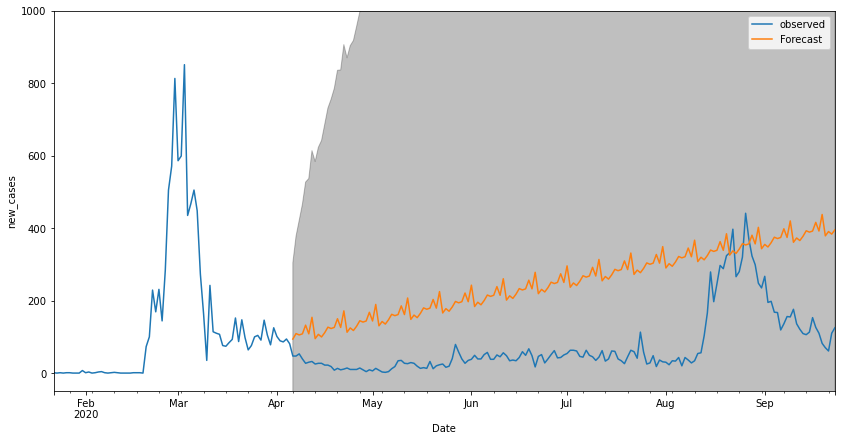

,Date,Predicted_Mean,Lower Bound,Upper Bound
0,2020-04-06,93.84118709,-116.80862827,304.49100244
1,2020-04-07,108.97386737,-159.79338396,377.74111870
2,2020-04-08,105.26509304,-211.11767053,421.64785661
3,2020-04-09,108.26587134,-249.44947742,465.98122010
4,2020-04-10,132.24383201,-262.49969735,526.98736137


In [201]:
final_table2 = forecast2(model,171,y[:'2020-04-05'],y)
final_table2.head()

<a id="Southses"></a>
### Time Series Model #2: Simple Exponential Smoothing (SES) 
[▲ Return to contents](#Contents)

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\holtwinters\model.py:429: FutureWarning: After 0.13 initialization must be handled at model creation
  FutureWarning,
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\holtwinters\model.py:429: FutureWarning: After 0.13 initialization must be handled at model creation
  FutureWarning,


The Root Mean Squared Error of our forecasts with smoothing level of 0.8 is 176.68
The Root Mean Squared Error of our forecasts with auto optimization is 176.63


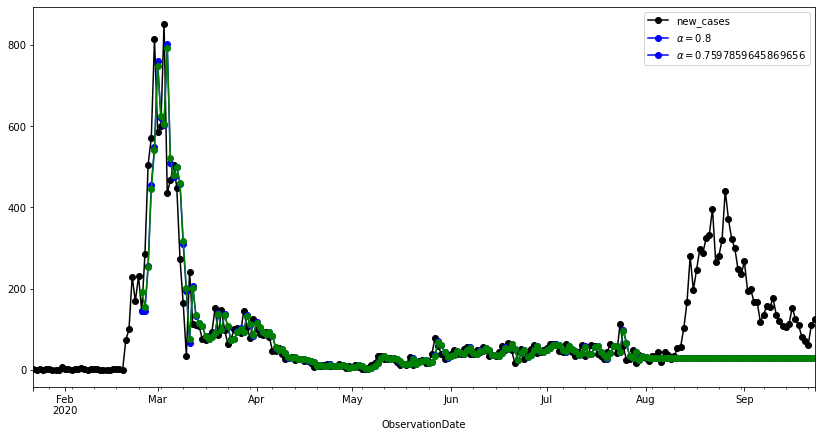

In [202]:
ses2(y, y_to_train,y_to_val,0.8,predict_date, RMSE2)

<a id="Southwinters"></a>
### Time Series Model #3: Holt Winters' Seasonal Method
[▲ Return to contents](#Contents)

In [203]:
from statsmodels.tsa.api import ExponentialSmoothing

def holt_win_sea(y,y_to_train,y_to_test,seasonal_type,seasonal_period,predict_date):
    
    y.plot(marker='o', color='black', legend=True, figsize=(14, 7))
    
    if seasonal_type == 'additive':
        fit1 = ExponentialSmoothing(y_to_train, seasonal_periods = seasonal_period, trend='add', seasonal='add').fit(use_boxcox=True)
        fcast1 = fit1.forecast(predict_date).rename('Additive')
        mse1 = ((fcast1 - y_to_test) ** 2).mean()
        print('The Root Mean Squared Error of additive trend, additive seasonal of '+ 
              'period season_length={} and a Box-Cox transformation {}'.format(seasonal_period,round(np.sqrt(mse1), 2)))
        
        fit2 = ExponentialSmoothing(y_to_train, seasonal_periods = seasonal_period, trend='add', seasonal='add', damped=True).fit(use_boxcox=True)
        fcast2 = fit2.forecast(predict_date).rename('Additive+damped')
        mse2 = ((fcast2 - y_to_test) ** 2).mean()
        print('The Root Mean Squared Error of additive damped trend, additive seasonal of '+ 
              'period season_length={} and a Box-Cox transformation {}'.format(seasonal_period,round(np.sqrt(mse2), 2)))
        
        fit1.fittedvalues.plot(style='--', color='red')
        fcast1.plot(style='--', marker='o', color='red', legend=True)
        fit2.fittedvalues.plot(style='--', color='green')
        fcast2.plot(style='--', marker='o', color='green', legend=True)
    
    elif seasonal_type == 'multiplicative':  
        fit3 = ExponentialSmoothing(y_to_train, seasonal_periods = seasonal_period, trend='add', seasonal='mul').fit(use_boxcox=True)
        fcast3 = fit3.forecast(predict_date).rename('Multiplicative')
        mse3 = ((fcast3 - y_to_test) ** 2).mean()
        print('The Root Mean Squared Error of additive trend, multiplicative seasonal of '+ 
              'period season_length={} and a Box-Cox transformation {}'.format(seasonal_period,round(np.sqrt(mse3), 2)))
        
        fit4 = ExponentialSmoothing(y_to_train, seasonal_periods = seasonal_period, trend='add', seasonal='mul', damped=True).fit(use_boxcox=True)
        fcast4 = fit4.forecast(predict_date).rename('Multiplicative+damped')
        mse4 = ((fcast3 - y_to_test) ** 2).mean()
        print('The Root Mean Squared Error of additive damped trend, multiplicative seasonal of '+ 
              'period season_length={} and a Box-Cox transformation {}'.format(seasonal_period,round(np.sqrt(mse4), 2)))
        RMSE2['holt-winters'] = round(np.sqrt(mse4), 2)
        fit3.fittedvalues.plot(style='--', color='red')
        fcast3.plot(style='--', marker='o', color='red', legend=True)
        fit4.fittedvalues.plot(style='--', color='green')
        fcast4.plot(style='--', marker='o', color='green', legend=True)
        
    else:
        print('Wrong Seasonal Type. Please choose between additive and multiplicative')

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\holtwinters\model.py:429: FutureWarning: After 0.13 initialization must be handled at model creation
  FutureWarning,
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1116: FutureWarning: Setting use_boxcox during fit has been deprecated and will be removed after 0.13. It must be set during model initialization.
  FutureWarning


The Root Mean Squared Error of additive trend, multiplicative seasonal of period season_length=30 and a Box-Cox transformation 187.2


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\ipykernel_launcher.py:32: FutureWarning: the 'damped'' keyword is deprecated, use 'damped_trend' instead
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


The Root Mean Squared Error of additive damped trend, multiplicative seasonal of period season_length=30 and a Box-Cox transformation 187.2


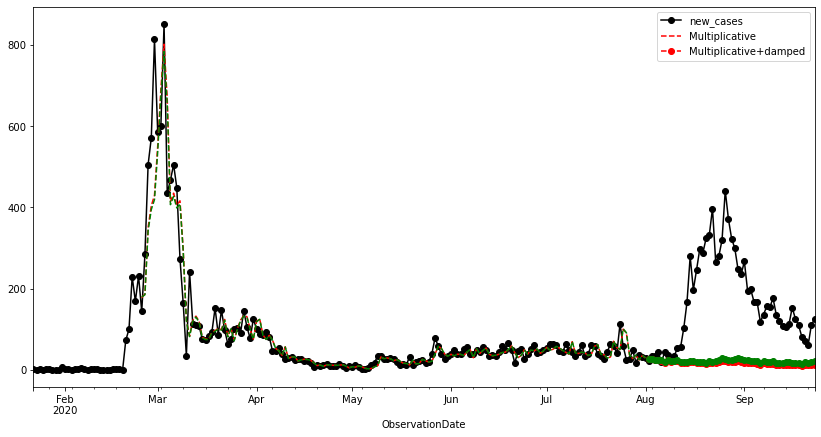

In [204]:
holt_win_sea(y, y_to_train,y_to_val,'multiplicative',30, predict_date)

<a id="Southarima"></a>
### Time Series Model #4: ARIMA
[▲ Return to contents](#Contents)

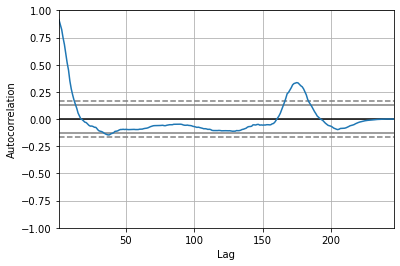

In [205]:
autocorrelation_plot(y)
plt.show()

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                               SARIMAX Results                                
Dep. Variable:              new_cases   No. Observations:                  246
Model:                 ARIMA(5, 1, 0)   Log Likelihood               -1315.393
Date:                Mon, 14 Dec 2020   AIC                           2642.786
Time:                        03:25:28   BIC                           2663.793
Sample:                    01-22-2020   HQIC                          2651.246
                         - 09-23-2020                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2444      0.030     -8.058      0.000      -0.304      -0.185
ar.L2         -0.0421      0.032     -1.315      0.189      -0.105       0.021
ar.L3          0.1754      0.027      6.406      0.0

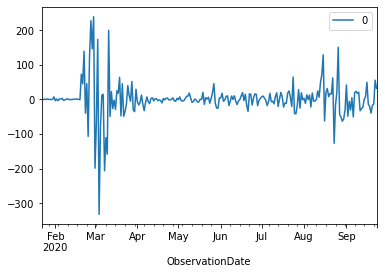

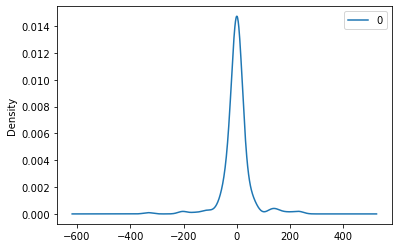

                  0
count  246.00000000
mean     0.50888343
std     51.90908107
min   -332.30231445
25%    -11.51813774
50%     -0.34107251
75%     11.41316284
max    238.86543722


In [206]:
p = (5, 1, 0)
# fit model
model = ARIMA(y, order=p)
model_fit = model.fit()
print(model_fit.summary())
# plot residual errors
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
plt.show()
residuals.plot(kind='kde')
plt.show()
print(residuals.describe())

Test MSE: 47.466


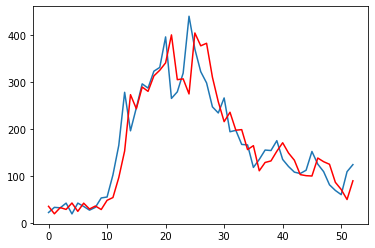

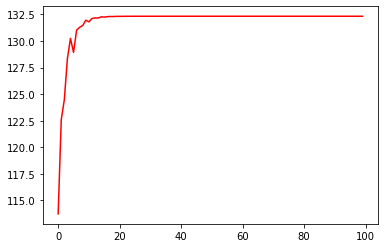

In [207]:
train, test = y_to_train.values, y_to_val.values
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=p)
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)
    #print('predicted=%f, expected=%f' % (yhat, obs))
error = mean_squared_error(test, predictions, squared=False)
RMSE2['arima'] = round(error, 2)
print('Test MSE: %.3f' % error)
# plot
plt.plot(test)
plt.plot(predictions, color='red')
plt.show()


model = ARIMA(y.values, order=p)
model_fit = model.fit()
output = model_fit.forecast(steps=100)
    

plt.plot(output, color='red')
plt.show()

<a id="Southchoose"></a>
## Choosing a time series model
[▲ Return to contents](#Contents)

In [208]:
RMSE2

{'sarima': 46.23,
 'sarima_dynamic': 208.84,
 'ses': 176.63,
 'holt-winters': 187.2,
 'arima': 47.47}

In [209]:
rmse_sort2 = dict(sorted(RMSE2.items(), key=operator.itemgetter(1)))

In [210]:
rmse_sort2

{'sarima': 46.23,
 'arima': 47.47,
 'ses': 176.63,
 'holt-winters': 187.2,
 'sarima_dynamic': 208.84}

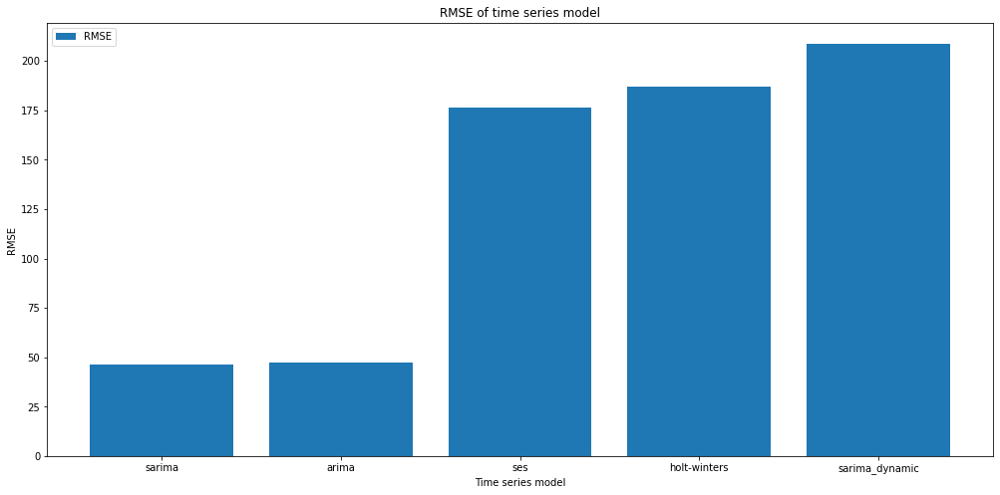

In [211]:
plt.figure(figsize=(17,8))
plt.bar(rmse_sort2.keys(), rmse_sort2.values(), label="RMSE")
plt.legend()
plt.title("RMSE of time series model")
plt.ylabel("RMSE")
plt.xlabel("Time series model")
plt.xticks()
plt.show();

<a id="Southdeath"></a>
## Modeling for death count 
[▲ Return to contents](#Contents)

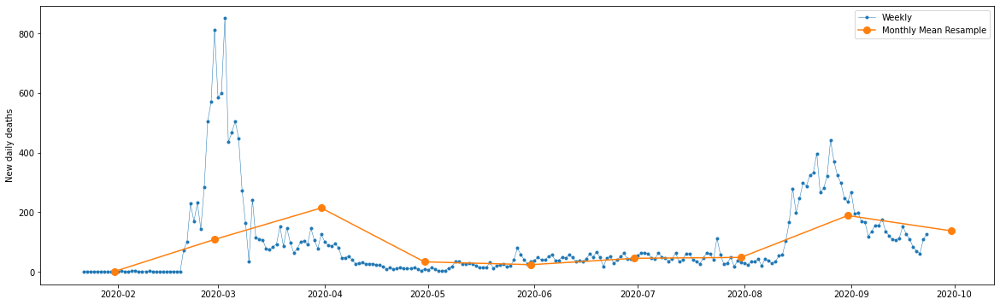

In [212]:
y2 = df_sk['new_deaths']
fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(y,marker='.', linestyle='-', linewidth=0.5, label='Weekly')
ax.plot(y.resample('M').mean(),marker='o', markersize=8, linestyle='-', label='Monthly Mean Resample')
ax.set_ylabel('New daily deaths')
ax.legend();

### Decompose the Data 

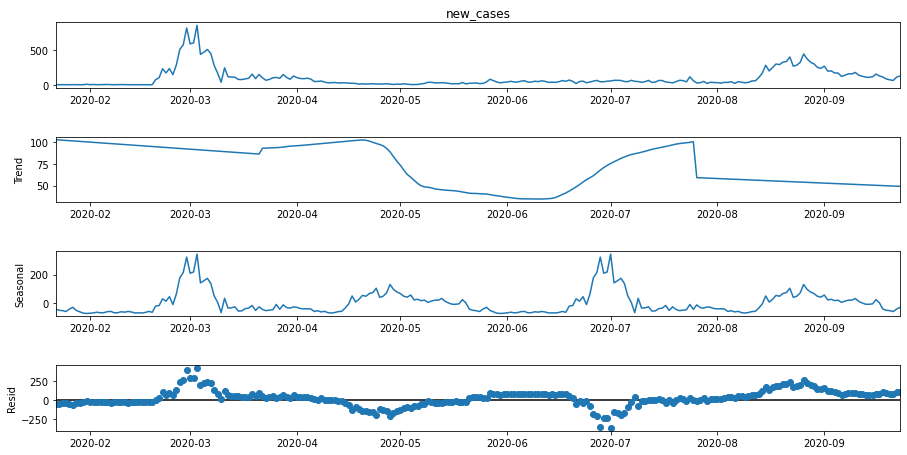

In [213]:
# graphs to show seasonal_decompose
def seasonal_decompose (y2):
    decomposition = sm.tsa.seasonal_decompose(y, period = 120, model='additive',extrapolate_trend='freq')
    fig = decomposition.plot()
    fig.set_size_inches(14,7)
    plt.show()

seasonal_decompose(y2)

### Check for Stationarity: Augmented Dickey-Fuller Test

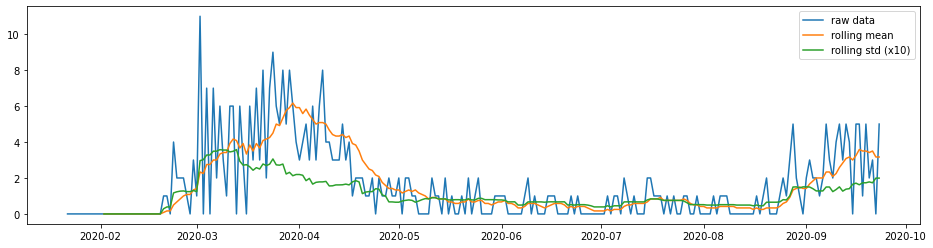

In [214]:
### plot for Rolling Statistic for testing Stationarity
def test_stationarity(timeseries, title):
    
    rolmean = pd.Series(timeseries).rolling(window=12).mean() 
    rolstd = pd.Series(timeseries).rolling(window=12).std()
    
    fig, ax = plt.subplots(figsize=(16, 4))
    ax.plot(timeseries, label= title)
    ax.plot(rolmean, label='rolling mean');
    ax.plot(rolstd, label='rolling std (x10)');
    ax.legend()

pd.options.display.float_format = '{:.8f}'.format
test_stationarity(y2,'raw data')

In [215]:
ADF_test(y2,'raw data')

 > Is the raw data stationary ?
Test statistic = -1.845
P-value = 0.358
Critical values :
	1%: -3.4589796764641 - The data is not stationary with 99% confidence
	5%: -2.8741347158661448 - The data is not stationary with 95% confidence
	10%: -2.573482381701992 - The data is not stationary with 90% confidence


### Making Data Stationary

 > Is the de-trended data stationary ?
Test statistic = -6.730
P-value = 0.000
Critical values :
	1%: -3.461429147102264 - The data is  stationary with 99% confidence
	5%: -2.875206950587861 - The data is  stationary with 95% confidence
	10%: -2.5740544497344002 - The data is  stationary with 90% confidence


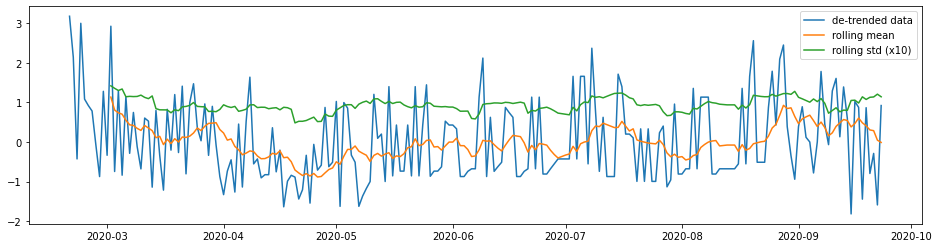

In [216]:
# Detrending
y2_detrend =  (y2 - y2.rolling(window=12).mean())/y2.rolling(window=12).std()

test_stationarity(y2_detrend,'de-trended data')
ADF_test(y2_detrend,'de-trended data')

### Create Training & Testing Datasets

In [217]:
# Starting to train data from Feb 25
y2_to_train = y2['2020-02-25':'2020-08-01'] # dataset to train
y2_to_val = y2['2020-08-02':] # last X months for test  
predict_date = len(y2['2020-08-02':]) # the number of data points for the test set
no_train = len(y2['2020-02-25':'2020-08-01']) # the number of data points for the train set 
print(no_train)
print(predict_date)
# 75-25 train-test split

159
53


<a id="Southsarima2"></a>
### Time Series Model #1: SARIMA
[▲ Return to contents](#Contents)

In [218]:
sarima_grid_search(y2,30)

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

The set of parameters with the minimum AIC is: SARIMA(1, 1, 1)x(0, 1, 1, 30) - AIC:676.3990416535931


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2419      0.105     -2.303      0.021      -0.448      -0.036
ma.L1         -0.6297      0.077     -8.126      0.000      -0.782      -0.478
ma.S.L30      -1.3363      0.180     -7.415      0.000      -1.690      -0.983
sigma2         1.1917      0.250      4.768      0.000       0.702       1.682


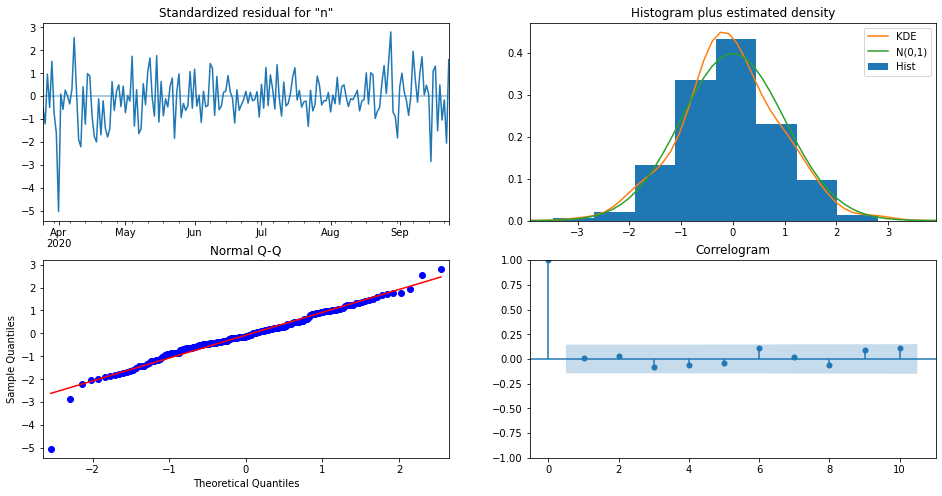

The Root Mean Squared Error of SARIMA with season_length=30 and dynamic = False 1.5


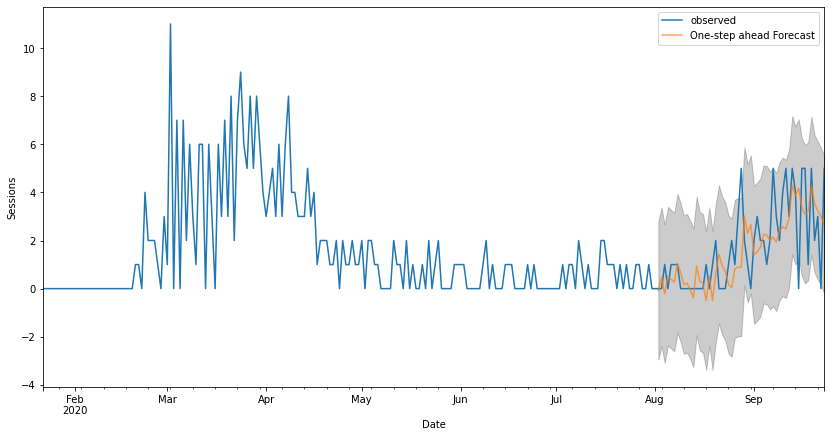

The Root Mean Squared Error of SARIMA with season_length=30 and dynamic = True 2.51


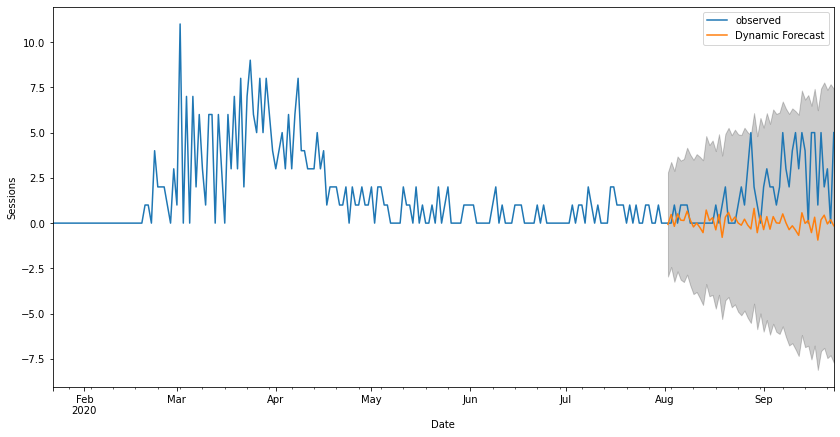

In [219]:
pred_date = '2020-08-02' # pred_date indicates from which date we start computing the dynamic forecasts: 2020-08-02
seasonal_period = 30
model = sarima_eva(y2,(1,1,1),(0,1,1,30),seasonal_period,pred_date,y2_to_val)

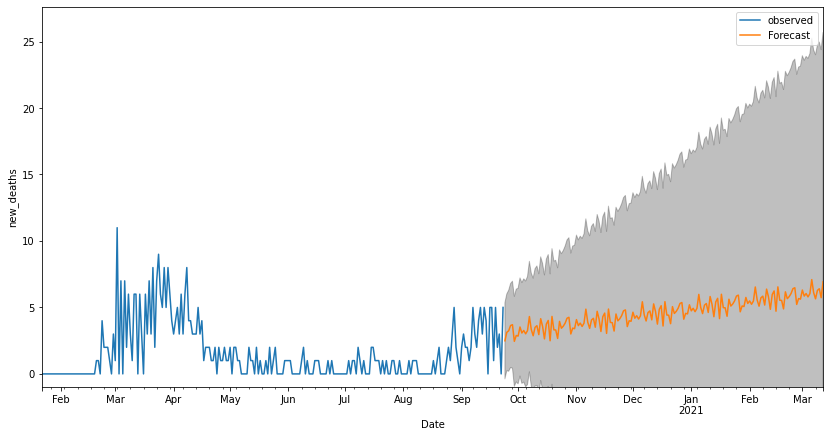

,Date,Predicted_Mean,Lower Bound,Upper Bound
0,2020-09-24,2.49141368,-0.37389098,5.35671834
1,2020-09-25,3.12905100,0.24022641,6.01787558
2,2020-09-26,3.24530586,0.19734386,6.29326785
3,2020-09-27,3.63837947,0.48050487,6.79625406
4,2020-09-28,3.70142828,0.42822075,6.97463581


In [220]:
final_table = forecast(model,170,y2)
final_table.head()

In [221]:
y2_to_train2 = y[:'2020-03-15'] # dataset to train
y2_to_val2 = y['2020-03-16':'2020-04-05'] # last X months for test  
predict_date2 = len(y['2020-03-16':'2020-04-05']) # the number of data points for the test set
no_train2 = len(y[:'2020-03-15']) # the number of data points for the train set 
print(no_train2)
print(predict_date2)

54
21


In [222]:
sarima_grid_search(y2[:'2020-03-16'],2)

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

The set of parameters with the minimum AIC is: SARIMA(1, 1, 1)x(0, 1, 1, 2) - AIC:211.3144988101888


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2328      0.143     -1.632      0.103      -0.513       0.047
ma.L1         -1.0000    292.863     -0.003      0.997    -575.000     573.000
ma.S.L2       -0.5622      0.145     -3.879      0.000      -0.846      -0.278
sigma2         4.2232   1236.989      0.003      0.997   -2420.231    2428.678


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


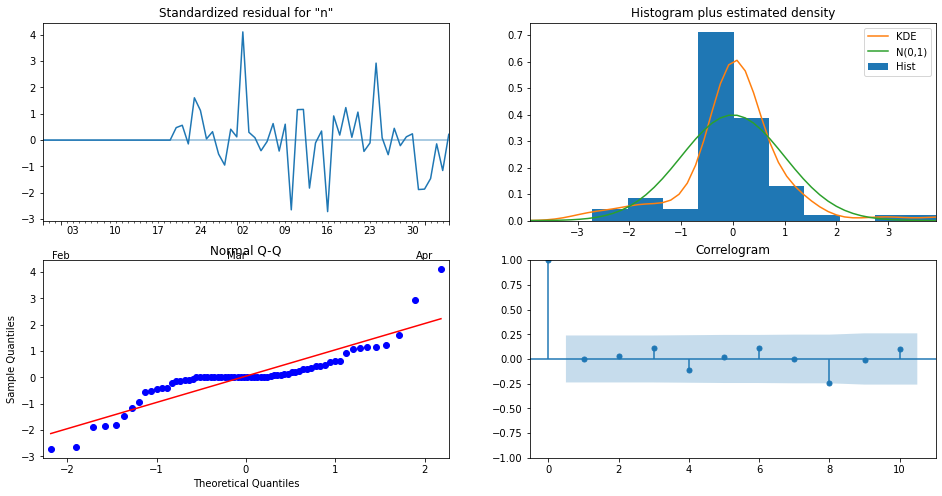

The Root Mean Squared Error of SARIMA with season_length=2 and dynamic = False 96.36


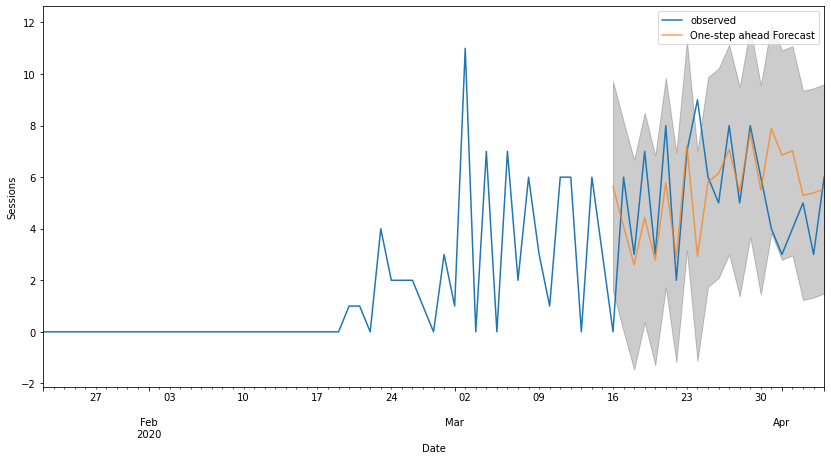

The Root Mean Squared Error of SARIMA with season_length=2 and dynamic = True 96.75


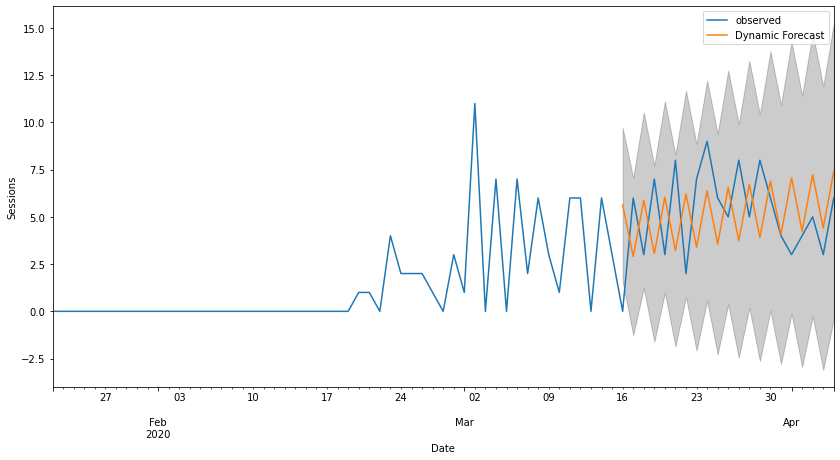

In [223]:
model = sarima_eva(y2[:'2020-04-05'],(1, 1, 1),(0, 1, 1, 2),2,'2020-03-16',y2_to_val2)

In [224]:
def forecast2(model,predict_steps,y, y_tot):
    
    pred_uc = model.get_forecast(steps=predict_steps)

    #SARIMAXResults.conf_int, can change alpha,the default alpha = .05 returns a 95% confidence interval.
    pred_ci = pred_uc.conf_int()

    ax = y_tot.plot(label='observed', figsize=(14, 7))
#     print(pred_uc.predicted_mean)
    pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.25)
    ax.set_xlabel('Date')
    ax.set_ylabel(y.name)
    plt.ylim(bottom=-50, top=100)
    plt.legend()
    plt.show()
    
    # Produce the forcasted tables 
    pm = pred_uc.predicted_mean.reset_index()
    pm.columns = ['Date','Predicted_Mean']
    pci = pred_ci.reset_index()
    pci.columns = ['Date','Lower Bound','Upper Bound']
    final_table = pm.join(pci.set_index('Date'), on='Date')
    
    return (final_table)

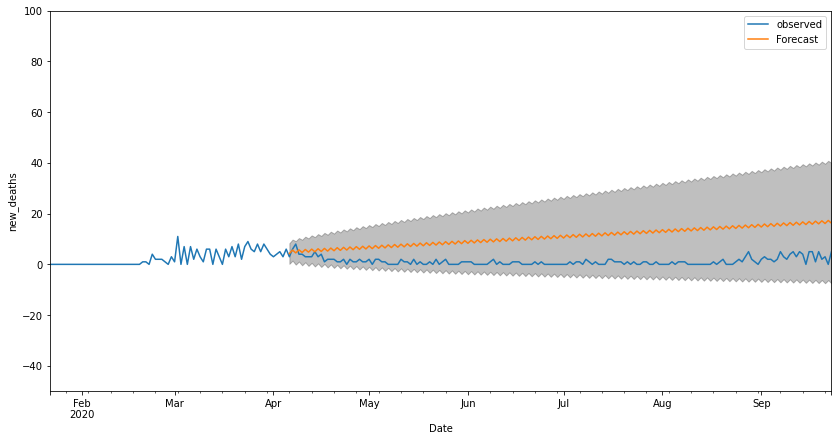

,Date,Predicted_Mean,Lower Bound,Upper Bound
0,2020-04-06,4.26549836,0.20765584,8.32334089
1,2020-04-07,5.62440966,1.47159665,9.77722268
2,2020-04-08,4.52485153,-0.10286739,9.15257045
3,2020-04-09,5.73591735,1.09243520,10.37939950
4,2020-04-10,4.67078478,-0.36636815,9.70793772


In [225]:
final_table2 = forecast2(model,171,y2[:'2020-04-05'],y2)
final_table2.head()

<a id="India"></a>

# INDIA
[▲ Return to contents](#Contents)

<a id="Indiaclean"></a>

## Data Cleaning
[▲ Return to contents](#Contents)

In [226]:
df_india = pd.read_csv("Data/India/covid_19_india.csv")

In [227]:
df_india.head(10)

,Sno,Date,Time,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed
0,1,30/01/20,6:00 PM,Kerala,1,0,0,0,1
1,2,31/01/20,6:00 PM,Kerala,1,0,0,0,1
2,3,01/02/20,6:00 PM,Kerala,2,0,0,0,2
3,4,02/02/20,6:00 PM,Kerala,3,0,0,0,3
4,5,03/02/20,6:00 PM,Kerala,3,0,0,0,3
5,6,04/02/20,6:00 PM,Kerala,3,0,0,0,3
6,7,05/02/20,6:00 PM,Kerala,3,0,0,0,3
7,8,06/02/20,6:00 PM,Kerala,3,0,0,0,3
8,9,07/02/20,6:00 PM,Kerala,3,0,0,0,3
9,10,08/02/20,6:00 PM,Kerala,3,0,0,0,3


In [228]:
# India has 36 States and UTs - https://en.wikipedia.org/wiki/States_and_union_territories_of_India
# This dataset has a lot more regions, and some of which are nonsensical and others which need to be merged
df_india["State/UnionTerritory"].unique()

array(['Kerala', 'Telengana', 'Delhi', 'Rajasthan', 'Uttar Pradesh',
       'Haryana', 'Ladakh', 'Tamil Nadu', 'Karnataka', 'Maharashtra',
       'Punjab', 'Jammu and Kashmir', 'Andhra Pradesh', 'Uttarakhand',
       'Odisha', 'Puducherry', 'West Bengal', 'Chhattisgarh',
       'Chandigarh', 'Gujarat', 'Himachal Pradesh', 'Madhya Pradesh',
       'Bihar', 'Manipur', 'Mizoram', 'Andaman and Nicobar Islands',
       'Goa', 'Unassigned', 'Assam', 'Jharkhand', 'Arunachal Pradesh',
       'Tripura', 'Nagaland', 'Meghalaya', 'Dadar Nagar Haveli',
       'Cases being reassigned to states', 'Sikkim', 'Daman & Diu',
       'Dadra and Nagar Haveli and Daman and Diu', 'Telangana',
       'Telangana***', 'Telengana***'], dtype=object)

In [229]:
# Fix Telangana entries - map all variants to the same state
df_india.loc[(df_india["State/UnionTerritory"] == 'Telangana***'),'State/UnionTerritory']='Telangana'
df_india.loc[(df_india["State/UnionTerritory"] == 'Telengana***'),'State/UnionTerritory']='Telangana'

# Fix Dadra and Nagar Haveli and Daman and Diu entries - map all variants to the same state
df_india.loc[(df_india["State/UnionTerritory"] == 'Daman & Diu'),'State/UnionTerritory']='Dadra and Nagar Haveli and Daman and Diu'
df_india.loc[(df_india["State/UnionTerritory"] == 'Dadar Nagar Haveli'),'State/UnionTerritory']='Dadra and Nagar Haveli and Daman and Diu'

# Remove entries that are nonsensical - unassigned or being reassigned
df_india = df_india[df_india["State/UnionTerritory"] != "Cases being reassigned to states"]
df_india = df_india[df_india["State/UnionTerritory"] != "Unassigned"]

In [230]:
# Count of regions after preprocessing - checks out
print("post pre-processing state/ut count:", len(df_india["State/UnionTerritory"].unique().tolist()))

post pre-processing state/ut count: 36


In [231]:
# Sort the dataset by date
df_india_sort = df_india.sort_values(by="Date")
unique_dates = df_india["Date"].unique().tolist()

In [232]:
# Create new data frame with date, the confirmed case, death & cured count - these are the only relevant variables
confirmed_count = []
death_count = []
cured_count = []

for date in unique_dates:
    sum_confirmed = df_india_sort[df_india_sort["Date"] == date]["Confirmed"].sum()
    sum_death = df_india_sort[df_india_sort["Date"] == date]["Deaths"].sum()
    sum_cured = df_india_sort[df_india_sort["Date"] == date]["Cured"].sum()
                              
    confirmed_count.append(sum_confirmed)
    death_count.append(sum_death)
    cured_count.append(sum_cured)

d = {'date': unique_dates, 'confirmed': confirmed_count, 'death': death_count, 'cured': cured_count}
df_india_counts = pd.DataFrame(data=d)

# Find new cases, deaths and cured and add it to the counts dataframe
new_cases = [df_india_counts["confirmed"][0]]
new_deaths = [df_india_counts["death"][0]]
new_cured = [df_india_counts["cured"][0]]

for index in range(1, len(df_india_counts)):
    new_cases.append(df_india_counts["confirmed"][index] - df_india_counts["confirmed"][index-1])
    new_deaths.append(df_india_counts["death"][index] - df_india_counts["death"][index-1])
    new_cured.append(df_india_counts["cured"][index] - df_india_counts["cured"][index-1])
    
d = {'date': unique_dates, 'case': confirmed_count, 'death': death_count, 'cured': cured_count, 'new_cases': new_cases, 'new_death': new_deaths, 'new_cured': new_cured}
df_india_counts = pd.DataFrame(data=d)

In [233]:
df_india_counts.head()

,date,case,death,cured,new_cases,new_death,new_cured
0,30/01/20,1,0,0,1,0,0
1,31/01/20,1,0,0,0,0,0
2,01/02/20,2,0,0,1,0,0
3,02/02/20,3,0,0,1,0,0
4,03/02/20,3,0,0,0,0,0


<a id="Indiavisuals"></a>

## Visualizations
[▲ Return to contents](#Contents)

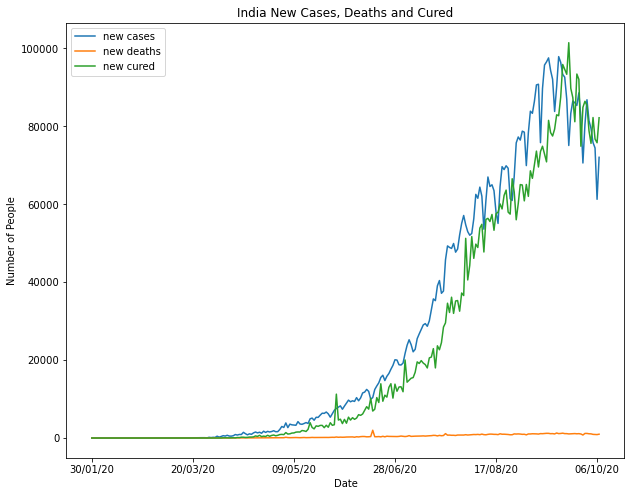

In [234]:
fig, ax = plt.subplots(1,1 , figsize = (10,8))
ax.plot(df_india_counts["date"], df_india_counts["new_cases"], label = "new cases")
ax.plot(df_india_counts["date"], df_india_counts["new_death"], label = "new deaths")
ax.plot(df_india_counts["date"], df_india_counts["new_cured"], label = "new cured")
ax.set_title("India New Cases, Deaths and Cured")
ax.set_ylabel("Number of People")
ax.set_xlabel("Date")
ax.xaxis.set_major_locator(plt.MultipleLocator(50))
ax.legend()
plt.show()

<a id="Indiapoly"></a>

## Polynomial Regression Model
[▲ Return to contents](#Contents)

In [235]:
df_india_counts['Days'] = df_india_counts.index

In [236]:
df_india_counts.head()

,date,case,death,cured,new_cases,new_death,new_cured,Days
0,30/01/20,1,0,0,1,0,0,0
1,31/01/20,1,0,0,0,0,0,1
2,01/02/20,2,0,0,1,0,0,2
3,02/02/20,3,0,0,1,0,0,3
4,03/02/20,3,0,0,0,0,0,4


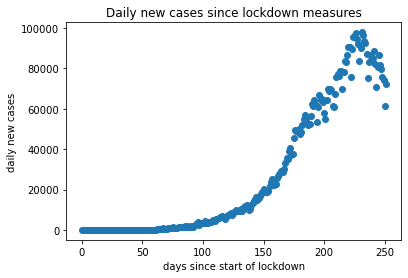

In [237]:
#scatter plot of new cases since start of lockdown measures
x = df_india_counts['Days']
y = df_india_counts['new_cases']

plt.scatter(x, y)

plt.xlabel("days since start of lockdown")
plt.ylabel("daily new cases")
plt.title("Daily new cases since lockdown measures")
plt.show()

In [238]:
#define predictor and response variable
X = df_india_counts[['Days']].values
Y = df_india_counts['new_cases'].values

In [239]:
#split the train data into train and validation sets 
x_train, x_val, y_train, y_val = train_test_split(X,Y, train_size=0.8, random_state=44)

In [240]:
#find the best degree for the polynomial regression
maxdeg = 30
training_error, validation_error = [],[]

for d in range(maxdeg):
    
    x_poly_train = PolynomialFeatures(d).fit_transform(x_train)
    x_poly_val = PolynomialFeatures(d).fit_transform(x_val)
    
    polymodel = LinearRegression()
    polymodel.fit(x_poly_train, y_train)
    
    y_train_pred = polymodel.predict(x_poly_train)
    y_val_pred = polymodel.predict(x_poly_val)
    
    training_error.append(mean_squared_error(y_train, y_train_pred))
    validation_error.append(mean_squared_error(y_val, y_val_pred))

In [241]:
#find best degree based on lowest mse
min_mse_train = min(training_error)

best_degree_train = training_error.index(min_mse_train)

min_mse_val = min(validation_error)

best_degree_val = validation_error.index(min_mse_val)

print("The lowest train MSE is",min_mse_train)

print("The lowest validation MSE is",min_mse_val)

print("The degree of the model that gives the lowest train MSE is",best_degree_train)

print("The degree of the model that gives the lowest validation MSE is",best_degree_val)

The lowest train MSE is 10759755.016886445
The lowest validation MSE is 9543488.253900671
The degree of the model that gives the lowest train MSE is 16
The degree of the model that gives the lowest validation MSE is 17


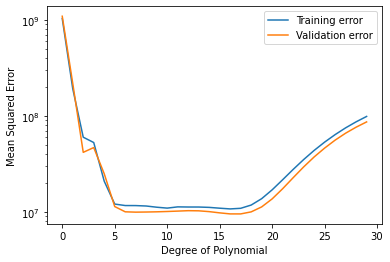

In [242]:
#plot training and validation mse
fig, ax = plt.subplots()

ax.plot(range(maxdeg), training_error, label = 'Training error')

ax.plot(range(maxdeg), validation_error, label = 'Validation error')

ax.set_xlabel('Degree of Polynomial')
ax.set_ylabel('Mean Squared Error')
ax.legend(loc = 'best')
ax.set_yscale('log')
plt.show()

In [243]:
#fit polynomial regression with degree 17
x_train_poly3 = PolynomialFeatures(degree=best_degree_val).fit_transform(X)

polymodel = LinearRegression()
polymodel.fit(x_train_poly3,Y)

y_train_pred3 = polymodel.predict(x_train_poly3)

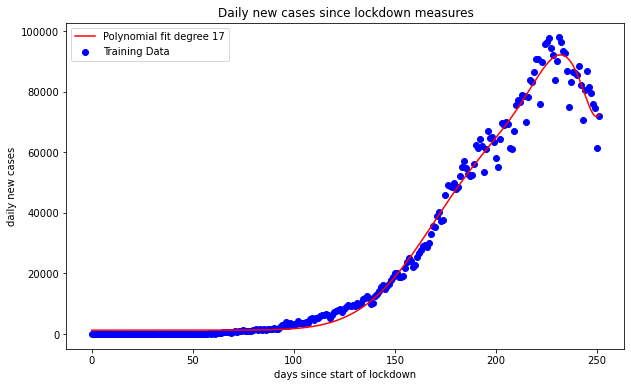

In [244]:
#plot polynomial regression on scatterplot
plt.figure(figsize=(10,6))

idx = np.argsort(X[:,0])
X = X[idx]
y_train_pred3 = y_train_pred3[idx]

plt.scatter(X, Y, c='b', label="Training Data")

# Also plot the polynomial regression fit curve
plt.plot(X, y_train_pred3, c='r', label="Polynomial fit degree 17")

#Assigning labels to the axes
plt.xlabel("days since start of lockdown")
plt.ylabel("daily new cases")
plt.title("Daily new cases since lockdown measures")
plt.legend()
plt.show()

In [245]:
#find the best degree of the polynomial regression by running the model on a range of degree values and using k-fold cross validation. 
maxdeg = 30

cross_training_error, cross_validation_error = [],[]

for d in range(maxdeg):
    
    x_poly_train = PolynomialFeatures(d).fit_transform(X)
    
    polymodel = LinearRegression()
    
    mse_score = cross_validate(polymodel, x_poly_train, Y, cv=10, scoring="neg_mean_squared_error",return_train_score=True)
    
    polymodel.fit(x_poly_train, Y)
    
    y_train_pred = polymodel.predict(x_poly_train)
    
    cross_training_error.append(mean_squared_error(Y, y_train_pred))
    
    cross_validation_error.append(np.mean(-mse_score['test_score']))

In [246]:
min_mse_crosstrain = min(cross_training_error)

best_degree_crosstrain = cross_training_error.index(min_mse_crosstrain)

min_mse_crossval = min(cross_validation_error)

best_degree_crossval = cross_validation_error.index(min_mse_crossval)

print("The lowest train MSE is",min_mse_crosstrain)

print("The lowest cross validation MSE is",min_mse_crossval)

print("The degree of the model that gives the lowest train MSE is",best_degree_crosstrain)

print("The degree of the model that gives the lowest cross validation MSE is",best_degree_crossval)

The lowest train MSE is 10420220.408790844
The lowest cross validation MSE is 48979897.2667148
The degree of the model that gives the lowest train MSE is 16
The degree of the model that gives the lowest cross validation MSE is 5


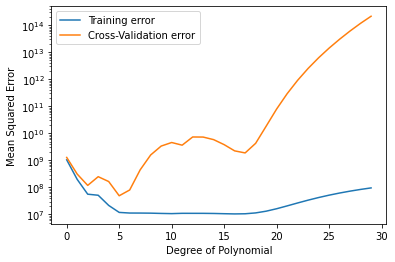

In [247]:
fig, ax = plt.subplots()

ax.plot(range(maxdeg), cross_training_error, label = 'Training error')

ax.plot(range(maxdeg), cross_validation_error, label = 'Cross-Validation error')

ax.set_xlabel('Degree of Polynomial')
ax.set_ylabel('Mean Squared Error')
ax.legend(loc = 'best')
ax.set_yscale('log')
plt.show()

In [248]:
x_train_poly4 = PolynomialFeatures(degree=best_degree_crossval).fit_transform(X)

polymodel4 = LinearRegression()
polymodel4.fit(x_train_poly4,Y)

y_train_pred4 = polymodel4.predict(x_train_poly4)

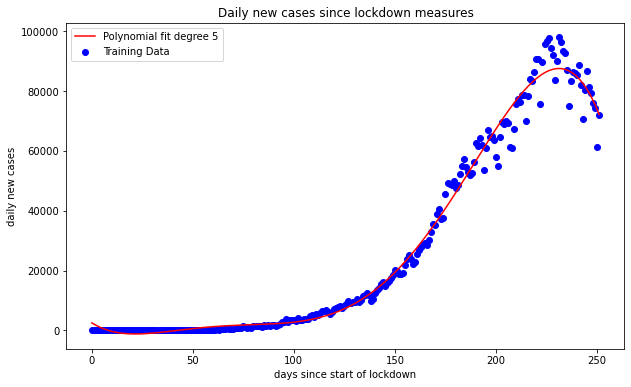

In [249]:
plt.figure(figsize=(10,6))

idx = np.argsort(X[:,0])
X = X[idx]
y_train_pred4 = y_train_pred4[idx]

plt.scatter(X, Y, c='b', label="Training Data")

# Also plot the polynomial regression fit curve
plt.plot(X, y_train_pred4, c='r', label="Polynomial fit degree 5")

#Assigning labels to the axes
plt.xlabel("days since start of lockdown")
plt.ylabel("daily new cases")
plt.title("Daily new cases since lockdown measures")
plt.legend()
plt.show()

In [250]:
#find best degree using k-fold cross validation along with bootstraps
maxdeg5 = 50
numboot = 100

bestdeg = []

for i in range(numboot):
    df_sampled = df_india_counts.sample(frac=1, replace=True)
    
    x_samp = df_sampled[['Days']].values
    y_samp = df_sampled['new_cases'].values
    
    cross_training_error, cross_validation_error = [],[]
    
    for d in range(maxdeg):
        
        x_poly_train = PolynomialFeatures(d).fit_transform(x_samp)
        
        polymodel = LinearRegression()
        
        mse_score = cross_validate(polymodel, x_poly_train, y_samp, cv=10, scoring="neg_mean_squared_error",return_train_score=True)
        
        polymodel.fit(x_poly_train, y_samp)
        
        y_train_pred = polymodel.predict(x_poly_train)
        
        cross_training_error.append(mean_squared_error(y_samp, y_train_pred))
        
        cross_validation_error.append(np.mean(-mse_score['test_score']))
        
    min_mse_crossval = min(cross_validation_error)

    best_degree_crossval = cross_validation_error.index(min_mse_crossval)
    
    bestdeg.append(best_degree_crossval)

In [251]:
best_dict = {i:bestdeg.count(i) for i in bestdeg}
max_deg = max(best_dict.values())
best_deg = [i for i in best_dict.keys() if best_dict[i] == max_deg][0]

print("The degree voted the most times is: " + str(best_deg))

The degree voted the most times is: 16


In [252]:
x_train_poly5 = PolynomialFeatures(degree=best_deg).fit_transform(X)

polymodel5 = LinearRegression()
polymodel5.fit(x_train_poly5,Y)

y_train_pred5 = polymodel5.predict(x_train_poly5)

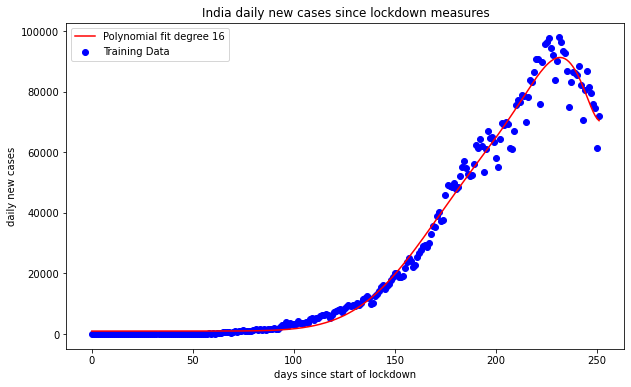

In [253]:
plt.figure(figsize=(10,6))

idx = np.argsort(X[:,0])
X = X[idx]
y_train_pred5 = y_train_pred5[idx]

plt.scatter(X, Y, c='b', label="Training Data")

# Also plot the polynomial regression fit curve
plt.plot(X, y_train_pred5, c='r', label="Polynomial fit degree 16")

#Assigning labels to the axes
plt.xlabel("days since start of lockdown")
plt.ylabel("daily new cases")
plt.title("India daily new cases since lockdown measures")
plt.legend()
plt.savefig('india_model.jpg', dpi=400)

<a id="Indiaprep"></a>

## Time Series Prep
[▲ Return to contents](#Contents)

In [254]:
# add the date as the index of the entries and ensure that all entries are sorted by date

df_india_counts['date'] = pd.to_datetime(df_india_counts['date'], dayfirst = True)
df_india_counts = df_india_counts.set_index('date')
df_india_counts = df_india_counts.sort_index()

df_india_counts.head()

,case,death,cured,new_cases,new_death,new_cured,Days
date,,,,,,,
2020-01-30,1,0,0,1,0,0,0
2020-01-31,1,0,0,0,0,0,1
2020-02-01,2,0,0,1,0,0,2
2020-02-02,3,0,0,1,0,0,3
2020-02-03,3,0,0,0,0,0,4


In [255]:
RMSE4 = {}

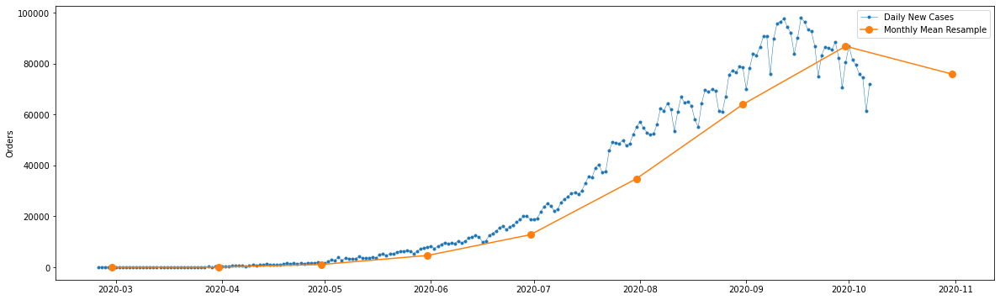

In [256]:
# assign the new case count to y and restrict the entries to only after feb 25 for standardization across countries
y = df_india_counts["new_cases"]
y = y['2020-02-25':]

# plot the number of daily cases and also the mean per month
fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(y,marker='.', linestyle='-', linewidth=0.5, label='Daily New Cases')
ax.plot(y.resample('M').mean(),marker='o', markersize=8, linestyle='-', label='Monthly Mean Resample')
ax.set_ylabel('Orders')
ax.legend();

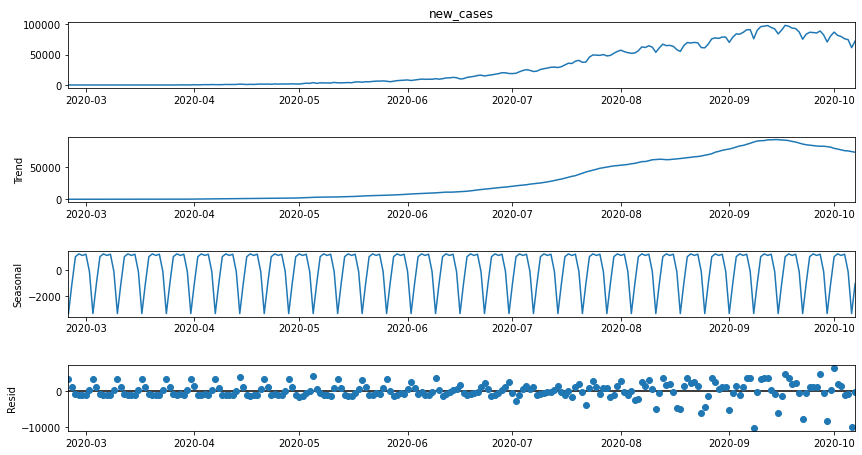

In [257]:
# graphs to show seasonality, trend
# major takeaway - our data does have a rising trend, and the seasonal period is ~8 days

def seasonal_decompose (y):
    decomposition = sm.tsa.seasonal_decompose(y, model='additive',extrapolate_trend='freq')
    fig = decomposition.plot()
    fig.set_size_inches(14,7)
    plt.show()
        
seasonal_decompose(y)

In [258]:
# this graph show the rolling mean to visually test stationarity
# clearly the data is not stationary

def test_stationarity(timeseries, title):
    
    # determing rolling statistics
    rolmean = pd.Series(timeseries).rolling(window=8).mean() 
    rolstd = pd.Series(timeseries).rolling(window=8).std()
    
    fig, ax = plt.subplots(figsize=(16, 4))
    ax.plot(timeseries, label= title)
    ax.plot(rolmean, label='rolling mean');
    ax.plot(rolstd, label='rolling std (x10)');
    ax.legend()

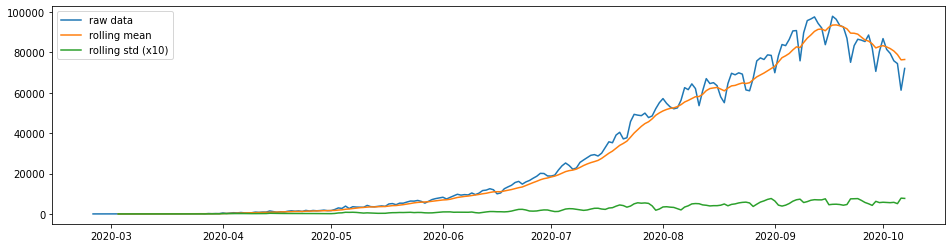

In [259]:
pd.options.display.float_format = '{:.8f}'.format
test_stationarity(y,'raw data')

In [260]:
# ADF test also confirms data is not stationary

def ADF_test(timeseries, dataDesc):
    print(' > Is the {} stationary ?'.format(dataDesc))
    dftest = adfuller(timeseries.dropna(), autolag='AIC')
    print('Test statistic = {:.3f}'.format(dftest[0]))
    print('P-value = {:.3f}'.format(dftest[1]))
    print('Critical values :')
    for k, v in dftest[4].items():
        print('\t{}: {} - The data is {} stationary with {}% confidence'.format(k, v, 'not' if v<dftest[0] else '', 100-int(k[:-1])))

ADF_test(y,'raw data')

 > Is the raw data stationary ?
Test statistic = -1.739
P-value = 0.411
Critical values :
	1%: -3.461878735881654 - The data is not stationary with 99% confidence
	5%: -2.875403665910809 - The data is not stationary with 95% confidence
	10%: -2.574159410430839 - The data is not stationary with 90% confidence


 > Is the de-trended data stationary ?
Test statistic = -1.108
P-value = 0.712
Critical values :
	1%: -3.462980134086401 - The data is not stationary with 99% confidence
	5%: -2.875885461947131 - The data is not stationary with 95% confidence
	10%: -2.5744164898444515 - The data is not stationary with 90% confidence


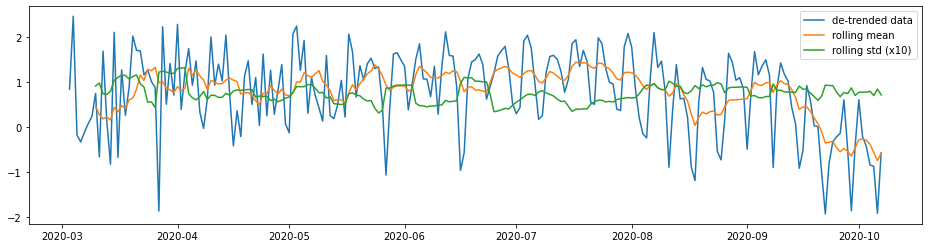

In [261]:
# trying detrending on the data to see if it makes it stationary, but it doesn't help

y_detrend =  (y - y.rolling(window=8).mean())/y.rolling(window=8).std()

test_stationarity(y_detrend,'de-trended data')
ADF_test(y_detrend,'de-trended data')

 > Is the 8 lag differenced data stationary ?
Test statistic = -2.418
P-value = 0.137
Critical values :
	1%: -3.4631437906252636 - The data is not stationary with 99% confidence
	5%: -2.8759570379821047 - The data is not stationary with 95% confidence
	10%: -2.574454682874228 - The data is not stationary with 90% confidence


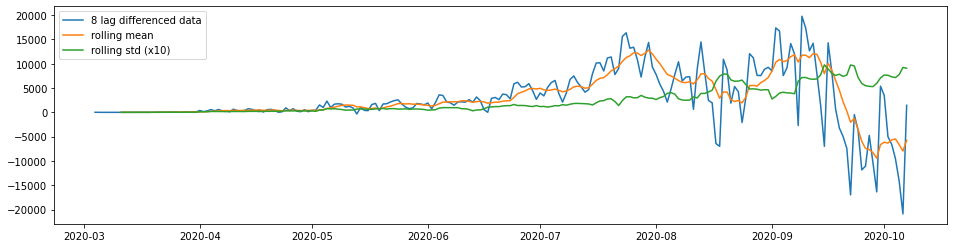

In [262]:
# trying differencing on the data to see if it makes it stationary, but it doesn't help

y_8lag =  y - y.shift(8)

test_stationarity(y_8lag,'8 lag differenced data')
ADF_test(y_8lag,'8 lag differenced data')

 > Is the 8 lag differenced de-trended data stationary ?
Test statistic = -4.683
P-value = 0.000
Critical values :
	1%: -3.464337030867007 - The data is  stationary with 99% confidence
	5%: -2.876478799035722 - The data is  stationary with 95% confidence
	10%: -2.574733103221565 - The data is  stationary with 90% confidence


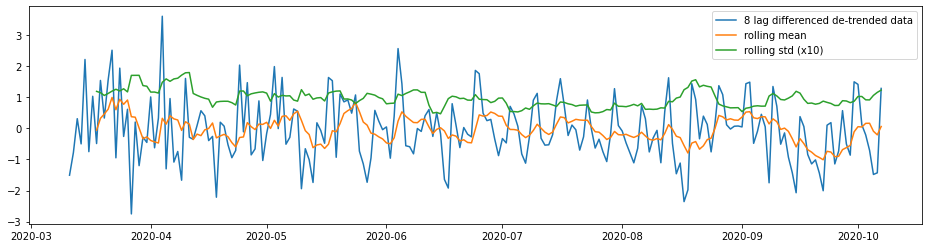

In [263]:
# detrending + differencing together works in making the data stationary

y_8lag_detrend =  y_detrend - y_detrend.shift(8)

test_stationarity(y_8lag_detrend,'8 lag differenced de-trended data')
ADF_test(y_8lag_detrend,'8 lag differenced de-trended data')

<a id="Indiases"></a>

## SES
[▲ Return to contents](#Contents)

In [264]:
#the train and val is 75-25 split
y_25feb_plus = y['2020-02-25':]
y_25feb_plus_train = y_25feb_plus[:'2020-08-12']
y_25feb_plus_val = y_25feb_plus['2020-08-13':]

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\holtwinters\model.py:429: FutureWarning: After 0.13 initialization must be handled at model creation
  FutureWarning,
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\holtwinters\model.py:429: FutureWarning: After 0.13 initialization must be handled at model creation
  FutureWarning,
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\holtwinters\model.py:922: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning,


The Root Mean Squared Error of our forecasts with smoothing level of 0.8 is 22776.72
The Root Mean Squared Error of our forecasts with auto optimization is 21842.81


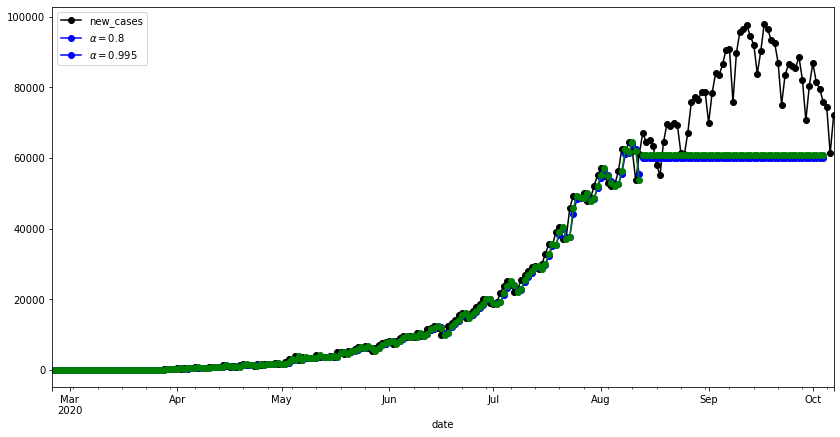

In [265]:
ses2(y_25feb_plus,y_25feb_plus_train,y_25feb_plus_val,0.8,predict_date,RMSE4)

<a id="Indiasarima1"></a>

## SARIMA Daily Cases
[▲ Return to contents](#Contents)

In [266]:
# so one thing to note here is that even though we make the data stationary, it is not required for SARIMA
# we found in our research that as long as the parameter of SARIMA has d=1, it automatically ensures that
# non-stationarity is removed from the dataset; so whem making train-test data, we only use raw data

#data for naive analysis - the train and val is 75-25 split
y_25feb_plus = y['2020-02-25':]
y_25feb_plus_train = y_25feb_plus[:'2020-08-12']
y_25feb_plus_val = y_25feb_plus['2020-08-13':]

#data for advanced analysis - the train and val is 75-25 split
y_lock = y_25feb_plus['2020-02-25':'2020-05-29']
y_lock_val = y_25feb_plus['2020-05-07':'2020-05-29']
y_unlock = y_25feb_plus['2020-05-30':]

In [267]:
# sarima grid search function
# this helps identify the optimal parameters that can be fed to the sarima algorithm

def sarima_grid_search(y,seasonal_period):
    p = d = q = range(0, 2)
    pdq = list(itertools.product(p, d, q))
    seasonal_pdq = [(x[0], x[1], x[2],seasonal_period) for x in list(itertools.product(p, d, q))]
    
    mini = float('+inf')
    
    
    for param in pdq:
        for param_seasonal in seasonal_pdq:
            try:
                mod = sm.tsa.statespace.SARIMAX(y,
                                                order=param,
                                                seasonal_order=param_seasonal,
                                                enforce_stationarity=False,
                                                enforce_invertibility=False)

                results = mod.fit()
                
                if results.aic < mini:
                    mini = results.aic
                    param_mini = param
                    param_seasonal_mini = param_seasonal

                print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results.aic))
                
            except:
                continue
    print('The set of parameters with the minimum AIC is: SARIMA{}x{} - AIC:{}'.format(param_mini, param_seasonal_mini, mini))

In [268]:
# we search for parameters with a seasonal period of 8 because the seasonal cycle as seen above was ~8
# and the parameter with the lowest AIC is picked

sarima_grid_search(y,8)

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(0, 0, 0)x(0, 0, 0, 8) - AIC:5456.488487789146
SARIMA(0, 0, 0)x(0, 0, 1, 8) - AIC:5125.275455161262
SARIMA(0, 0, 0)x(0, 1, 0, 8) - AIC:4429.085216742395
SARIMA(0, 0, 0)x(0, 1, 1, 8) - AIC:4207.2993330510335
SARIMA(0, 0, 0)x(1, 0, 0, 8) - AIC:4427.6297787618605
SARIMA(0, 0, 0)x(1, 0, 1, 8) - AIC:4364.62440097469
SARIMA(0, 0, 0)x(1, 1, 0, 8) - AIC:4214.417159115291


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(0, 0, 0)x(1, 1, 1, 8) - AIC:4196.72328024944
SARIMA(0, 0, 1)x(0, 0, 0, 8) - AIC:5270.065619269781


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 0, 1)x(0, 0, 1, 8) - AIC:5045.847026135598
SARIMA(0, 0, 1)x(0, 1, 0, 8) - AIC:4287.27183900568


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 0, 1)x(0, 1, 1, 8) - AIC:4133.996694220557
SARIMA(0, 0, 1)x(1, 0, 0, 8) - AIC:5077.382967754136


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check 

SARIMA(0, 0, 1)x(1, 0, 1, 8) - AIC:4261.138982053795
SARIMA(0, 0, 1)x(1, 1, 0, 8) - AIC:4172.116199416396
SARIMA(0, 0, 1)x(1, 1, 1, 8) - AIC:4132.236753542415
SARIMA(0, 1, 0)x(0, 0, 0, 8) - AIC:4280.185961122236
SARIMA(0, 1, 0)x(0, 0, 1, 8) - AIC:4136.973666345273
SARIMA(0, 1, 0)x(0, 1, 0, 8) - AIC:4255.329408505566


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(0, 1, 0)x(0, 1, 1, 8) - AIC:4000.083184392026
SARIMA(0, 1, 0)x(1, 0, 0, 8) - AIC:4155.007362792573
SARIMA(0, 1, 0)x(1, 0, 1, 8) - AIC:4131.908193594372
SARIMA(0, 1, 0)x(1, 1, 0, 8) - AIC:4106.946096745785


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(0, 1, 0)x(1, 1, 1, 8) - AIC:4024.773061493625
SARIMA(0, 1, 1)x(0, 0, 0, 8) - AIC:4263.4856338964455
SARIMA(0, 1, 1)x(0, 0, 1, 8) - AIC:4106.71613371262
SARIMA(0, 1, 1)x(0, 1, 0, 8) - AIC:4193.832629225405


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(0, 1, 1)x(0, 1, 1, 8) - AIC:3998.7340691191243
SARIMA(0, 1, 1)x(1, 0, 0, 8) - AIC:4153.723094868837
SARIMA(0, 1, 1)x(1, 0, 1, 8) - AIC:4106.525099384759

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)



SARIMA(0, 1, 1)x(1, 1, 0, 8) - AIC:4082.1962962805374


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 1, 1)x(1, 1, 1, 8) - AIC:3998.1968081477216
SARIMA(1, 0, 0)x(0, 0, 0, 8) - AIC:4299.937045167692
SARIMA(1, 0, 0)x(0, 0, 1, 8) - AIC:4198.30644529544


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(1, 0, 0)x(0, 1, 0, 8) - AIC:4247.501045542036


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 0)x(0, 1, 1, 8) - AIC:4034.573625366733
SARIMA(1, 0, 0)x(1, 0, 0, 8) - AIC:4156.893203796485


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will

SARIMA(1, 0, 0)x(1, 0, 1, 8) - AIC:4145.701391365593
SARIMA(1, 0, 0)x(1, 1, 0, 8) - AIC:4091.896051372636


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 0)x(1, 1, 1, 8) - AIC:4036.2078970131374
SARIMA(1, 0, 1)x(0, 0, 0, 8) - AIC:4283.064486478423
SARIMA(1, 0, 1)x(0, 0, 1, 8) - AIC:4156.749149062291


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(1, 0, 1)x(0, 1, 0, 8) - AIC:4210.936754368338


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 1)x(0, 1, 1, 8) - AIC:4016.5816135681303
SARIMA(1, 0, 1)x(1, 0, 0, 8) - AIC:4155.178371557996


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 1)x(1, 0, 1, 8) - AIC:4125.752567928586
SARIMA(1, 0, 1)x(1, 1, 0, 8) - AIC:4081.2881836271085


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 1)x(1, 1, 1, 8) - AIC:4015.568194533349
SARIMA(1, 1, 0)x(0, 0, 0, 8) - AIC:4281.948455455802
SARIMA(1, 1, 0)x(0, 0, 1, 8) - AIC:4135.975655321463
SARIMA(1, 1, 0)x(0, 1, 0, 8) - AIC:4245.970721980092


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(1, 1, 0)x(0, 1, 1, 8) - AIC:4020.403421790846
SARIMA(1, 1, 0)x(1, 0, 0, 8) - AIC:4138.34138573553
SARIMA(1, 1, 0)x(1, 0, 1, 8) - AIC:4129.89879027645


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(1, 1, 0)x(1, 1, 0, 8) - AIC:4086.641400632173


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 0)x(1, 1, 1, 8) - AIC:4021.812076956677
SARIMA(1, 1, 1)x(0, 0, 0, 8) - AIC:4256.463433744553


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 1)x(0, 0, 1, 8) - AIC:4101.733201178327
SARIMA(1, 1, 1)x(0, 1, 0, 8) - AIC:4188.827753988409


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 1)x(0, 1, 1, 8) - AIC:3992.853130042918
SARIMA(1, 1, 1)x(1, 0, 0, 8) - AIC:4126.5933077172895


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 1)x(1, 0, 1, 8) - AIC:4100.869240145263
SARIMA(1, 1, 1)x(1, 1, 0, 8) - AIC:4055.5915157791883

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 1)x(1, 1, 1, 8) - AIC:3991.6016099394033
The set of parameters with the minimum AIC is: SARIMA(1, 1, 1)x(1, 1, 1, 8) - AIC:3991.6016099394033


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3962      0.189      2.097      0.036       0.026       0.767
ma.L1         -0.6982      0.142     -4.927      0.000      -0.976      -0.420
ar.S.L8        0.1988      0.123      1.621      0.105      -0.042       0.439
ma.S.L8       -0.9843      0.086    -11.437      0.000      -1.153      -0.816
sigma2      1.885e+07   5.55e-09    3.4e+15      0.000    1.88e+07    1.88e+07


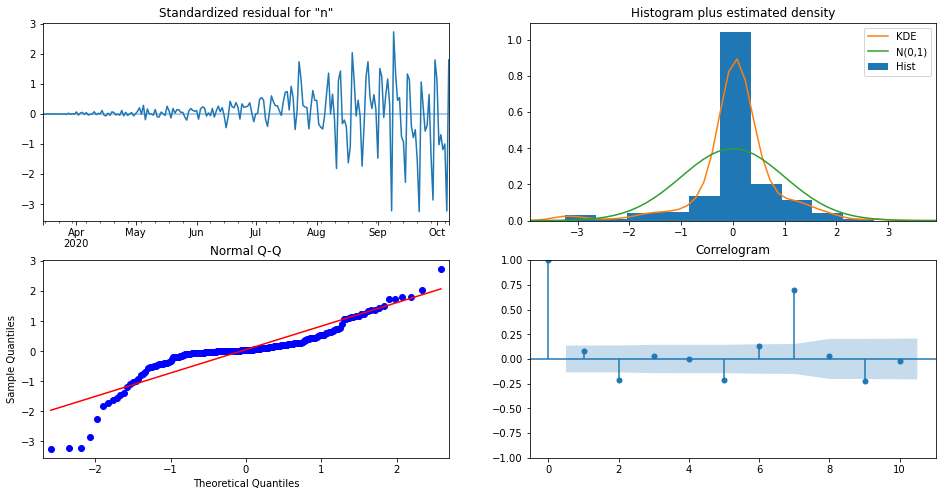

The Root Mean Squared Error of SARIMA with season_length=8 and dynamic = False 6026.71


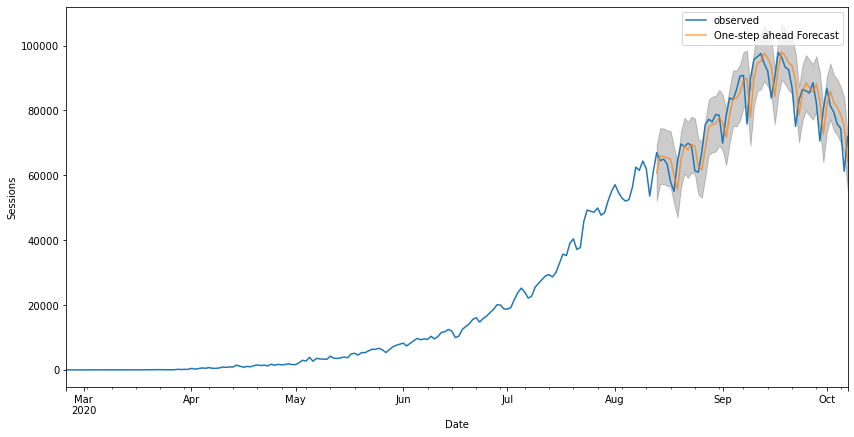

The Root Mean Squared Error of SARIMA with season_length=8 and dynamic = True 12373.42


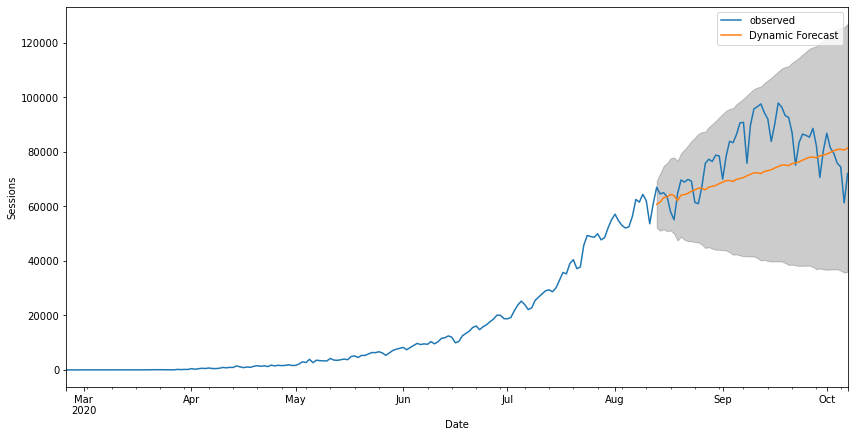

In [269]:
# the naive model trains on all datapoints of new cases

model_nav = sarima_eva2(y_25feb_plus,(1, 1, 1),(1, 1, 1, 8),8,'2020-08-13',y_25feb_plus_val, RMSE4)

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0471      0.160     -0.294      0.768      -0.360       0.266
ma.L1         -0.4363      0.146     -2.983      0.003      -0.723      -0.150
ar.S.L8        0.0437      0.141      0.309      0.757      -0.234       0.321
ma.S.L8       -0.8076      0.152     -5.296      0.000      -1.106      -0.509
sigma2      1.568e+05   2.18e+04      7.195      0.000    1.14e+05       2e+05


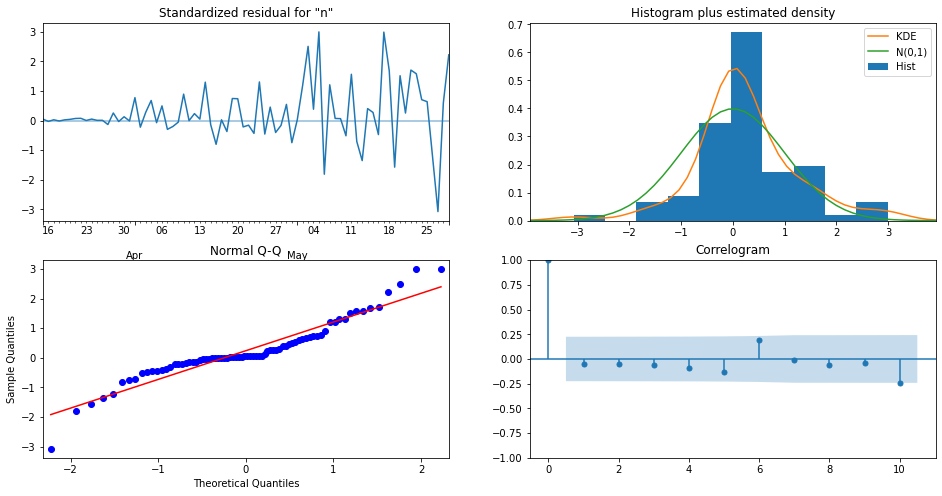

The Root Mean Squared Error of SARIMA with season_length=8 and dynamic = False 643.62


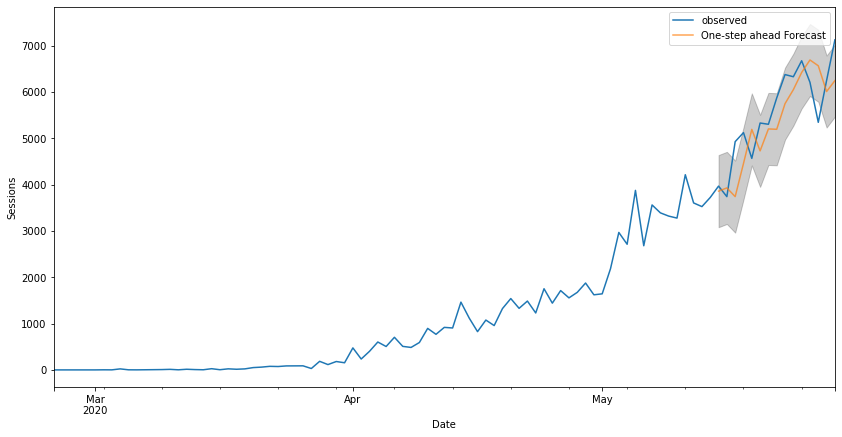

The Root Mean Squared Error of SARIMA with season_length=8 and dynamic = True 1490.81


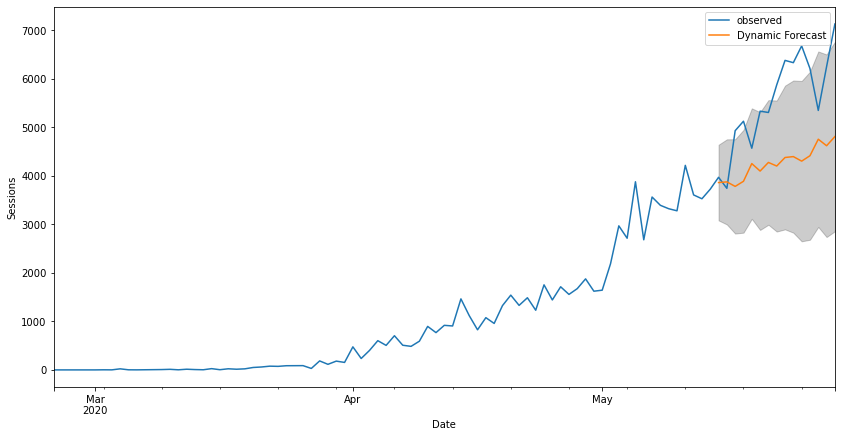

In [270]:
# the advanced model trains on all datapoints of new cases till the end of the lockdown in India

model_adv = sarima_eva(y_lock,(1, 1, 1),(1, 1, 1, 8),8,'2020-05-15',y_lock_val)

In [271]:
# this function can take any sarima model and can forecast predictions at a given number of steps

def forecast(model,predict_steps,y,title,y_axis):
    
    pred_uc = model.get_forecast(steps=predict_steps)

    #SARIMAXResults.conf_int, can change alpha,the default alpha = .05 returns a 95% confidence interval.
    pred_ci = pred_uc.conf_int()

    ax = y.plot(label='Observed', figsize=(14, 7))
#     print(pred_uc.predicted_mean)
    pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)
    ax.set_xlabel('Date', size = 15)
    ax.set_ylabel(y_axis, size = 15)
    ax.set_title(title, size = 15)
    ax.tick_params(labelsize=13)
    plt.axvline(x='2020-03-24', label = "Lockdown Begins - 24 March, 2020", color = 'green')
    plt.axvline(x='2020-05-30', label = "Lockdown Ends - 30 May, 2020", color = 'brown')
    
    plt.legend(prop={'size': 13})
    plt.show()
    
    # Produce the forcasted tables 
    pm = pred_uc.predicted_mean.reset_index()
    pm.columns = ['Date','Predicted_Mean']
    pci = pred_ci.reset_index()
    pci.columns = ['Date','Lower Bound','Upper Bound']
    final_table = pm.join(pci.set_index('Date'), on='Date')
    
    return (final_table)

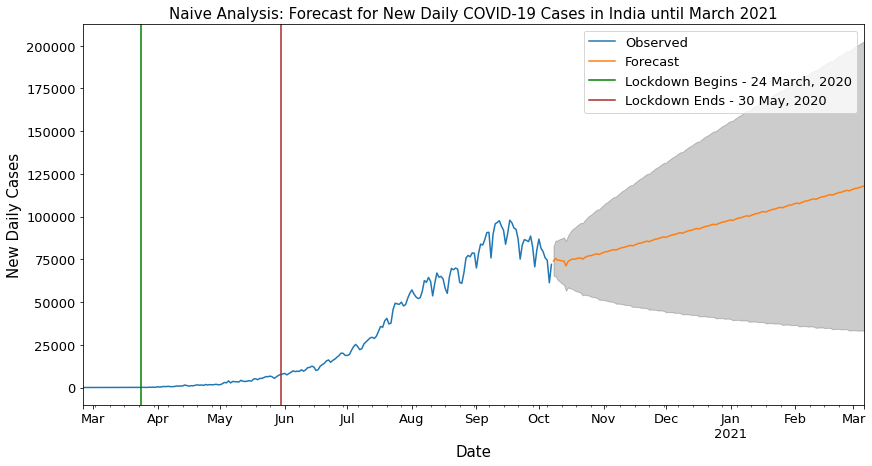

,Date,Predicted_Mean,Lower Bound,Upper Bound
0,2020-10-08,73991.31288641,65425.16850944,82557.45726338
1,2020-10-09,75512.69527661,65054.46080693,85970.92974629
2,2020-10-10,74475.34303724,62894.14866525,86056.53740924
3,2020-10-11,74400.79042295,61951.71153604,86849.86930985
4,2020-10-12,74044.37242347,60838.93107770,87249.81376923


In [272]:
# this is the forecast of the naive model into 2021, and here we are basically looking to see overall
# in the future does the case count continue to grow and by how much

final_table_nav = forecast(model_nav,150,y_25feb_plus,"Naive Analysis: Forecast for New Daily COVID-19 Cases in India until March 2021", "New Daily Cases")
final_table_nav.head()

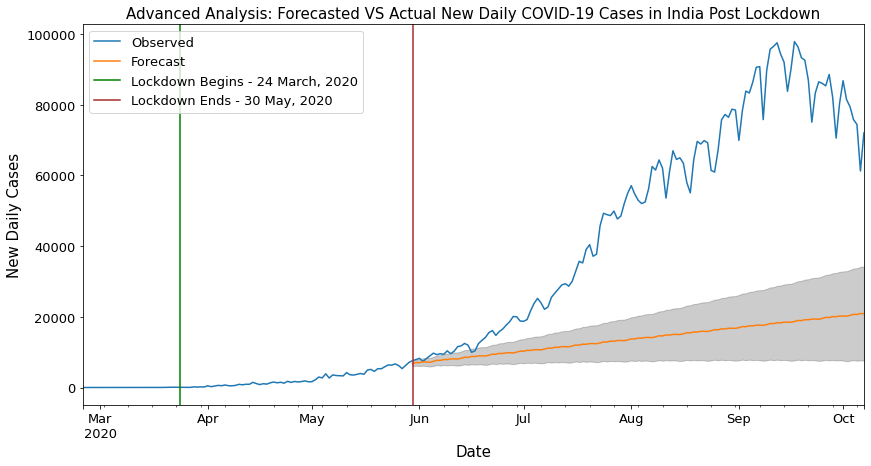

,Date,Predicted_Mean,Lower Bound,Upper Bound
0,2020-05-30,6774.53940426,5997.25183527,7551.82697325
1,2020-05-31,7066.85360398,6191.94778117,7941.75942680
2,2020-06-01,7033.56508691,6063.42649940,8003.70367443
3,2020-06-02,7235.73665366,6179.31316428,8292.16014303
4,2020-06-03,7223.29793805,6087.08574740,8359.51012871


In [273]:
# this is the graph for the advanced analysis - here we only forecast after the end of the lockdown and compare
# if the actual new cases are lower than what is forecasted; in this case since the actual case count is much 
# higher post-lockdown than the predicted case count, we can say that the lockdown was not that effective and
# that it simply delays the eventual rise in the covid cases in India

final_table_adv = forecast(model_adv,131,y_25feb_plus,"Advanced Analysis: Forecasted VS Actual New Daily COVID-19 Cases in India Post Lockdown", "New Daily Cases")
final_table_adv.head()

<a id="Indiasarima2"></a>

## SARIMA Daily Deaths
[▲ Return to contents](#Contents)

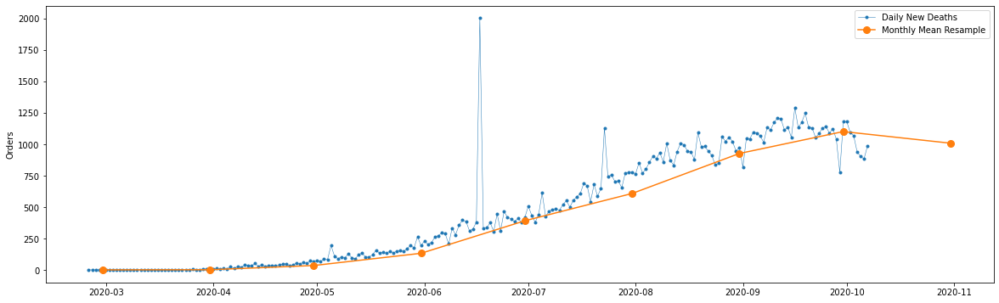

In [274]:
# first, because the time series prep exclusively focused of new case counts, let's quickly look at what daily deaths
# look like in terms of seasonality and all those things

# assign the new daily death count to d and restrict the entries to only after feb 25 for standardization across countries
d = df_india_counts["new_death"]
d = d['2020-02-25':]

# plot the number of daily deaths and also the mean per month
fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(d,marker='.', linestyle='-', linewidth=0.5, label='Daily New Deaths')
ax.plot(d.resample('M').mean(),marker='o', markersize=8, linestyle='-', label='Monthly Mean Resample')
ax.set_ylabel('Orders')
ax.legend();

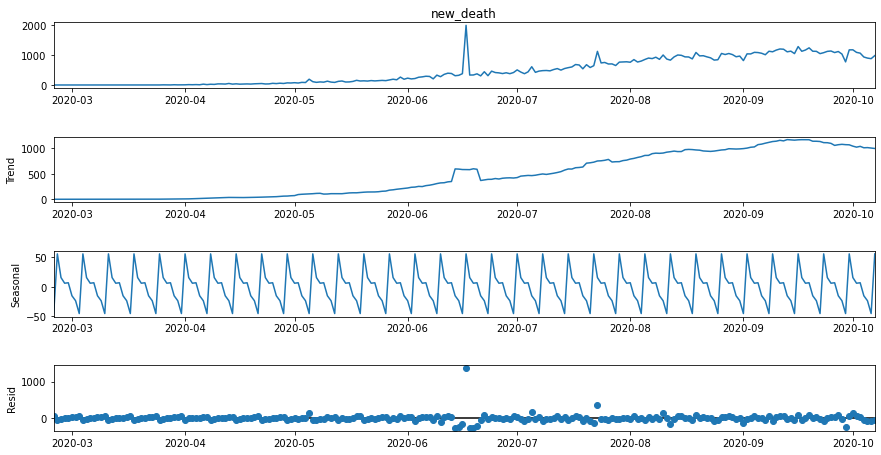

In [275]:
# graphs to show seasonality, trend
# major takeaway - our data does have a rising trend, and the seasonal period is ~8 days for deaths as well

# another thing to note: from here we directly move on to SARIMA modelling because we know that SARIMA can
# work with this non-stationary dataset

seasonal_decompose(d)

In [276]:
#data for naive analysis - the train and val is 75-25 split
d_25feb_plus = d['2020-02-25':]
d_25feb_plus_train = d_25feb_plus[:'2020-08-12']
d_25feb_plus_val = d_25feb_plus['2020-08-13':]

#data for advanced analysis - the train and val is 75-25 split
d_lock = d_25feb_plus['2020-02-25':'2020-05-29']
d_lock_val = d_25feb_plus['2020-05-07':'2020-05-29']
d_unlock = d_25feb_plus['2020-05-30':]

In [277]:
# we search for parameters with a seasonal period of 8 because the seasonal cycle as seen above was ~8
# and the parameter with the lowest AIC is picked

sarima_grid_search(d,8)

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(0, 0, 0)x(0, 0, 0, 8) - AIC:3545.102273619484
SARIMA(0, 0, 0)x(0, 0, 1, 8) - AIC:3237.836971257749
SARIMA(0, 0, 0)x(0, 1, 0, 8) - AIC:2882.750134798372
SARIMA(0, 0, 0)x(0, 1, 1, 8) - AIC:2763.2882241244993
SARIMA(0, 0, 0)x(1, 0, 0, 8) - AIC:2896.8991448204315


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 0, 0)x(1, 0, 1, 8) - AIC:2852.4404993776807
SARIMA(0, 0, 0)x(1, 1, 0, 8) - AIC:2776.0651566915776
SARIMA(0, 0, 0)x(1, 1, 1, 8) - AIC:2764.4636752955284

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)



SARIMA(0, 0, 1)x(0, 0, 0, 8) - AIC:3324.406493414185


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 0, 1)x(0, 0, 1, 8) - AIC:3111.6337786348204
SARIMA(0, 0, 1)x(0, 1, 0, 8) - AIC:2869.974638972447


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 0, 1)x(0, 1, 1, 8) - AIC:2742.1037715976126
SARIMA(0, 0, 1)x(1, 0, 0, 8) - AIC:2896.4969685236942


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 0, 1)x(1, 0, 1, 8) - AIC:2832.404879395317
SARIMA(0, 0, 1)x(1, 1, 0, 8) - AIC:2769.0810735761015


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 0, 1)x(1, 1, 1, 8) - AIC:2743.0492524616875
SARIMA(0, 1, 0)x(0, 0, 0, 8) - AIC:2951.4064825498494
SARIMA(0, 1, 0)x(0, 0, 1, 8) - AIC:2855.6837859224947
SARIMA(0, 1, 0)x(0, 1, 0, 8) - AIC:2992.9957254363


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(0, 1, 0)x(0, 1, 1, 8) - AIC:2775.0266790851974
SARIMA(0, 1, 0)x(1, 0, 0, 8) - AIC:2867.8748079628394
SARIMA(0, 1, 0)x(1, 0, 1, 8) - AIC:2857.6749089967734
SARIMA(0, 1, 0)x(1, 1, 0, 8) - AIC:2850.4011543453844


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(0, 1, 0)x(1, 1, 1, 8) - AIC:2776.9451059551347
SARIMA(0, 1, 1)x(0, 0, 0, 8) - AIC:2831.5021170071723
SARIMA(0, 1, 1)x(0, 0, 1, 8) - AIC:2738.687409574969


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(0, 1, 1)x(0, 1, 0, 8) - AIC:2854.6469738755254


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 1, 1)x(0, 1, 1, 8) - AIC:2658.004914363377
SARIMA(0, 1, 1)x(1, 0, 0, 8) - AIC:2762.1403785554394


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 1, 1)x(1, 0, 1, 8) - AIC:2740.6705656356276
SARIMA(0, 1, 1)x(1, 1, 0, 8) - AIC:2742.2110538678726

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 1, 1)x(1, 1, 1, 8) - AIC:2659.633305195945
SARIMA(1, 0, 0)x(0, 0, 0, 8) - AIC:2962.3900822696696
SARIMA(1, 0, 0)x(0, 0, 1, 8) - AIC:2866.513752348891
SARIMA(1, 0, 0)x(0, 1, 0, 8) - AIC:2881.826794536226


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(1, 0, 0)x(0, 1, 1, 8) - AIC:2748.751050952984
SARIMA(1, 0, 0)x(1, 0, 0, 8) - AIC:2866.4664769429846


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 0)x(1, 0, 1, 8) - AIC:2840.632878049877
SARIMA(1, 0, 0)x(1, 1, 0, 8) - AIC:2754.6802393732787


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 0)x(1, 1, 1, 8) - AIC:2750.0378877914436
SARIMA(1, 0, 1)x(0, 0, 0, 8) - AIC:2843.0685885636703


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 1)x(0, 0, 1, 8) - AIC:2750.621446283896
SARIMA(1, 0, 1)x(0, 1, 0, 8) - AIC:2867.8042398541056


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 1)x(0, 1, 1, 8) - AIC:2672.225527968449
SARIMA(1, 0, 1)x(1, 0, 0, 8) - AIC:2764.146170412274


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 1)x(1, 0, 1, 8) - AIC:2752.620519133805


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 1)x(1, 1, 0, 8) - AIC:2740.8801467518806


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 1)x(1, 1, 1, 8) - AIC:2673.686793491065
SARIMA(1, 1, 0)x(0, 0, 0, 8) - AIC:2896.9359138141826
SARIMA(1, 1, 0)x(0, 0, 1, 8) - AIC:2802.951561287859
SARIMA(1, 1, 0)x(0, 1, 0, 8) - AIC:2937.4320562389216


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(1, 1, 0)x(0, 1, 1, 8) - AIC:2725.460028813999
SARIMA(1, 1, 0)x(1, 0, 0, 8) - AIC:2803.0012749714524


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 0)x(1, 0, 1, 8) - AIC:2804.9362821071245
SARIMA(1, 1, 0)x(1, 1, 0, 8) - AIC:2794.1329154027635


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 0)x(1, 1, 1, 8) - AIC:2727.2182541653447
SARIMA(1, 1, 1)x(0, 0, 0, 8) - AIC:2833.4240211892507


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 1)x(0, 0, 1, 8) - AIC:2740.626292093395
SARIMA(1, 1, 1)x(0, 1, 0, 8) - AIC:2855.755070693526


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 1)x(0, 1, 1, 8) - AIC:2660.003703347292
SARIMA(1, 1, 1)x(1, 0, 0, 8) - AIC:2752.32682535569


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 1)x(1, 0, 1, 8) - AIC:2742.611598769975


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 1)x(1, 1, 0, 8) - AIC:2730.848529445284


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 1)x(1, 1, 1, 8) - AIC:2661.6304663376022
The set of parameters with the minimum AIC is: SARIMA(0, 1, 1)x(0, 1, 1, 8) - AIC:2658.004914363377


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8265      0.030    -27.972      0.000      -0.884      -0.769
ma.S.L8       -1.0000      0.017    -59.702      0.000      -1.033      -0.967
sigma2      1.938e+04   8.64e-07   2.24e+10      0.000    1.94e+04    1.94e+04


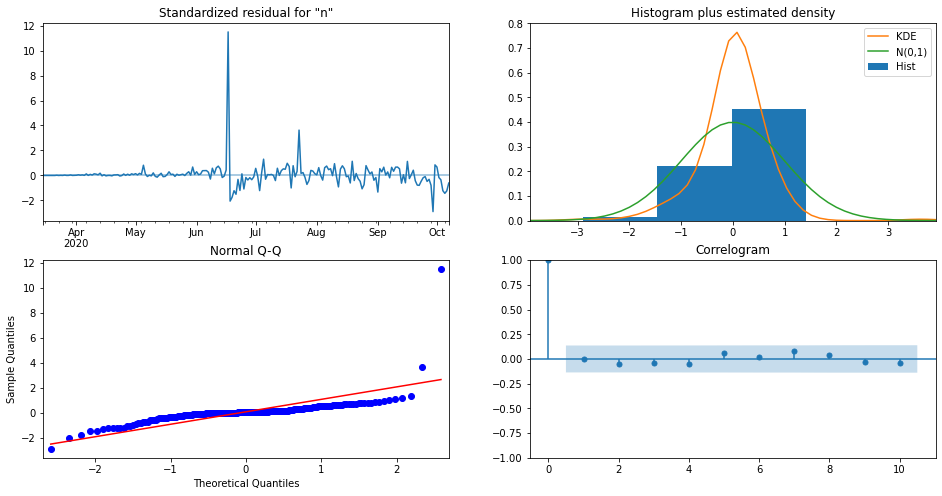

The Root Mean Squared Error of SARIMA with season_length=8 and dynamic = False 104.8


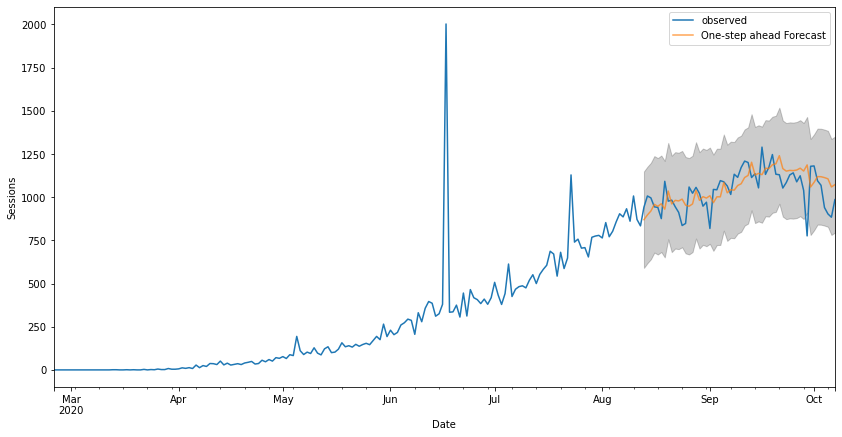

The Root Mean Squared Error of SARIMA with season_length=8 and dynamic = True 122.64


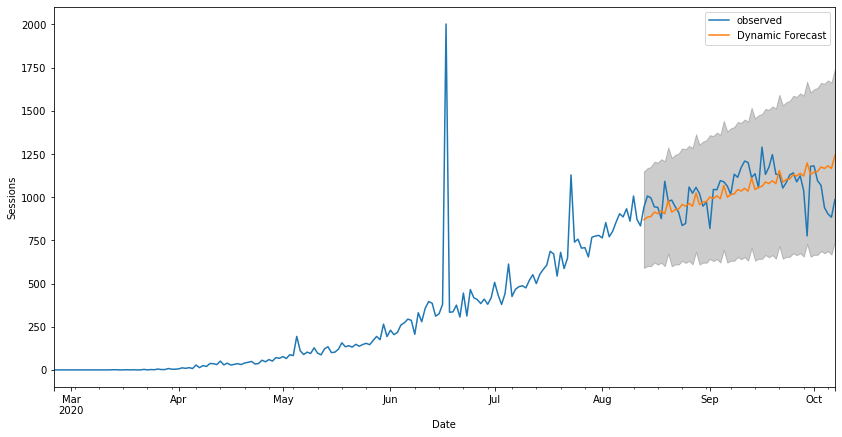

In [278]:
# the naive model trains on all datapoints of new deaths

model_nav_d = sarima_eva(d_25feb_plus,(0, 1, 1),(0, 1, 1, 8),8,'2020-08-13',d_25feb_plus_val)

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6766      0.109     -6.236      0.000      -0.889      -0.464
ma.S.L8       -0.8592      0.172     -5.010      0.000      -1.195      -0.523
sigma2       321.2801     28.335     11.339      0.000     265.745     376.815


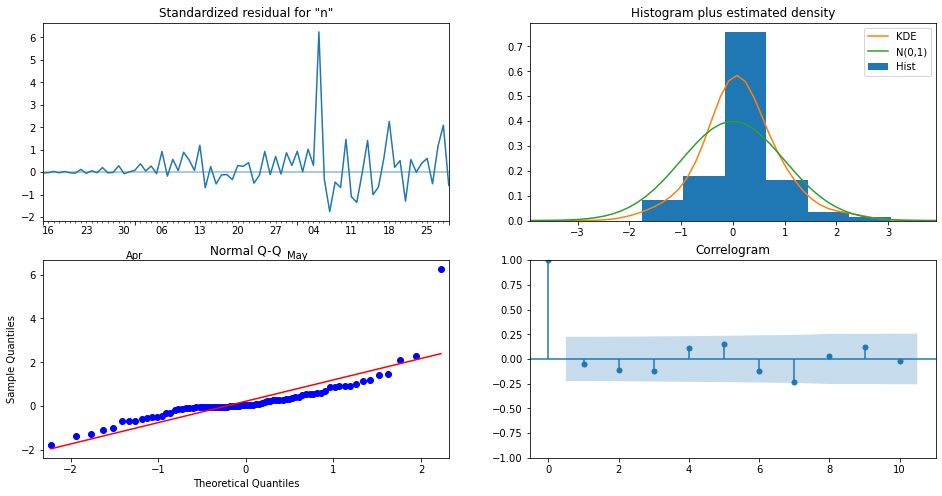

The Root Mean Squared Error of SARIMA with season_length=8 and dynamic = False 18.67


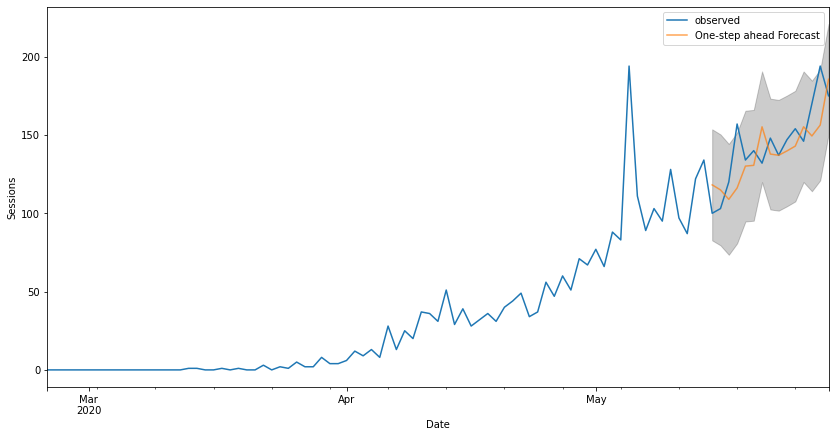

The Root Mean Squared Error of SARIMA with season_length=8 and dynamic = True 22.92


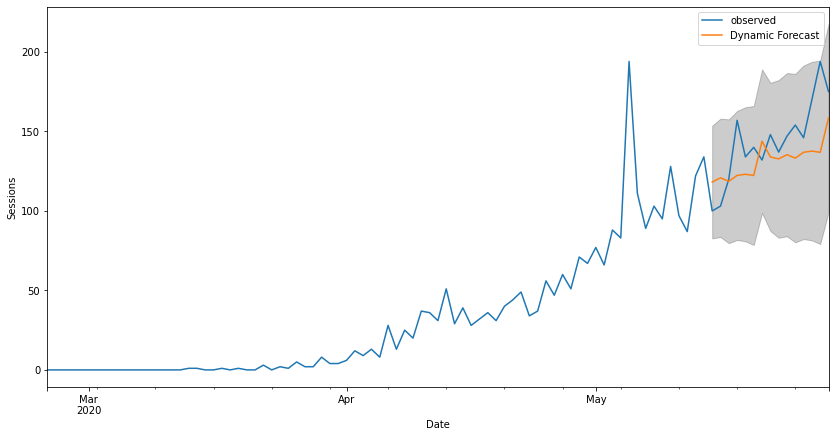

In [279]:
# the advanced model trains on all datapoints of new deaths till the end of the lockdown in India

model_adv_d = sarima_eva(d_lock,(0, 1, 1),(0, 1, 1, 8),8,'2020-05-15',d_lock_val)

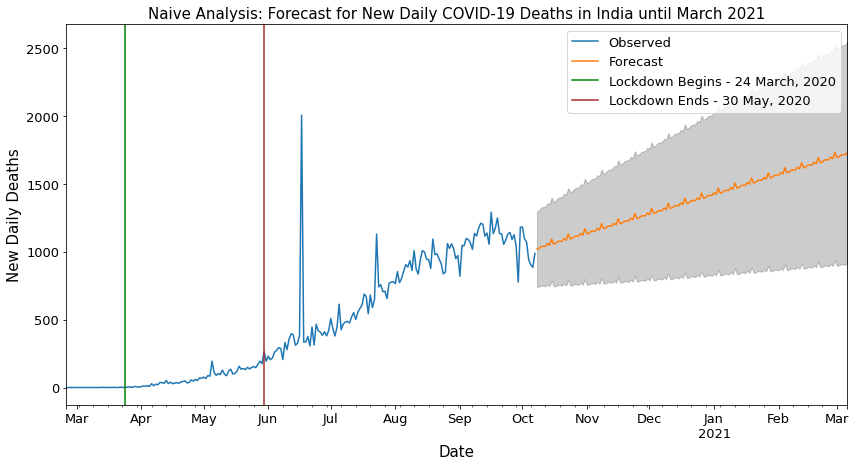

,Date,Predicted_Mean,Lower Bound,Upper Bound
0,2020-10-08,1017.61790988,739.87926778,1295.35655197
1,2020-10-09,1023.50036967,741.61572508,1305.38501425
2,2020-10-10,1036.56658560,750.59642266,1322.53674853
3,2020-10-11,1039.06851024,749.07038048,1329.06664000
4,2020-10-12,1037.82592104,743.85501017,1331.79683191


In [280]:
# this is the forecast of the naive death model into 2021, and here we are basically looking to see overall
# in the future does the death count continue to grow and by how much

final_table_nav_d = forecast(model_nav_d,150,d_25feb_plus,"Naive Analysis: Forecast for New Daily COVID-19 Deaths in India until March 2021", "New Daily Deaths")
final_table_nav_d.head()

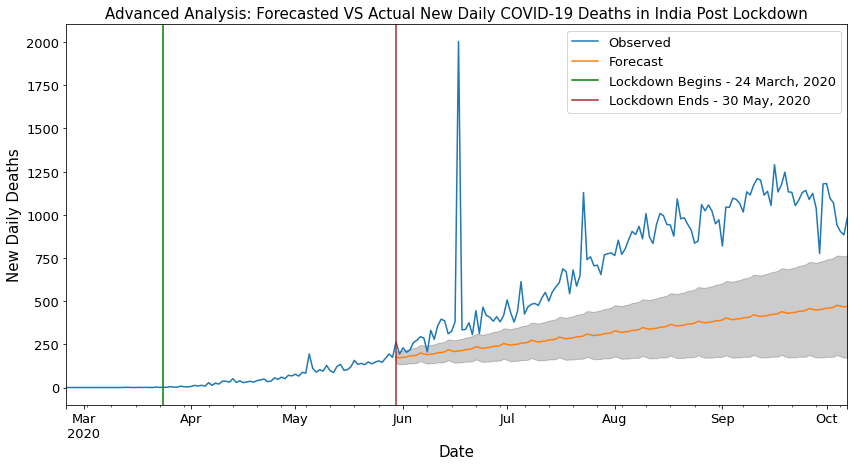

,Date,Predicted_Mean,Lower Bound,Upper Bound
0,2020-05-30,176.19633699,140.89612809,211.49654590
1,2020-05-31,171.06875334,133.96893074,208.16857593
2,2020-06-01,174.97709748,136.17454867,213.77964629
3,2020-06-02,176.65688267,136.21438789,217.09937744
4,2020-06-03,182.89887840,140.88039234,224.91736446


In [281]:
# this is the graph for the advanced death analysis - here we only forecast after the end of the lockdown and compare
# if the actual new deaths are lower than what is forecasted; 

# in this case since the actual death count is much higher post-lockdown than the predicted death count, 
# so we can say that the lockdown was not that effective and
# that it simply delays the eventual rise in the covid deaths in India

final_table_adv_d = forecast(model_adv_d,131,d_25feb_plus,"Advanced Analysis: Forecasted VS Actual New Daily COVID-19 Deaths in India Post Lockdown", "New Daily Deaths")
final_table_adv_d.head()

<a id="Indiachoose"></a>
## Choosing a time series model
[▲ Return to contents](#Contents)

In [282]:
RMSE4

{'ses': 21842.81, 'sarima': 6026.71, 'sarima_dynamic': 12373.42}

In [283]:
rmse_sort4 = dict(sorted(RMSE4.items(), key=operator.itemgetter(1)))

In [284]:
rmse_sort4

{'sarima': 6026.71, 'sarima_dynamic': 12373.42, 'ses': 21842.81}

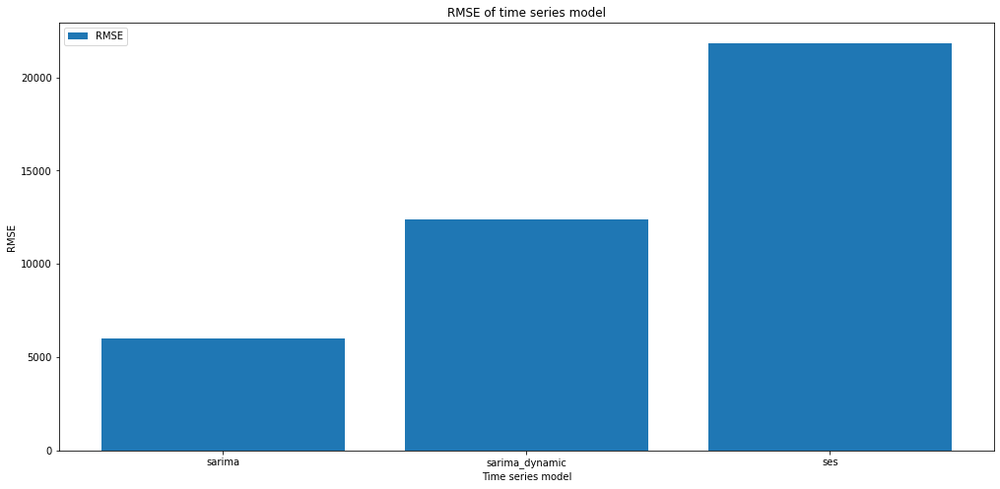

In [285]:
plt.figure(figsize=(17,8))
plt.bar(rmse_sort4.keys(), rmse_sort4.values(), label="RMSE")
plt.legend()
plt.title("RMSE of time series model")
plt.ylabel("RMSE")
plt.xlabel("Time series model")
plt.xticks()
plt.show();

<a id="Brazil"></a>

# BRAZIL
[▲ Return to contents](#Contents)

<a id="Brazilclean"></a>

## Data Cleaning
[▲ Return to contents](#Contents)

In [286]:
# read in datasets

df = pd.read_csv('Data/Brazil/brazil_covid19.csv')
df_cities = pd.read_csv('Data/Brazil/brazil_covid19_cities.csv')
df_coordinates = pd.read_csv('Data/Brazil/brazil_cities_coordinates.csv')
df_macro = pd.read_csv('Data/Brazil/brazil_covid19_macro.csv')
df_old = pd.read_csv('Data/Brazil/brazil_covid19_old.csv')

# this df won't read without errors - since the teaching staff has not responded to our inquiries, we have temporarily
# elected to skip over lines with incorrect number of values
df_population = pd.read_csv('Data/Brazil/brazil_population_2019.csv', error_bad_lines = False)

b'Skipping line 1282: expected 8 fields, saw 9\nSkipping line 1283: expected 8 fields, saw 9\nSkipping line 1293: expected 8 fields, saw 9\nSkipping line 1294: expected 8 fields, saw 9\nSkipping line 1300: expected 8 fields, saw 9\nSkipping line 1308: expected 8 fields, saw 9\nSkipping line 1309: expected 8 fields, saw 9\nSkipping line 1314: expected 8 fields, saw 9\nSkipping line 1319: expected 8 fields, saw 9\nSkipping line 1320: expected 8 fields, saw 9\nSkipping line 1321: expected 8 fields, saw 9\nSkipping line 1323: expected 8 fields, saw 9\n'


In [287]:
# take a peek
df.head()

,date,region,state,cases,deaths
0,2020-02-25,Centro-Oeste,DF,0,0
1,2020-02-25,Centro-Oeste,GO,0,0
2,2020-02-25,Centro-Oeste,MS,0,0
3,2020-02-25,Centro-Oeste,MT,0,0
4,2020-02-25,Nordeste,AL,0,0


In [288]:
# add response variable - new cases/deaths by day
national_cases_totals = df.groupby(by = 'date').sum()['cases'].values 
national_deaths_totals = df.groupby(by = 'date').sum()['deaths'].values

# cases
daily_cases = [national_cases_totals[0]]

for i in range(1, len(national_cases_totals)):
    change = national_cases_totals[i] - national_cases_totals[i-1]
    daily_cases.append(change)

# deaths
daily_deaths = [national_deaths_totals[0]]

for i in range(1, len(national_deaths_totals)):
    change = national_deaths_totals[i] - national_deaths_totals[i-1]
    daily_deaths.append(change)


In [289]:
df_brazil = df.groupby(by = 'date').sum().reset_index()

In [290]:
df_brazil['new_cases'] = daily_cases
df_brazil['new_deaths'] = daily_deaths

In [291]:
df_brazil.head()

,date,cases,deaths,new_cases,new_deaths
0,2020-02-25,0,0,0,0
1,2020-02-26,1,0,1,0
2,2020-02-27,1,0,0,0
3,2020-02-28,1,0,0,0
4,2020-02-29,2,0,1,0


In [292]:
df_cities.head()

,date,state,name,code,cases,deaths
0,2020-03-27,AC,Acrelândia,120001.00000000,0,0
1,2020-03-27,AC,Assis Brasil,120005.00000000,0,0
2,2020-03-27,AC,Brasiléia,120010.00000000,0,0
3,2020-03-27,AC,Bujari,120013.00000000,0,0
4,2020-03-27,AC,Capixaba,120017.00000000,0,0


In [293]:
df_macro.head()

recovered_totals, monitoring_totals = df_macro['recovered'].values, df_macro['monitoring'].values
# compute daily new recovered, monitoring
daily_recovered = [recovered_totals[0]]

for i in range(1, len(recovered_totals)):
    change = recovered_totals[i] - recovered_totals[i-1]
    daily_recovered.append(change)
    
daily_monitoring = [monitoring_totals[0]]

for i in range(1, len(monitoring_totals)):
    change = monitoring_totals[i] - monitoring_totals[i-1]
    daily_monitoring.append(change)

In [294]:
df_old.head()

,date,hour,state,suspects,refuses,cases,deaths
0,2020-01-30,16:00,Minas Gerais,1,0,0,0
1,2020-01-30,16:00,Rio de Janeiro,1,0,0,0
2,2020-01-30,16:00,Santa Catarina,0,2,0,0
3,2020-01-30,16:00,São Paulo,3,1,0,0
4,2020-01-30,16:00,Rio Grande do Sul,2,2,0,0


In [295]:
df_population.head()

,region,state,city,state_code,city_code,health_region_code,health_region,population
0,Centro-Oeste,Mato Grosso do Sul,Alcinópolis,50,500025,50001,Campo Grande,5343
1,Centro-Oeste,Mato Grosso do Sul,Amambai,50,500060,50003,Dourados,39396
2,Centro-Oeste,Mato Grosso do Sul,Bataguassu,50,500190,50004,Três Lagoas,23024
3,Centro-Oeste,Mato Grosso do Sul,Batayporã,50,500200,50003,Dourados,11329
4,Centro-Oeste,Mato Grosso do Sul,Bela Vista,50,500210,50001,Campo Grande,24629


In [296]:
# drop 'country' column from macro df - all brazil
df_macro = df_macro.drop(columns = 'country')

<a id="Brazilvisuals"></a>

## Visualizations
[▲ Return to contents](#Contents)

In [297]:
# compute basic statistics

# total cases, deaths, population
print("Brazil has:")
final_count = df.loc[df['date'] == '2020-10-07']
total_cases = final_count['cases'].sum()
print(total_cases, "total cases")
total_deaths = final_count['deaths'].sum()
print(total_deaths, "total deaths")
total_population = df_population['population'].sum()
print(total_population, "total people")

# case, death rates, case fatality rate
caserate = total_cases/total_population
deathrate = total_deaths/total_population
cfrate = total_deaths/total_cases
print("Case rate:", round(caserate, 4))
print("Death rate:", round(deathrate, 4))
print("Case fatality rate:", round(cfrate, 4))

Brazil has:
5000694 total cases
148228 total deaths
181728458 total people
Case rate: 0.0275
Death rate: 0.0008
Case fatality rate: 0.0296


Text(0.5, 1.0, 'Brazil: COVID Cases Over Time')

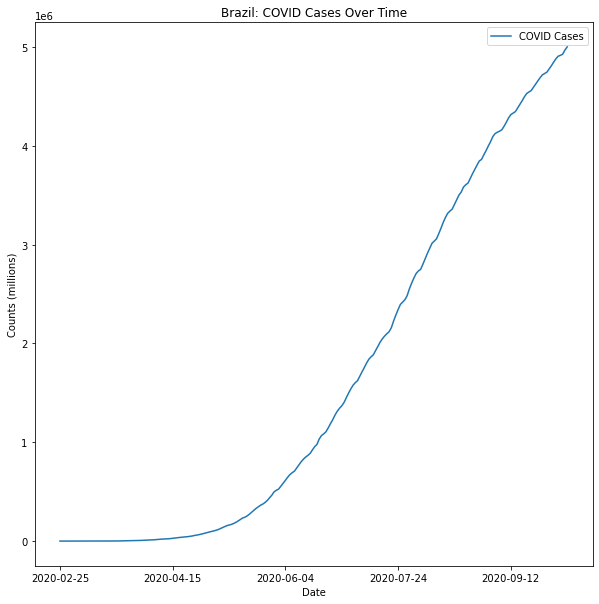

In [298]:
# plot time series of deaths and cases

# get total deaths, cases by date
case_totals = df.groupby(['date'])['cases'].sum()
death_totals = df.groupby(['date'])['deaths'].sum()

# plot cases
case_totals.plot(x = 'date', y = 'cases', label = 'COVID Cases', figsize = (10, 10))
plt.legend()
plt.xlabel('Date')
plt.ylabel('Counts (millions)')
plt.title('Brazil: COVID Cases Over Time')


Text(0.5, 1.0, 'Brazil: COVID Deaths/Cases Over Time')

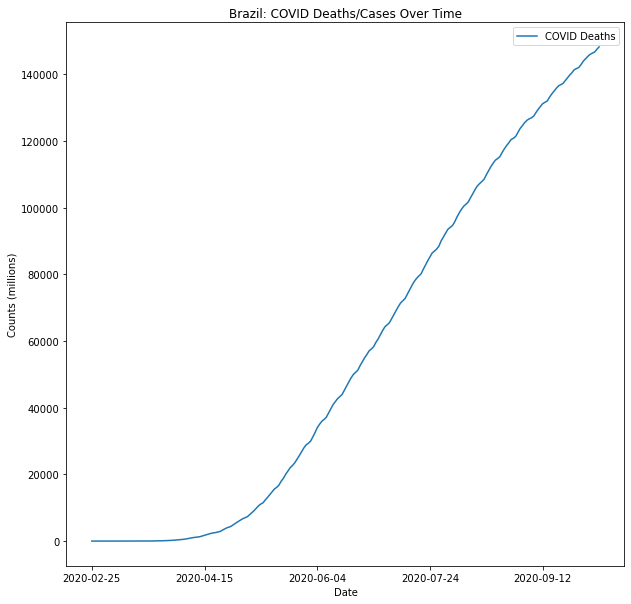

In [299]:
# deaths
death_totals.plot(x = 'date', y = 'deaths', label = 'COVID Deaths', figsize = (10, 10))
plt.legend()
plt.xlabel('Date')
plt.ylabel('Counts (millions)')
plt.title('Brazil: COVID Deaths/Cases Over Time')

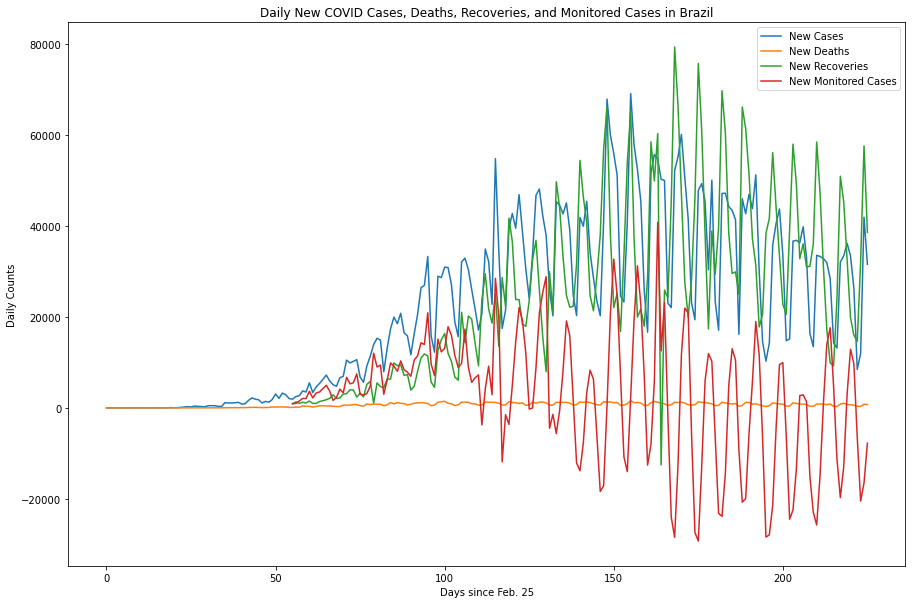

In [300]:
# plot daily new cases, deaths, recoveries, monitoring

plt.figure(figsize = (15, 10))
plt.plot(daily_cases, label = 'New Cases')
plt.plot(daily_deaths, label = 'New Deaths')
plt.plot(daily_recovered, label = 'New Recoveries')
plt.plot(daily_monitoring, label = 'New Monitored Cases')
plt.xlabel('Days since Feb. 25')
plt.ylabel('Daily Counts')
plt.title('Daily New COVID Cases, Deaths, Recoveries, and Monitored Cases in Brazil')
plt.legend()
plt.show();

In [301]:
# investigate trends across regions

# create dict of regions vs cases, caserate, deaths, deathrate, case fatality rate
region_dict = {}
regions = []

# for each region, add to list of regions
for region in df_population['region']:
    if region not in regions:
        regions.append(region)

# for each region, calculate summary statistics and append to dict
for region in regions:
    region_df = final_count.loc[final_count['region'] == region]
    region_population_df = df_population.loc[df_population['region'] == region]
    cases, deaths = region_df['cases'].sum(), region_df['deaths'].sum()
    population = region_population_df['population'].sum()
    region_info = {'cases': cases, 'deaths': deaths, 'caserate': cases/population, 'deathrate': deaths/population, 
                   'cfrate': deaths/cases}
    region_dict[region] = region_info

In [302]:
# report highest, lowest counts

# highest counts
print("Sudeste region has the highest case and death count, with", region_dict['Sudeste']['cases'], "cases and",
     region_dict['Sudeste']['deaths'], "deaths")
# highest caserate, deathrate
print("Centro-Oeste region has the highest case rate:", round(region_dict['Centro-Oeste']['caserate'] * 100, 3), 
     "percent of the population has tested positive")
print("Norte region has the highest death rate:", round(region_dict['Norte']['deathrate'] * 100, 3), 
     "percent of the population has died")
# highest case fatality rate
print("Sudeste region has the highest case fatality rate:", round(region_dict['Sudeste']['cfrate'] * 100, 3), 
     "percent of positive cases has died")

Sudeste region has the highest case and death count, with 1743816 cases and 67066 deaths
Centro-Oeste region has the highest case rate: 4.766 percent of the population has tested positive
Norte region has the highest death rate: 0.103 percent of the population has died
Sudeste region has the highest case fatality rate: 3.846 percent of positive cases has died


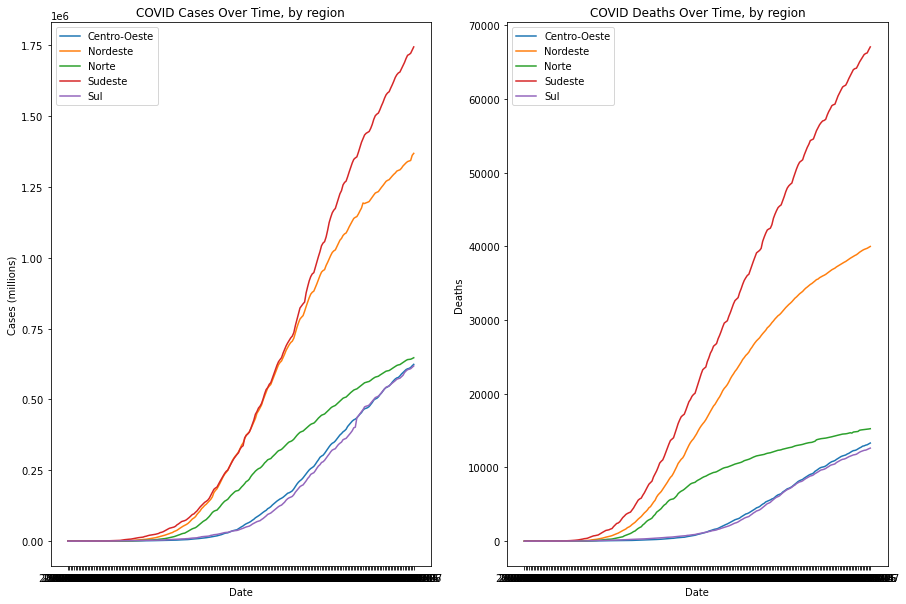

In [303]:
# plot deaths/cases by region
fig, ax = plt.subplots(1, 2, figsize = (15, 10))

for region in regions:
    # get total deaths, cases by date
    region_df = df.loc[df['region'] == region]
    case_totals = region_df.groupby(['date'])['cases'].sum()
    death_totals = region_df.groupby(['date'])['deaths'].sum()
    
    # plot cases
    ax[0].plot(case_totals, label = region)
    ax[0].set_xlabel('Date')
    ax[0].set_ylabel('Cases (millions)')
    ax[0].set_title('COVID Cases Over Time, by region')
    ax[0].legend()
    
    # plot deaths
    ax[1].plot(death_totals, label = region)
    ax[1].set_xlabel('Date')
    ax[1].set_ylabel('Deaths')
    ax[1].set_title('COVID Deaths Over Time, by region')
    ax[1].legend()

Text(0.5, 1.0, 'COVID Death Rate by Region')

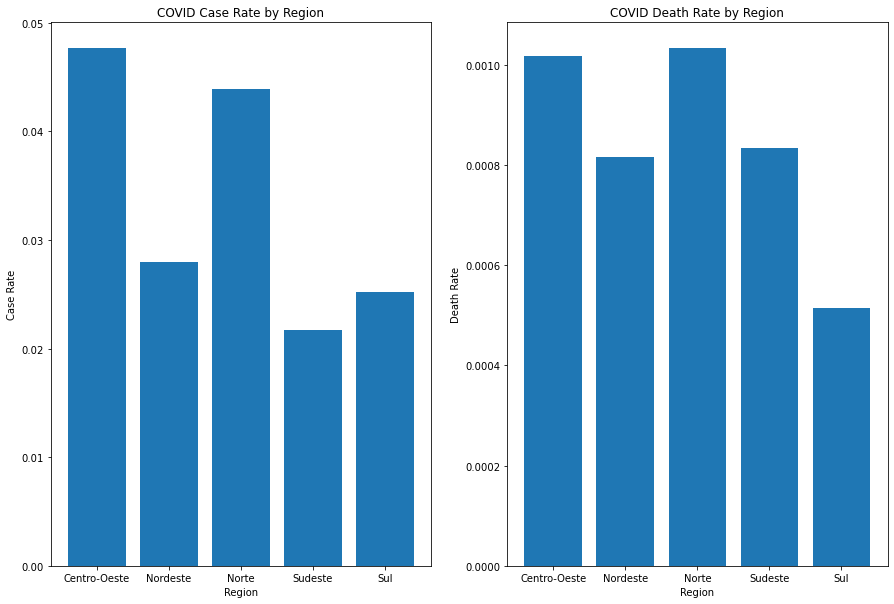

In [304]:
# to adjust for population, look at regions' rates of cases/deaths

region_caserates = {}
region_deathrates = {}
for region in region_dict:
    region_caserates[region] = region_dict[region]['caserate']
    region_deathrates[region] = region_dict[region]['deathrate']
    
# plot
fig, ax = plt.subplots(1, 2, figsize = (15, 10))

# caserates
ax[0].bar(region_caserates.keys(), region_caserates.values())
ax[0].set_xlabel('Region')
ax[0].set_ylabel('Case Rate')
ax[0].set_title('COVID Case Rate by Region')

# deathrates
ax[1].bar(region_deathrates.keys(), region_deathrates.values())
ax[1].set_xlabel('Region')
ax[1].set_ylabel('Death Rate')
ax[1].set_title('COVID Death Rate by Region')

<a id="Braziltime"></a>

## Time Series Model 
[▲ Return to contents](#Contents)

In [305]:
RMSE3 = {}

In [306]:
# seasonal decomposition of data
def seasonal_decompose (y):
    decomposition = sm.tsa.seasonal_decompose(y, period = 60, model='additive',extrapolate_trend='freq')
    fig = decomposition.plot()
    fig.set_size_inches(14,7)
    plt.show()

In [307]:
# new df using only new cases/deaths
df_by_date = df.groupby(by='date').sum().reset_index() 

df_new = pd.DataFrame(daily_cases, columns =['cases']) 
df_new['date'] = df_by_date['date']
df_new['datetime'] = pd.to_datetime(df_new['date'])
df_new = df_new.drop(['date'], axis=1)
df_new = df_new.set_index('datetime')

df_deaths = pd.DataFrame(daily_deaths, columns = ['deaths'])
df_deaths['date'] = df_by_date['date']
df_deaths['datetime'] = pd.to_datetime(df_deaths['date'])
df_deaths = df_deaths.drop(['date'], axis=1)
df_deaths = df_deaths.set_index('datetime')

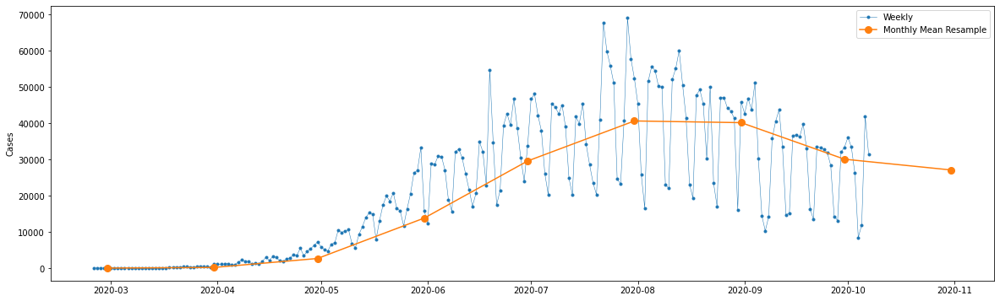

In [308]:
# visualization
y = df_new['cases']
y_deaths = df_deaths['deaths']
fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(y,marker='.', linestyle='-', linewidth=0.5, label='Weekly')
ax.plot(y.resample('M').mean(),marker='o', markersize=8, linestyle='-', label='Monthly Mean Resample')
ax.set_ylabel('Cases')
ax.legend();

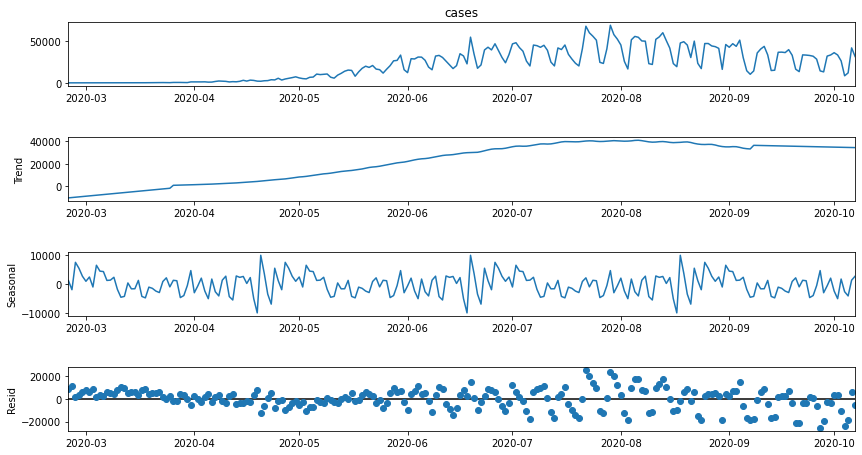

In [309]:
seasonal_decompose(y)

In [310]:
# test for stationarity of data
def test_stationarity(timeseries, title):
    
    #Determing rolling statistics
    rolmean = pd.Series(timeseries).rolling(window=12).mean() 
    rolstd = pd.Series(timeseries).rolling(window=12).std()
    
    fig, ax = plt.subplots(figsize=(16, 4))
    ax.plot(timeseries, label= title)
    ax.plot(rolmean, label='rolling mean');
    ax.plot(rolstd, label='rolling std (x10)');
    ax.legend()

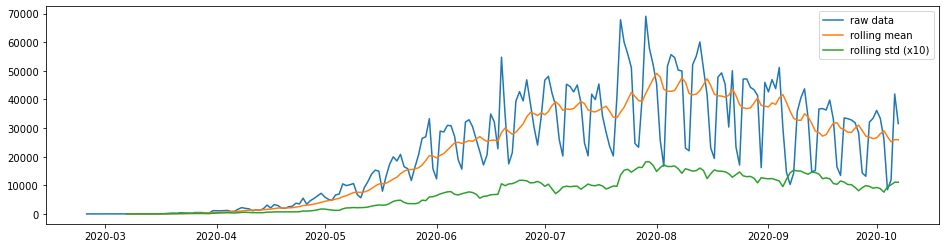

In [311]:
pd.options.display.float_format = '{:.8f}'.format
test_stationarity(df_new['cases'],'raw data')

In [312]:
ADF_test(y,'raw data')

 > Is the raw data stationary ?
Test statistic = -1.428
P-value = 0.569
Critical values :
	1%: -3.461878735881654 - The data is not stationary with 99% confidence
	5%: -2.875403665910809 - The data is not stationary with 95% confidence
	10%: -2.574159410430839 - The data is not stationary with 90% confidence


 > Is the de-trended data stationary ?
Test statistic = -2.223
P-value = 0.198
Critical values :
	1%: -3.4633090972761744 - The data is not stationary with 99% confidence
	5%: -2.876029332045744 - The data is not stationary with 95% confidence
	10%: -2.5744932593252643 - The data is not stationary with 90% confidence


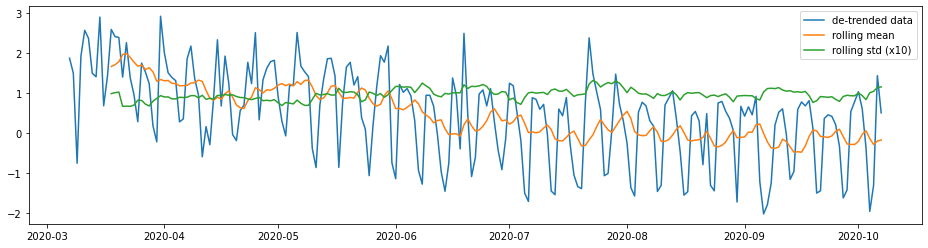

In [313]:
y_detrend =  (y - y.rolling(window=12).mean())/y.rolling(window=12).std()

test_stationarity(y_detrend,'de-trended data')
ADF_test(y_detrend,'de-trended data')

 > Is the 2 lag differenced data stationary ?
Test statistic = -4.565
P-value = 0.000
Critical values :
	1%: -3.4621857592784546 - The data is  stationary with 99% confidence
	5%: -2.875537986778846 - The data is  stationary with 95% confidence
	10%: -2.574231080806213 - The data is  stationary with 90% confidence


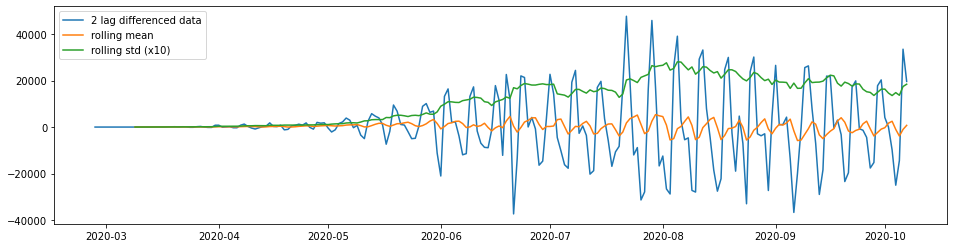

In [314]:
y_2lag =  y - y.shift(2)

test_stationarity(y_2lag,'2 lag differenced data')
ADF_test(y_2lag,'2 lag differenced data')

 > Is the 3 lag differenced de-trended data stationary ?
Test statistic = -4.634
P-value = 0.000
Critical values :
	1%: -3.464161278384219 - The data is  stationary with 99% confidence
	5%: -2.876401960790147 - The data is  stationary with 95% confidence
	10%: -2.5746921001665974 - The data is  stationary with 90% confidence


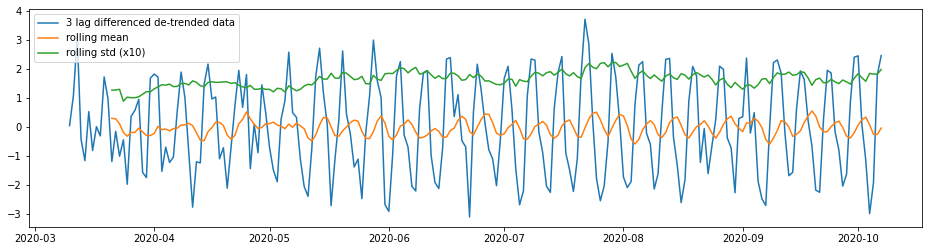

In [315]:
y_3lag_detrend =  y_detrend - y_detrend.shift(3)

test_stationarity(y_3lag_detrend,'3 lag differenced de-trended data')
ADF_test(y_3lag_detrend,'3 lag differenced de-trended data')

In [316]:
# train-val split
split = round(3*len(y)/4)
y_to_train = y[:split] # dataset to train
y_to_val = y[split:] # last X months for test  
predict_date = len(y) - len(y[:split]) # the number of data points for the test set

<a id="Brazilsarima"></a>

## SARIMA
[▲ Return to contents](#Contents)
### Best Model

In [317]:
sarima_grid_search(y,7)

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(0, 0, 0)x(0, 0, 0, 7) - AIC:5261.145161990336
SARIMA(0, 0, 0)x(0, 0, 1, 7) - AIC:4971.9090346805215
SARIMA(0, 0, 0)x(0, 1, 0, 7) - AIC:4497.121086326892
SARIMA(0, 0, 0)x(0, 1, 1, 7) - AIC:4344.31771462548
SARIMA(0, 0, 0)x(1, 0, 0, 7) - AIC:4517.818960234346
SARIMA(0, 0, 0)x(1, 0, 1, 7) - AIC:4482.994832074737
SARIMA(0, 0, 0)x(1, 1, 0, 7) - AIC:4362.892968729435
SARIMA(0, 0, 0)x(1, 1, 1, 7) - AIC:4345.090569338363

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ


SARIMA(0, 0, 1)x(0, 0, 0, 7) - AIC:5082.7898197520535
SARIMA(0, 0, 1)x(0, 0, 1, 7) - AIC:4883.686506774408
SARIMA(0, 0, 1)x(0, 1, 0, 7) - AIC:4461.223762385202

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ


SARIMA(0, 0, 1)x(0, 1, 1, 7) - AIC:4303.3610282479185
SARIMA(0, 0, 1)x(1, 0, 0, 7) - AIC:4896.327181237259


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(0, 0, 1)x(1, 0, 1, 7) - AIC:4852.384590492156
SARIMA(0, 0, 1)x(1, 1, 0, 7) - AIC:4345.49369897074


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(0, 0, 1)x(1, 1, 1, 7) - AIC:4305.231184215978
SARIMA(0, 1, 0)x(0, 0, 0, 7) - AIC:4768.382070918868
SARIMA(0, 1, 0)x(0, 0, 1, 7) - AIC:4568.694573421024
SARIMA(0, 1, 0)x(0, 1, 0, 7) - AIC:4548.440711257284


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(0, 1, 0)x(0, 1, 1, 7) - AIC:4345.352934293855
SARIMA(0, 1, 0)x(1, 0, 0, 7) - AIC:4533.585361772319
SARIMA(0, 1, 0)x(1, 0, 1, 7) - AIC:4481.1485928751845

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)



SARIMA(0, 1, 0)x(1, 1, 0, 7) - AIC:4398.697449782899
SARIMA(0, 1, 0)x(1, 1, 1, 7) - AIC:4344.354784414478
SARIMA(0, 1, 1)x(0, 0, 0, 7) - AIC:4750.025504236069

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ


SARIMA(0, 1, 1)x(0, 0, 1, 7) - AIC:4525.722669418259


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 1, 1)x(0, 1, 0, 7) - AIC:4453.8682412697235
SARIMA(0, 1, 1)x(0, 1, 1, 7) - AIC:4258.727053052558


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 1, 1)x(1, 0, 0, 7) - AIC:4524.948374219509
SARIMA(0, 1, 1)x(1, 0, 1, 7) - AIC:4466.739726927897


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 1, 1)x(1, 1, 0, 7) - AIC:4319.952251250001
SARIMA(0, 1, 1)x(1, 1, 1, 7) - AIC:4260.72690584332
SARIMA(1, 0, 0)x(0, 0, 0, 7) - AIC:4784.2235360406885


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(1, 0, 0)x(0, 0, 1, 7) - AIC:4577.177101314461
SARIMA(1, 0, 0)x(0, 1, 0, 7) - AIC:4477.445828187343
SARIMA(1, 0, 0)x(0, 1, 1, 7) - AIC:4311.445969699932
SARIMA(1, 0, 0)x(1, 0, 0, 7) - AIC:4523.630753880607

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ


SARIMA(1, 0, 0)x(1, 0, 1, 7) - AIC:4511.875215494829
SARIMA(1, 0, 0)x(1, 1, 0, 7) - AIC:4318.943571372951

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)



SARIMA(1, 0, 0)x(1, 1, 1, 7) - AIC:4313.4413422782145
SARIMA(1, 0, 1)x(0, 0, 0, 7) - AIC:4765.729845131336

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 1)x(0, 0, 1, 7) - AIC:4545.811565898966
SARIMA(1, 0, 1)x(0, 1, 0, 7) - AIC:4456.225500476607


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 1)x(0, 1, 1, 7) - AIC:4270.681560015848
SARIMA(1, 0, 1)x(1, 0, 0, 7) - AIC:4523.604783356586


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 1)x(1, 0, 1, 7) - AIC:4484.278537986962
SARIMA(1, 0, 1)x(1, 1, 0, 7) - AIC:4310.511170254918


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 1)x(1, 1, 1, 7) - AIC:4272.681523562915
SARIMA(1, 1, 0)x(0, 0, 0, 7) - AIC:4770.347174741819
SARIMA(1, 1, 0)x(0, 0, 1, 7) - AIC:4563.082300465936
SARIMA(1, 1, 0)x(0, 1, 0, 7) - AIC:4511.610367913734


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(1, 1, 0)x(0, 1, 1, 7) - AIC:4313.337167733005
SARIMA(1, 1, 0)x(1, 0, 0, 7) - AIC:4523.185306222074
SARIMA(1, 1, 0)x(1, 0, 1, 7) - AIC:4501.943058544946


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(1, 1, 0)x(1, 1, 0, 7) - AIC:4337.888383603554
SARIMA(1, 1, 0)x(1, 1, 1, 7) - AIC:4315.173480710542


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 1)x(0, 0, 0, 7) - AIC:4703.646555435459
SARIMA(1, 1, 1)x(0, 0, 1, 7) - AIC:4506.535274116121


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 1)x(0, 1, 0, 7) - AIC:4441.234664134171
SARIMA(1, 1, 1)x(0, 1, 1, 7) - AIC:4256.921600825243

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)



SARIMA(1, 1, 1)x(1, 0, 0, 7) - AIC:4496.150562297189

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 1)x(1, 0, 1, 7) - AIC:4462.2580557900965
SARIMA(1, 1, 1)x(1, 1, 0, 7) - AIC:4296.916145698284


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 1)x(1, 1, 1, 7) - AIC:4258.7782585595005
The set of parameters with the minimum AIC is: SARIMA(1, 1, 1)x(0, 1, 1, 7) - AIC:4256.921600825243


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1855      0.098      1.890      0.059      -0.007       0.378
ma.L1         -0.8750      0.053    -16.390      0.000      -0.980      -0.770
ma.S.L7       -0.6626      0.068     -9.791      0.000      -0.795      -0.530
sigma2      5.486e+07   5.48e-10      1e+17      0.000    5.49e+07    5.49e+07


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


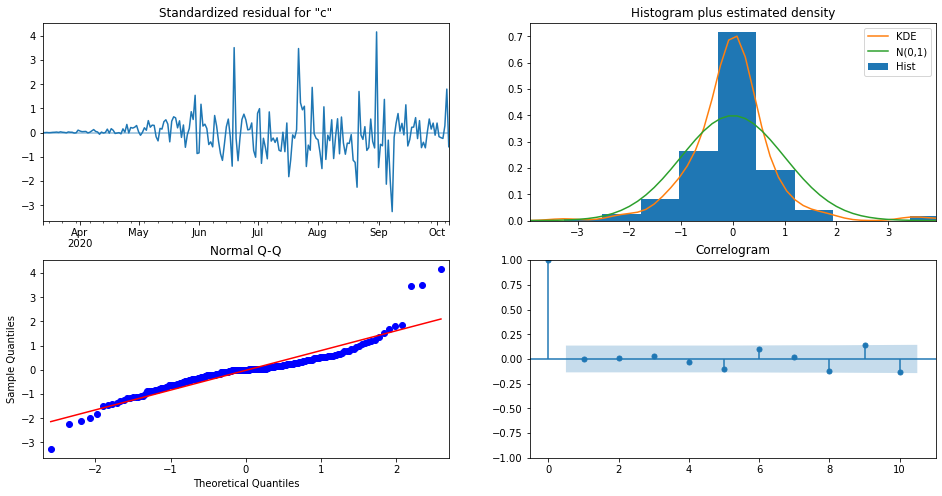

The Root Mean Squared Error of SARIMA with season_length=7 and dynamic = False 7941.76


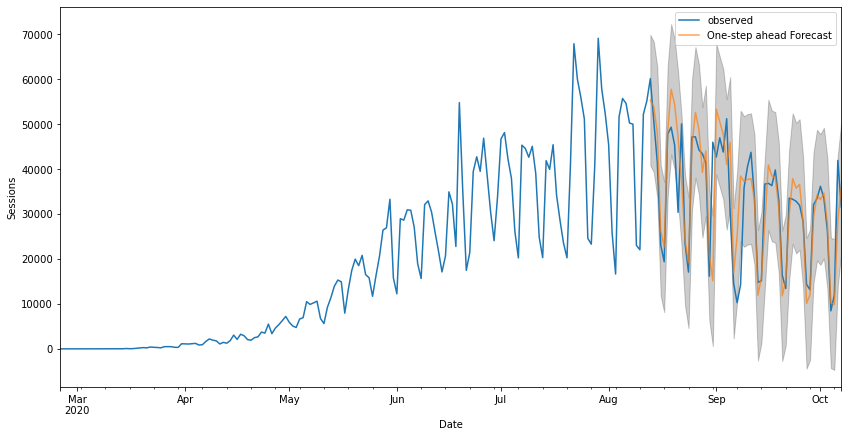

The Root Mean Squared Error of SARIMA with season_length=7 and dynamic = True 21096.77


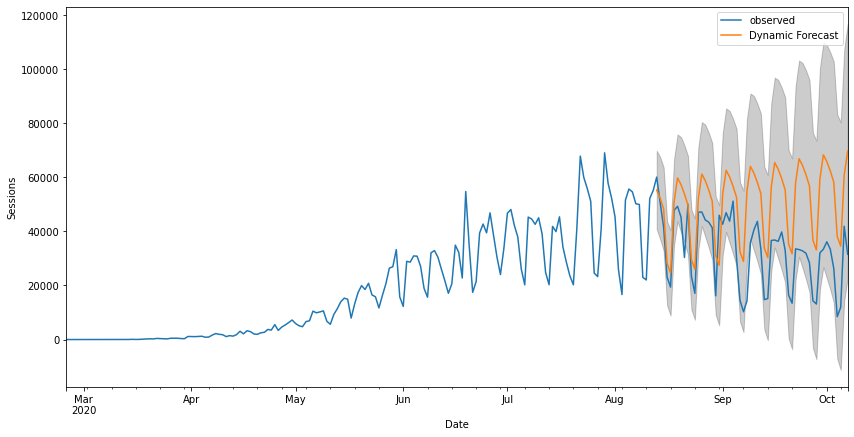

In [318]:
model = sarima_eva2(y,(1, 1, 1),(0, 1, 1, 7),7, y.index[split],y_to_val, RMSE3)

In [319]:
def forecast(model,predict_steps,y):
    
    pred_uc = model.get_forecast(steps=predict_steps)

    #SARIMAXResults.conf_int, can change alpha,the default alpha = .05 returns a 95% confidence interval.
    pred_ci = pred_uc.conf_int()

    ax = y.plot(label='observed', figsize=(14, 7))
#     print(pred_uc.predicted_mean)
    pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.25)
    ax.set_xlabel('Date')
    
    ax.set_ylabel(y.name)
    plt.ylim(bottom=-1)
    plt.legend()
    plt.show()
    
    # Produce the forcasted tables 
    pm = pred_uc.predicted_mean.reset_index()
    pm.columns = ['Date','Predicted_Mean']
    pci = pred_ci.reset_index()
    pci.columns = ['Date','Lower Bound','Upper Bound']
    final_table = pm.join(pci.set_index('Date'), on='Date')
    
    return (final_table)

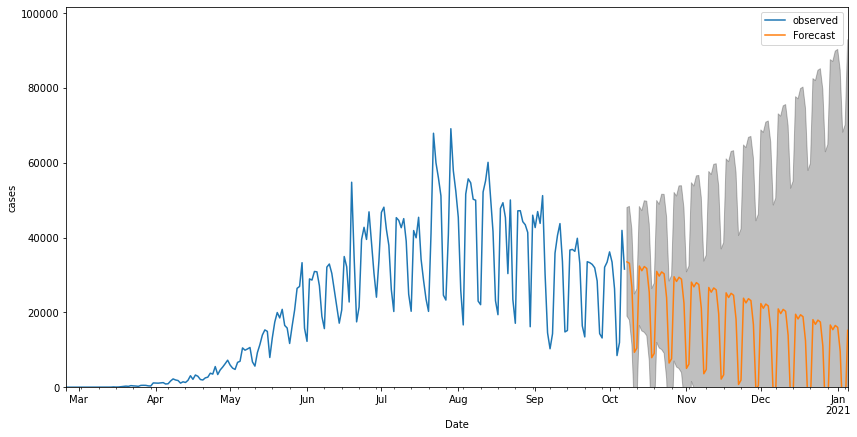

,Date,Predicted_Mean,Lower Bound,Upper Bound
0,2020-10-08,33489.73815469,18972.55618966,48006.92011972
1,2020-10-09,33124.17598473,17923.26109505,48325.09087441
2,2020-10-10,26753.98749102,11323.67590053,42184.29908152
3,2020-10-11,9323.35847987,-6278.35941510,24925.07637484
4,2020-10-12,10467.99388783,-5294.04909839,26230.03687406


In [320]:
final_table = forecast(model,90,y)
final_table.head()

In [321]:
# model deaths
sarima_grid_search(y_deaths,7)

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(0, 0, 0)x(0, 0, 0, 7) - AIC:3647.686001686622
SARIMA(0, 0, 0)x(0, 0, 1, 7) - AIC:3310.665721239427
SARIMA(0, 0, 0)x(0, 1, 0, 7) - AIC:2795.5558899599273
SARIMA(0, 0, 0)x(0, 1, 1, 7) - AIC:2711.393167945871
SARIMA(0, 0, 0)x(1, 0, 0, 7) - AIC:2809.0825214752713
SARIMA(0, 0, 0)x(1, 0, 1, 7) - AIC:2796.1404213859314
SARIMA(0, 0, 0)x(1, 1, 0, 7) - AIC:2721.6945758609463


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(0, 0, 0)x(1, 1, 1, 7) - AIC:2709.106931356395
SARIMA(0, 0, 1)x(0, 0, 0, 7) - AIC:3404.3515093132737


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 0, 1)x(0, 0, 1, 7) - AIC:3155.938790695581
SARIMA(0, 0, 1)x(0, 1, 0, 7) - AIC:2777.829119623341


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 0, 1)x(0, 1, 1, 7) - AIC:2688.5420408739583


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 0, 1)x(1, 0, 0, 7) - AIC:2802.7212297841083


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 0, 1)x(1, 0, 1, 7) - AIC:2772.993043083002
SARIMA(0, 0, 1)x(1, 1, 0, 7) - AIC:2709.711454538159


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 0, 1)x(1, 1, 1, 7) - AIC:2687.5562324709317
SARIMA(0, 1, 0)x(0, 0, 0, 7) - AIC:3119.721477558473
SARIMA(0, 1, 0)x(0, 0, 1, 7) - AIC:2938.911642353063
SARIMA(0, 1, 0)x(0, 1, 0, 7) - AIC:2877.8949908247832


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(0, 1, 0)x(0, 1, 1, 7) - AIC:2714.8218843094683
SARIMA(0, 1, 0)x(1, 0, 0, 7) - AIC:2865.780639067612


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 1, 0)x(1, 0, 1, 7) - AIC:2802.4488818543514
SARIMA(0, 1, 0)x(1, 1, 0, 7) - AIC:2765.048956129507


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 1, 0)x(1, 1, 1, 7) - AIC:2716.81249075285
SARIMA(0, 1, 1)x(0, 0, 0, 7) - AIC:3108.5458150495615


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 1, 1)x(0, 0, 1, 7) - AIC:2884.9860182091065
SARIMA(0, 1, 1)x(0, 1, 0, 7) - AIC:2745.5843168211695


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 1, 1)x(0, 1, 1, 7) - AIC:2611.8119048472518
SARIMA(0, 1, 1)x(1, 0, 0, 7) - AIC:2757.559318562641


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 1, 1)x(1, 0, 1, 7) - AIC:2695.7968480575514
SARIMA(0, 1, 1)x(1, 1, 0, 7) - AIC:2647.9637084709784


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(0, 1, 1)x(1, 1, 1, 7) - AIC:2613.796773665591
SARIMA(1, 0, 0)x(0, 0, 0, 7) - AIC:3129.2674042383087
SARIMA(1, 0, 0)x(0, 0, 1, 7) - AIC:2945.562562941923

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will


SARIMA(1, 0, 0)x(0, 1, 0, 7) - AIC:2786.6340244219737
SARIMA(1, 0, 0)x(0, 1, 1, 7) - AIC:2689.2719508592513

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)



SARIMA(1, 0, 0)x(1, 0, 0, 7) - AIC:2787.5467201489864


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 0)x(1, 0, 1, 7) - AIC:2773.667290787622
SARIMA(1, 0, 0)x(1, 1, 0, 7) - AIC:2689.1537177475648


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 0)x(1, 1, 1, 7) - AIC:2690.6055474284885
SARIMA(1, 0, 1)x(0, 0, 0, 7) - AIC:3118.3684895031074


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 1)x(0, 0, 1, 7) - AIC:2900.090460384753
SARIMA(1, 0, 1)x(0, 1, 0, 7) - AIC:2757.9394291789836

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 1)x(0, 1, 1, 7) - AIC:2624.5452049328946


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will

SARIMA(1, 0, 1)x(1, 0, 0, 7) - AIC:2759.040397681004
SARIMA(1, 0, 1)x(1, 0, 1, 7) - AIC:2708.928493137293


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 1)x(1, 1, 0, 7) - AIC:2648.3529295777316


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 0, 1)x(1, 1, 1, 7) - AIC:2626.499992128378
SARIMA(1, 1, 0)x(0, 0, 0, 7) - AIC:3121.6275495361515
SARIMA(1, 1, 0)x(0, 0, 1, 7) - AIC:2933.2185086628706


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequ

SARIMA(1, 1, 0)x(0, 1, 0, 7) - AIC:2819.299666656239
SARIMA(1, 1, 0)x(0, 1, 1, 7) - AIC:2675.1673447706817

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)



SARIMA(1, 1, 0)x(1, 0, 0, 7) - AIC:2806.2131859390684
SARIMA(1, 1, 0)x(1, 0, 1, 7) - AIC:2761.0939034677335
SARIMA(1, 1, 0)x(1, 1, 0, 7) - AIC:2698.693974094731


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 0)x(1, 1, 1, 7) - AIC:2677.088770729941
SARIMA(1, 1, 1)x(0, 0, 0, 7) - AIC:3057.4647988786783


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 1)x(0, 0, 1, 7) - AIC:2865.4353245859747
SARIMA(1, 1, 1)x(0, 1, 0, 7) - AIC:2747.2937613404083


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 1)x(0, 1, 1, 7) - AIC:2613.341989262735


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 1)x(1, 0, 0, 7) - AIC:2746.678763175617


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 1)x(1, 0, 1, 7) - AIC:2697.374132749893
SARIMA(1, 1, 1)x(1, 1, 0, 7) - AIC:2638.030763950058

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


SARIMA(1, 1, 1)x(1, 1, 1, 7) - AIC:2615.3362906880875
The set of parameters with the minimum AIC is: SARIMA(0, 1, 1)x(0, 1, 1, 7) - AIC:2611.8119048472518


C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8241      0.034    -24.420      0.000      -0.890      -0.758
ma.S.L7       -0.5733      0.049    -11.797      0.000      -0.669      -0.478
sigma2      1.514e+04    974.210     15.544      0.000    1.32e+04    1.71e+04


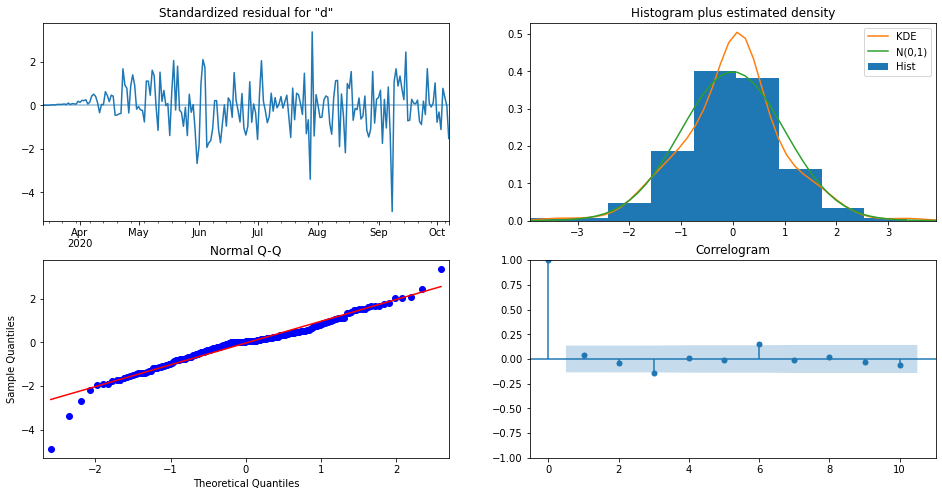

The Root Mean Squared Error of SARIMA with season_length=7 and dynamic = False 141.97


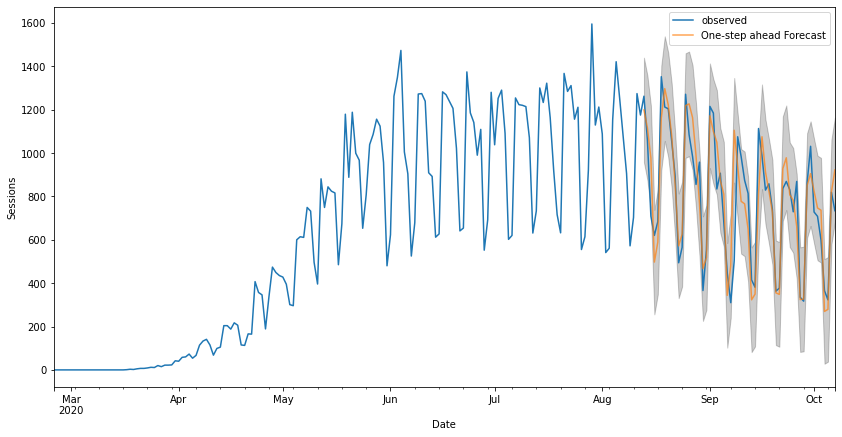

The Root Mean Squared Error of SARIMA with season_length=7 and dynamic = True 205.29


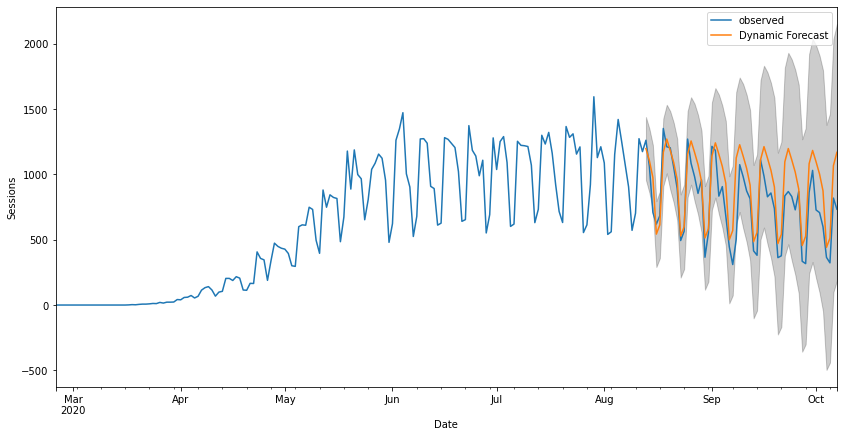

In [322]:
deaths_to_train = y_deaths[:split]
deaths_to_val = y_deaths[split:]
model_deaths = sarima_eva(y_deaths,(0, 1, 1),(0, 1, 1, 7),7, y_deaths.index[split],deaths_to_val)

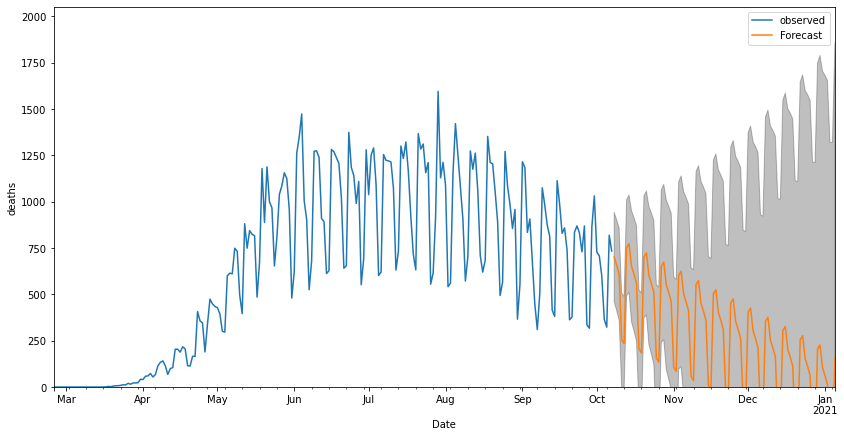

,Date,Predicted_Mean,Lower Bound,Upper Bound
0,2020-10-08,700.87634782,459.69022916,942.06246648
1,2020-10-09,657.53004097,412.63987131,902.42021062
2,2020-10-10,609.09871886,360.55969465,857.63774307
3,2020-10-11,255.46877639,3.33369768,507.60385509
4,2020-10-12,233.45965131,-22.22090969,489.14021231


In [323]:
final_deaths = forecast(model_deaths,90,y_deaths)
final_deaths.head()

<a id="Brazilses"></a>

## SES
[▲ Return to contents](#Contents)

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\holtwinters\model.py:429: FutureWarning: After 0.13 initialization must be handled at model creation
  FutureWarning,
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\holtwinters\model.py:429: FutureWarning: After 0.13 initialization must be handled at model creation
  FutureWarning,
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\holtwinters\model.py:922: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning,


The Root Mean Squared Error of our forecasts with smoothing level of 0.8 is 24317.91
The Root Mean Squared Error of our forecasts with auto optimization is 17001.48


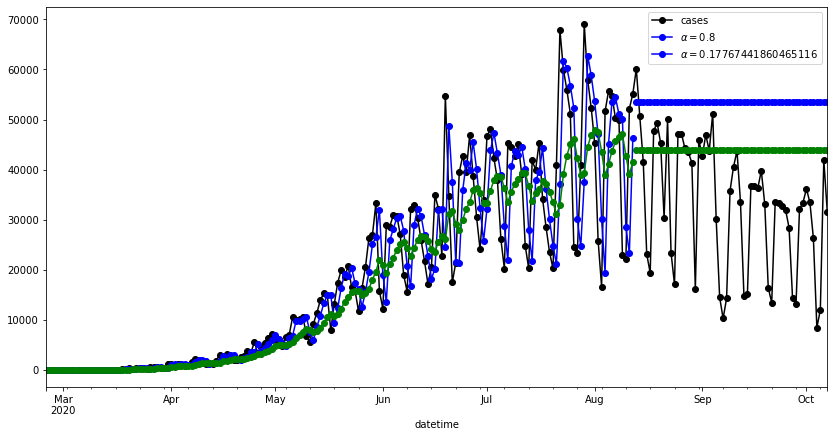

In [324]:
ses2(y, y_to_train,y_to_val,0.8,predict_date, RMSE3)

<a id="Brazilarima"></a>

## ARIMA
[▲ Return to contents](#Contents)

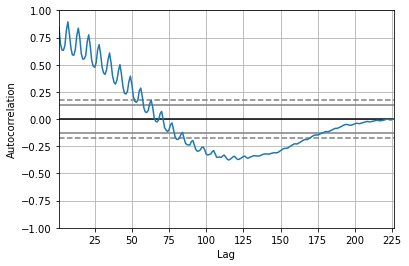

In [325]:
autocorrelation_plot(y)
plt.show()

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                               SARIMAX Results                                
Dep. Variable:                  cases   No. Observations:                  226
Model:                ARIMA(10, 2, 0)   Log Likelihood               -2282.074
Date:                Mon, 14 Dec 2020   AIC                           4586.149
Time:                        03:28:38   BIC                           4623.677
Sample:                    02-25-2020   HQIC                          4601.297
                         - 10-07-2020                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.4528      0.058    -24.885      0.000      -1.567      -1.338
ar.L2         -1.8766      0.088    -21.404      0.000      -2.048      -1.705
ar.L3         -2.0601      0.122    -16.918      0.0

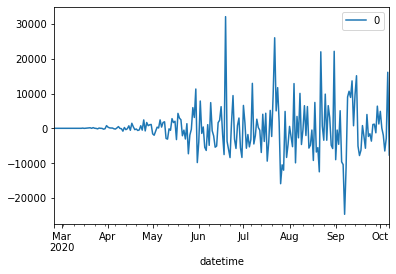

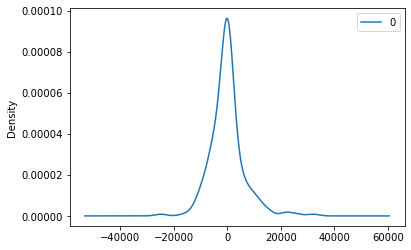

                    0
count    226.00000000
mean       1.24337605
std     6337.15677840
min   -24737.03645376
25%    -3093.77955740
50%       -0.24402822
75%     1627.15509726
max    32118.49197973


In [326]:

# fit model
model = ARIMA(y, order=(10,2,0))
model_fit = model.fit()
print(model_fit.summary())
# plot residual errors
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
plt.show()
residuals.plot(kind='kde')
plt.show()
print(residuals.describe())

C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:965: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\Users\felic\Anaconda3\envs\cs109a\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization faile

Test MSE: 9451.936


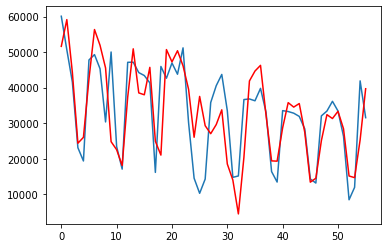

In [327]:
train, test = y_to_train.values, y_to_val.values
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(10,2,0))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)
    #print('predicted=%f, expected=%f' % (yhat, obs))
error = mean_squared_error(test, predictions, squared=False)
RMSE3['arima'] = round(error, 2)
print('Test MSE: %.3f' % error)
# plot
plt.plot(test)
plt.plot(predictions, color='red')
plt.show()

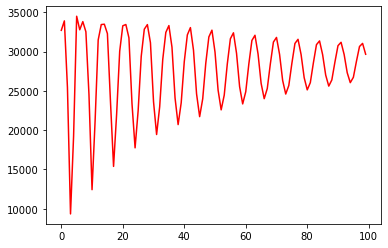

In [328]:
model = ARIMA(y.values, order=(10,2,0))
model_fit = model.fit()
output = model_fit.forecast(steps=100)
    

plt.plot(output, color='red')
plt.show()

<a id="Brazilchoose"></a>
## Choosing a time series model
[▲ Return to contents](#Contents)

In [329]:
RMSE3

{'sarima': 7941.76,
 'sarima_dynamic': 21096.77,
 'ses': 17001.48,
 'arima': 9451.94}

In [330]:
rmse_sort3 = dict(sorted(RMSE3.items(), key=operator.itemgetter(1)))

In [331]:
rmse_sort3

{'sarima': 7941.76,
 'arima': 9451.94,
 'ses': 17001.48,
 'sarima_dynamic': 21096.77}

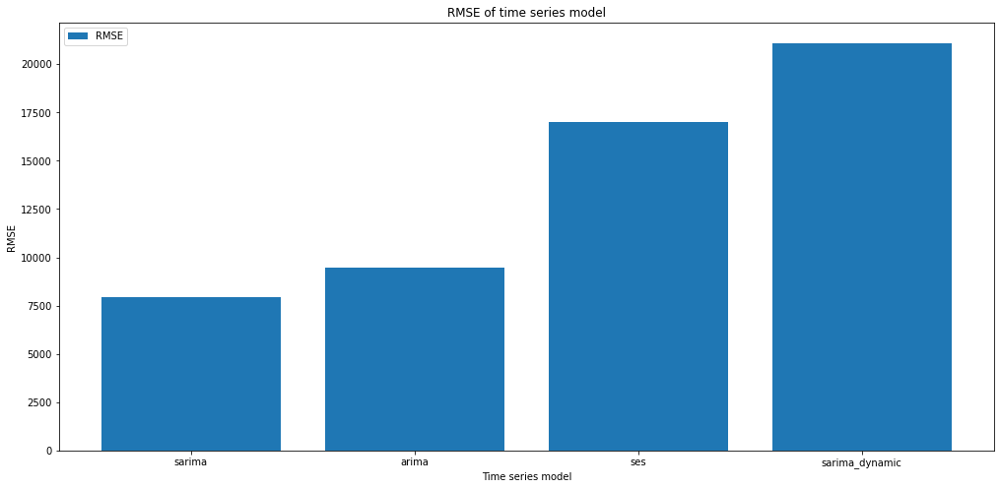

In [332]:
plt.figure(figsize=(17,8))
plt.bar(rmse_sort3.keys(), rmse_sort3.values(), label="RMSE")
plt.legend()
plt.title("RMSE of time series model")
plt.ylabel("RMSE")
plt.xlabel("Time series model")
plt.xticks()
plt.show();

<a id="Conclusion"></a>

# Conclusion
[▲ Return to contents](#Contents)

<a id="Combinedvisuals"></a>

## Combined visualizations
[▲ Return to contents](#Contents)

In [333]:
brazil_daily = df_brazil['new_cases'].values

In [334]:
south_daily = df_sk.iloc[34:]['new_cases'].values

In [335]:
india_daily = df_india_counts.iloc[26:]['new_cases'].values

In [336]:
brazil_deaths = df_brazil['new_deaths'].values

In [337]:
south_deaths = df_sk.iloc[34:]['new_deaths'].values

In [338]:
india_deaths = df_india_counts.iloc[26:]['new_death'].values

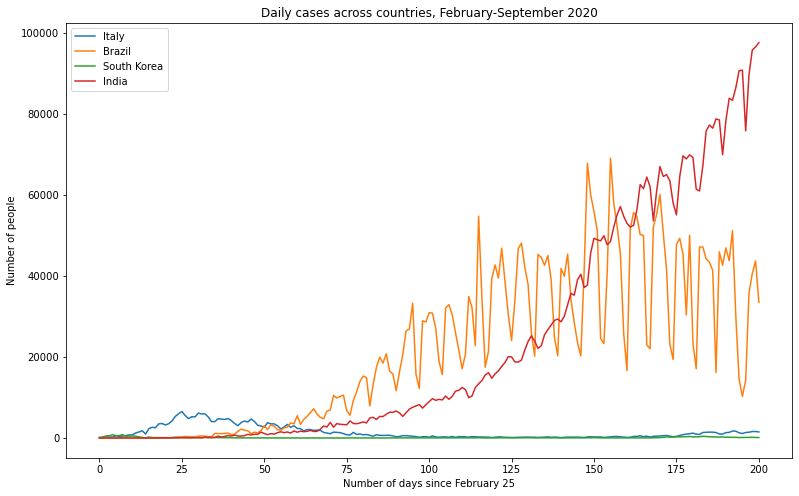

In [339]:
plt.figure(figsize=(13,8))
plt.plot(range(201), national_dailynewcases[1:], label="Italy")
plt.plot(range(201), brazil_daily[:201], label="Brazil")
plt.plot(range(201), south_daily[:201], label="South Korea")
plt.plot(range(201), india_daily[:201], label="India")

plt.legend()
plt.title("Daily cases across countries, February-September 2020")
plt.ylabel("Number of people")
plt.xlabel("Number of days since February 25")

plt.savefig('cases_all.jpg', dpi=400)

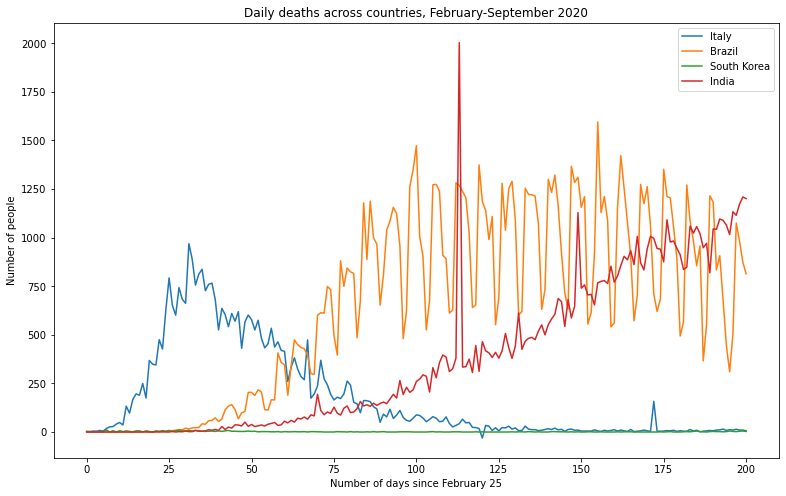

In [340]:
plt.figure(figsize=(13,8))
plt.plot(range(201), daily_deaths_italy[1:], label="Italy")
plt.plot(range(201), brazil_deaths[:201], label="Brazil")
plt.plot(range(201), south_deaths[:201], label="South Korea")
plt.plot(range(201), india_deaths[:201], label="India")

plt.legend()
plt.title("Daily deaths across countries, February-September 2020")
plt.ylabel("Number of people")
plt.xlabel("Number of days since February 25")

plt.savefig('deaths_all.jpg', dpi=400)